In [1]:
from itertools import product
import glob
import pickle

import numpy as np
import numpy.ma as ma
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from cartopy.feature import NaturalEarthFeature
import xarray as xr
from scipy.ndimage import gaussian_filter
import datetime

import xesmf as xe
import metpy.calc as mpcalc
from minisom import MiniSom,asymptotic_decay
from collections import Counter
#import sklearn
#from sklearn.metrics import mean_squared_error

In [2]:
# reading in met table statistics
centers_filtered_new=pd.read_csv('filtered_centers_comet_144.csv')
centers_date_pd=pd.DataFrame(centers_filtered_new['date'])
centers_mask=centers_date_pd['date'].apply(lambda x: pd.to_datetime(str(x[:-7]), format='%Y%m%d'))
centers_filtered_new['fmt_date']=centers_mask

lon=centers_filtered_new['x']
lat=centers_filtered_new['y']

In [3]:
centers_filtered_new[(centers_filtered_new['case'].astype(str).str[0]=='F')&(np.isnan(centers_filtered_new['interest']))]

,Unnamed: 0.1,Unnamed: 0,intersect,obs,forecast,date,level_0,index,x,y,...,interest,area,bound_dist,percentile_90,centroid_dist,length,julian_date,real_date,ddif,fmt_date
3,4,14,-999.0,-999.0,-999.0,19851216_000000,1336,0,-138.34514,47.37789,...,NaN,NaN,NaN,730.88442,NaN,116.72616,350,NaN,NaN,1985-12-16
9,10,26,-999.0,-999.0,-999.0,19851228_000000,1338,2,-136.55616,29.66671,...,NaN,NaN,NaN,773.58131,NaN,77.71167,362,NaN,NaN,1985-12-28
20,23,56,-999.0,-999.0,-999.0,19860127_000000,1340,4,-134.89201,34.25638,...,NaN,NaN,NaN,797.10540,NaN,101.29009,27,NaN,NaN,1986-01-27
21,24,57,-999.0,-999.0,-999.0,19860128_000000,1341,5,-139.24941,24.18238,...,NaN,NaN,NaN,726.11353,NaN,62.51831,28,NaN,NaN,1986-01-28
23,27,63,-999.0,-999.0,-999.0,19860203_000000,1342,6,-156.68142,43.45281,...,NaN,NaN,NaN,728.41322,NaN,60.86167,34,NaN,NaN,1986-02-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1536,1625,3769,-999.0,-999.0,-999.0,20170121_000000,1686,350,-125.01724,29.49631,...,NaN,NaN,NaN,707.10539,NaN,66.65252,21,NaN,NaN,2017-01-21
1538,1627,3771,-999.0,-999.0,-999.0,20170123_000000,1688,352,-125.08756,32.65211,...,NaN,NaN,NaN,692.34269,NaN,67.68022,23,NaN,NaN,2017-01-23
1540,1630,3773,-999.0,-999.0,-999.0,20170125_000000,1689,353,-137.71757,44.27022,...,NaN,NaN,NaN,700.04298,NaN,94.91357,25,NaN,NaN,2017-01-25
1553,1646,3823,-999.0,-999.0,-999.0,20170316_000000,1691,355,-149.56203,31.68784,...,NaN,NaN,NaN,698.83145,NaN,101.46987,75,NaN,NaN,2017-03-16


In [4]:
centers_filtered_new.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'intersect', 'obs', 'forecast', 'date',
       'level_0', 'index', 'x', 'y', 'case', 'fcsthr', 'met_x', 'met_y',
       'interest', 'area', 'bound_dist', 'percentile_90', 'centroid_dist',
       'length', 'julian_date', 'real_date', 'ddif', 'fmt_date'],
      dtype='object')

In [5]:
centers_filtered_new['intersect']=centers_filtered_new['intersect'].replace(-999.0, np.nan)
centers_filtered_new['obs']=centers_filtered_new['obs'].replace(-999.0, np.nan)
centers_filtered_new['forecast']=centers_filtered_new['forecast'].replace(-999.0, np.nan)

In [6]:
centers_filtered_new['moe_x']=centers_filtered_new['intersect'].div((centers_filtered_new['obs'].values))
centers_filtered_new['moe_y']=centers_filtered_new['intersect'].div((centers_filtered_new['forecast'].values))
centers_filtered_new['dist']=np.sqrt(((1-centers_filtered_new['moe_x'])**2) + ((1-centers_filtered_new['moe_y'])**2))

In [7]:
Fa=np.where((centers_filtered_new['case'].astype(str).str[0]=='F')&(np.isnan(centers_filtered_new['interest']))
   | (centers_filtered_new['case'].astype(str).str[0]=='O'))

In [8]:
centers_miss_fa=centers_filtered_new.iloc[Fa]
justfa=np.where((centers_filtered_new['case'].astype(str).str[0]=='F')&(np.isnan(centers_filtered_new['interest'])))
justm=np.where((centers_filtered_new['case'].astype(str).str[0]=='O'))
centers_miss=centers_filtered_new.iloc[justm]
centers_fa=centers_filtered_new.iloc[justfa]

In [9]:
centers_mask=~centers_filtered_new['fmt_date'].isin(centers_miss_fa['fmt_date'])
centers_nonmatch=centers_filtered_new['fmt_date'].isin(centers_miss_fa['fmt_date'])


centers_matched=centers_filtered_new[centers_mask]
centers_unmatch=centers_filtered_new[centers_nonmatch]

In [10]:
lon_match=centers_matched['x']
lat_match=centers_matched['y']

lon_unmatch=centers_unmatch['x']
lat_unmatch=centers_unmatch['y']

In [11]:
diff_forecast=xr.open_dataset('diff_matched.nc')

In [12]:
diff_forecast

<xarray.Dataset>
Dimensions:   (y: 56, x: 56, time: 849)
Coordinates:
    lon       (y) float64 ...
    lat       (x) float64 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float64 ...

In [13]:
diff_stack=diff_forecast['variable'].stack(new=('y','x'))

In [14]:
diff_stack

<xarray.DataArray 'variable' (time: 849, new: 3136)>
array([[-399.74391302, -368.81664654, -327.12626836, ..., -166.41355739,
        -145.57946058, -126.43582237],
       [-134.35164718,  -78.38426716, -117.73423582, ...,   74.43386373,
         118.73561389,  158.13356853],
       [-146.85989412, -149.19626782, -133.08989464, ..., -570.1259969 ,
        -493.30878402, -426.61829001],
       ...,
       [ 154.34731261,  128.62587755,  102.57659043, ...,   50.29162368,
          25.38420612,   -4.29540029],
       [  86.41083545,   79.27011256,   42.28878439, ...,    6.96828478,
           5.45096175,    5.7877871 ],
       [ 130.3363408 ,  137.65534144,  133.34760828, ...,  372.3549434 ,
         351.94975021,  326.55966423]])
Coordinates:
    lon      (new) float64 -155.5 -155.5 -155.5 -155.5 ... -141.8 -141.8 -141.8
    lat      (new) float64 35.0 35.25 35.5 35.75 36.0 ... 48.0 48.25 48.5 48.75
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
  * new      (new) object MultiIndex
  * y        (new) int64 0 0 0 0 0 0 0 0 0 0 0 ... 55 55 55 55 55 55 55 55 55 55
  * x        (new) int64 0 1 2 3 4 5 6 7 8 9 ... 46 47 48 49 50 51 52 53 54 55

In [15]:
centers_miss['x'][centers_miss['fmt_date']=='1997-12-21']

601   -155.87397
Name: x, dtype: float64

In [16]:
dist_mask=centers_matched['fmt_date'].isin(pd.to_datetime(diff_forecast['time']))

In [17]:
miss_mask=centers_miss['fmt_date'].isin(pd.to_datetime(diff_forecast['time']))
fa_mask=centers_fa['fmt_date'].isin(pd.to_datetime(diff_forecast['time']))

In [18]:
dist_new=xr.Dataset({'variable': (['time'],centers_matched['dist'][dist_mask])},
             coords={"lon":(["y"],diff_forecast['lon'].data), #should change to lonlist/latlist 
                     "lat":(["x"],diff_forecast['lat'].data),
                    "time":(["time"],diff_forecast['time'].data)})

In [19]:
# dist_new.to_netcdf('144hrdist_56x56.nc')

In [20]:
miss_new=xr.Dataset({'variable': (['time'],centers_miss['fmt_date'][miss_mask])},
             coords={"lon":(["y"],diff_forecast['lon'].data), #should change to lonlist/latlist 
                     "lat":(["x"],diff_forecast['lat'].data),
                    "time":(["time"],centers_miss['fmt_date'][miss_mask])})

In [21]:
fa_new=xr.Dataset({'variable': (['time'],centers_fa['fmt_date'][fa_mask])},
             coords={"lon":(["y"],diff_forecast['lon'].data), #should change to lonlist/latlist 
                     "lat":(["x"],diff_forecast['lat'].data),
                    "time":(["time"],centers_fa['fmt_date'][fa_mask])})

In [22]:
landfall=pd.read_csv('WC-Landfalling-AR-Events-Master-10-19.csv')

In [23]:
landfall

,Event Start,Event Dur,maxScale,maxLocDur,maxIVT,maxIVTLat,maxScaletime,Type
0,2009101306,120,5,108,1007,37,2009101306,Ncyc
1,2009102300,18,1,18,689,48,2009102306,Ncyc
2,2009102518,12,1,12,574,47,2009102518,Ncyc
3,2009102806,78,2,42,731,48,2009102912,Scyc
4,2009110506,24,2,24,640,44,2009110506,Ncyc
...,...,...,...,...,...,...,...,...
248,2019022418,78,3,54,708,37,2019022600,NDcyc
249,2019030112,24,1,24,513,35,2019030118,Ncyc
250,2019040506,60,3,60,731,44,2019040506,NDcyc
251,2019041806,24,2,24,508,47,2019041806,Ncyc


In [24]:
landfmt=landfall['maxScaletime'].apply(lambda x :str(x)[0:4]+'-'+str(x)[4:6]+'-'+str(x)[6:8])

In [25]:
landfmt

0      2009-10-13
1      2009-10-23
2      2009-10-25
3      2009-10-29
4      2009-11-05
          ...    
248    2019-02-26
249    2019-03-01
250    2019-04-05
251    2019-04-18
252    2019-04-22
Name: maxScaletime, Length: 253, dtype: object

In [26]:
# regridwrf_match['variable'][pv_mask].isel(time=0).plot()

In [27]:
# era5['variable'][pv_mask].isel(time=0).plot()

In [28]:
diff_forecast['variable']

<xarray.DataArray 'variable' (time: 849, y: 56, x: 56)>
array([[[-399.743913, -368.816647, ...,  -39.615407,  -19.47594 ],
        [-425.133609, -401.278302, ...,  -11.420476,   26.004915],
        ...,
        [ -94.960954, -108.313138, ..., -156.310472, -140.707833],
        [ -94.980577, -110.803955, ..., -145.579461, -126.435822]],

       [[-134.351647,  -78.384267, ...,  136.494484,  122.843955],
        [-217.261883, -144.564043, ...,  147.163156,  134.748267],
        ...,
        [-213.419768, -233.492151, ...,  125.156526,  170.553453],
        [-226.483278, -244.514859, ...,  118.735614,  158.133569]],

       ...,

       [[  86.410835,   79.270113, ...,  -34.998019,  -29.50869 ],
        [   4.311028,   70.349568, ...,  -50.570022,  -43.783085],
        ...,
        [ -76.728705,  -70.254194, ...,   29.592023,   27.468023],
        [ -57.056398,  -50.354322, ...,    5.450962,    5.787787]],

       [[ 130.336341,  137.655341, ...,  -83.348806,  -87.206351],
        [ 177.877115,  134.773509, ...,  -91.342514,  -97.153388],
        ...,
        [ -75.289155,  -78.223029, ...,  343.853565,  315.295533],
        [ -77.749856,  -82.376297, ...,  351.94975 ,  326.559664]]])
Coordinates:
    lon      (y) float64 -155.5 -155.2 -155.0 -154.8 ... -142.2 -142.0 -141.8
    lat      (x) float64 35.0 35.25 35.5 35.75 36.0 ... 48.0 48.25 48.5 48.75
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x

In [29]:
def normalize_data(data):
    """
    Function for normalizing data prior to training using z-score
    """
    return (data - np.nanmean(data)) / np.nanstd(data)

In [30]:
pv=xr.open_dataset('nonsmooth_pv_144_jan2024.nc')
slp_final=xr.open_dataset('slp_matched_final.nc')

In [31]:
pv

<xarray.Dataset>
Dimensions:   (time: 1551, y: 200, x: 200)
Coordinates:
    lon       (y, x) float32 ...
    lat       (y, x) float32 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float32 ...

In [32]:
pv_mask=pv['time'].isin(slp_final['time'])

In [33]:
column_names=['year','month','day', 'x_amp','y_amp','phase']

In [34]:
mjo=pd.read_csv('psl.noaa.gov_mjo_mjoindex_rMII_index_latest.txt',header=None)

In [35]:
mjo_2017=mjo.iloc[0:14245]

In [36]:
mjo_2017.to_csv('mjo2017.csv')

In [37]:
mjo_2017_filtered=pd.read_csv('mjo2017.csv')

In [38]:
data_lines=[]
with open('psl.noaa.gov_mjo_mjoindex_rMII_index_latest.txt','r') as data_file:
    for line in data_file:
        data = line.split()
        data_lines.append(data)

In [39]:
mjo_datatable=pd.DataFrame(data_lines,columns=column_names)

In [40]:
mjo_datatable

,year,month,day,x_amp,y_amp,phase
0,1979,1,1,0.00000,0.00000,5
1,1979,1,2,0.00000,0.00000,5
2,1979,1,3,0.00000,0.00000,5
3,1979,1,4,0.00000,0.00000,5
4,1979,1,5,0.00000,0.00000,5
...,...,...,...,...,...,...
16122,2023,2,21,nan,nan,-9223372036854775808
16123,2023,2,22,nan,nan,-9223372036854775808
16124,2023,2,23,nan,nan,-9223372036854775808
16125,2023,2,24,nan,nan,-9223372036854775808


In [41]:
mjo_datatable['year']+mjo_datatable['month']+mjo_datatable['day']

0         197911
1         197912
2         197913
3         197914
4         197915
          ...   
16122    2023221
16123    2023222
16124    2023223
16125    2023224
16126    2023225
Length: 16127, dtype: object

In [42]:
mjo_datatable['month']=mjo_datatable['month'].apply(lambda x: str(x).zfill(2) if int(x) < 10 else x)

In [43]:
mjo_datatable['day']=mjo_datatable['day'].apply(lambda x: str(x).zfill(2) if int(x) < 10 else x)

In [44]:
mjo_datatable

,year,month,day,x_amp,y_amp,phase
0,1979,01,01,0.00000,0.00000,5
1,1979,01,02,0.00000,0.00000,5
2,1979,01,03,0.00000,0.00000,5
3,1979,01,04,0.00000,0.00000,5
4,1979,01,05,0.00000,0.00000,5
...,...,...,...,...,...,...
16122,2023,02,21,nan,nan,-9223372036854775808
16123,2023,02,22,nan,nan,-9223372036854775808
16124,2023,02,23,nan,nan,-9223372036854775808
16125,2023,02,24,nan,nan,-9223372036854775808


In [45]:
mjo_datatable['year']+'-'+mjo_datatable['month']+'-'+mjo_datatable['day']

0        1979-01-01
1        1979-01-02
2        1979-01-03
3        1979-01-04
4        1979-01-05
            ...    
16122    2023-02-21
16123    2023-02-22
16124    2023-02-23
16125    2023-02-24
16126    2023-02-25
Length: 16127, dtype: object

In [46]:
mjo_datatable['fmt_date']=mjo_datatable['year']+'-'+mjo_datatable['month']+'-'+mjo_datatable['day']

In [47]:
mjo_datatable

,year,month,day,x_amp,y_amp,phase,fmt_date
0,1979,01,01,0.00000,0.00000,5,1979-01-01
1,1979,01,02,0.00000,0.00000,5,1979-01-02
2,1979,01,03,0.00000,0.00000,5,1979-01-03
3,1979,01,04,0.00000,0.00000,5,1979-01-04
4,1979,01,05,0.00000,0.00000,5,1979-01-05
...,...,...,...,...,...,...,...
16122,2023,02,21,nan,nan,-9223372036854775808,2023-02-21
16123,2023,02,22,nan,nan,-9223372036854775808,2023-02-22
16124,2023,02,23,nan,nan,-9223372036854775808,2023-02-23
16125,2023,02,24,nan,nan,-9223372036854775808,2023-02-24


In [48]:
new_mjo=pd.read_csv('greta_mjo_data.csv')

In [49]:
new_mjo

,Year,Month,Day,Phase,Amplitude
0,1974,6,1,5,2.029480
1,1974,6,2,5,1.897290
2,1974,6,3,5,1.864760
3,1974,6,4,5,1.830920
4,1974,6,5,5,2.033260
...,...,...,...,...,...
16355,2019,12,27,7,1.517149
16356,2019,12,28,7,1.242918
16357,2019,12,29,7,1.225298
16358,2019,12,30,7,1.026616


In [50]:
# new_time=diff_forecast['time'][pv_mask].to_dataframe()

In [51]:
with open('som_matched_144_3.05_final.p', 'rb') as infile:
        som_matched = pickle.load(infile)

In [52]:
# pv['__xarray_dataarray_variable__'][pv_mask]

In [53]:
# pv_new=mpcalc.smooth_gaussian(pv['__xarray_dataarray_variable__'][pv_mask],1)

In [54]:
# pv_new.isel(time=0).plot()

In [55]:
diff_forecast['variable']

<xarray.DataArray 'variable' (time: 849, y: 56, x: 56)>
array([[[-399.743913, -368.816647, ...,  -39.615407,  -19.47594 ],
        [-425.133609, -401.278302, ...,  -11.420476,   26.004915],
        ...,
        [ -94.960954, -108.313138, ..., -156.310472, -140.707833],
        [ -94.980577, -110.803955, ..., -145.579461, -126.435822]],

       [[-134.351647,  -78.384267, ...,  136.494484,  122.843955],
        [-217.261883, -144.564043, ...,  147.163156,  134.748267],
        ...,
        [-213.419768, -233.492151, ...,  125.156526,  170.553453],
        [-226.483278, -244.514859, ...,  118.735614,  158.133569]],

       ...,

       [[  86.410835,   79.270113, ...,  -34.998019,  -29.50869 ],
        [   4.311028,   70.349568, ...,  -50.570022,  -43.783085],
        ...,
        [ -76.728705,  -70.254194, ...,   29.592023,   27.468023],
        [ -57.056398,  -50.354322, ...,    5.450962,    5.787787]],

       [[ 130.336341,  137.655341, ...,  -83.348806,  -87.206351],
        [ 177.877115,  134.773509, ...,  -91.342514,  -97.153388],
        ...,
        [ -75.289155,  -78.223029, ...,  343.853565,  315.295533],
        [ -77.749856,  -82.376297, ...,  351.94975 ,  326.559664]]])
Coordinates:
    lon      (y) float64 -155.5 -155.2 -155.0 -154.8 ... -142.2 -142.0 -141.8
    lat      (x) float64 35.0 35.25 35.5 35.75 36.0 ... 48.0 48.25 48.5 48.75
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x

In [56]:
pv

<xarray.Dataset>
Dimensions:   (time: 1551, y: 200, x: 200)
Coordinates:
    lon       (y, x) float32 ...
    lat       (y, x) float32 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float32 ...

In [57]:
#era5ss_match['variable']

In [58]:
#smooth_fcst['__xarray_dataarray_variable__']

In [59]:
diff_stack.shape

(849, 3136)

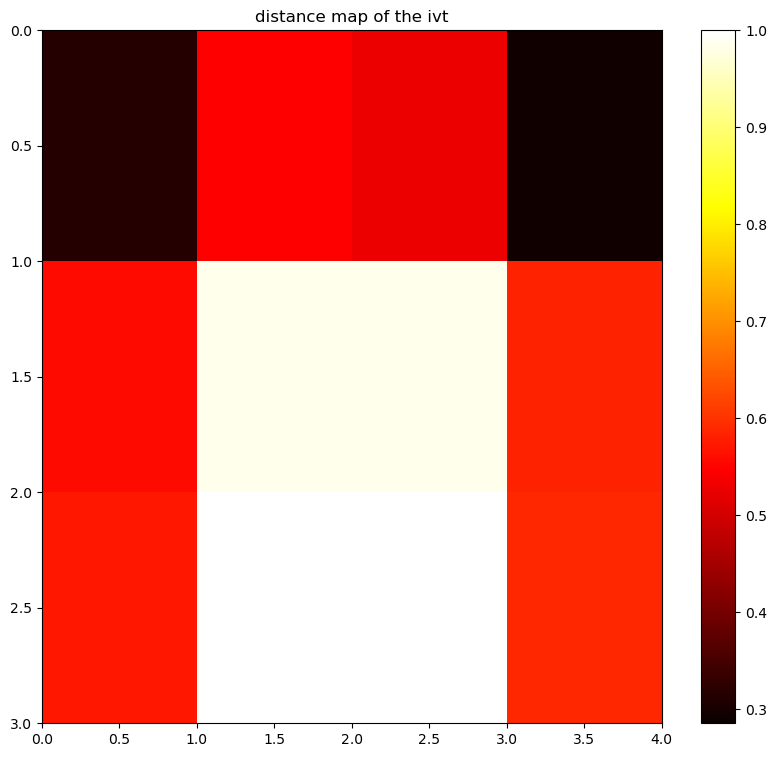

849
[0 1 2 3 3 2 3 1 3 1 2 1 3 3 3 2 3 0 0 1 3 3 0 1 0 3 3 2 1 3 3 2 3 2 3 3 1
 0 1 0 3 0 3 3 0 2 1 2 2 3 3 2 1 0 2 1 3 3 3 1 0 3 1 2 3 0 0 1 0 2 1 0 0 0
 0 1 3 3 2 0 3 2 3 2 2 2 1 0 3 0 2 3 0 0 0 0 0 0 1 2 1 1 1 1 3 0 1 1 2 3 0
 2 0 3 1 3 0 0 2 1 1 3 2 2 0 0 3 0 1 1 3 2 3 0 0 0 0 0 2 1 0 2 3 0 0 0 3 3
 1 2 3 0 3 2 2 3 0 1 0 0 0 0 1 1 1 2 0 0 2 0 0 1 0 1 0 0 0 1 1 3 0 2 0 3 3
 1 0 2 0 2 1 3 0 0 2 2 3 3 0 0 0 3 0 0 0 1 2 2 1 0 3 2 3 2 1 1 0 2 3 1 2 1
 2 0 2 2 0 0 3 0 3 2 2 2 1 3 0 3 1 2 0 0 3 1 0 2 3 3 3 3 1 0 0 0 0 0 0 1 0
 0 2 1 0 2 3 3 2 0 0 0 2 1 1 2 0 2 1 1 2 3 0 0 3 0 1 0 2 1 3 3 1 2 3 0 0 0
 2 0 2 1 1 1 3 0 3 0 3 1 1 1 0 3 3 3 3 3 3 2 0 2 3 3 3 3 3 3 2 1 1 0 2 3 2
 0 0 1 3 0 1 2 2 3 3 3 0 1 0 2 1 2 3 0 1 2 2 1 3 3 0 1 3 3 3 3 3 2 3 2 3 1
 1 1 0 0 2 0 0 2 1 3 1 0 1 2 3 1 2 0 0 2 1 0 1 0 2 1 1 1 1 3 2 2 3 0 3 2 2
 3 2 1 1 2 0 1 3 0 2 3 2 3 3 3 2 2 0 1 3 3 2 1 1 2 2 0 1 1 3 0 2 0 0 1 3 3
 2 3 0 0 3 3 1 2 0 1 0 0 3 0 3 0 3 0 0 2 3 0 0 1 3 0 1 2 3 1 1 0 3 1 0 0 2
 2 1 3 0 0 3 3 1 1 0 

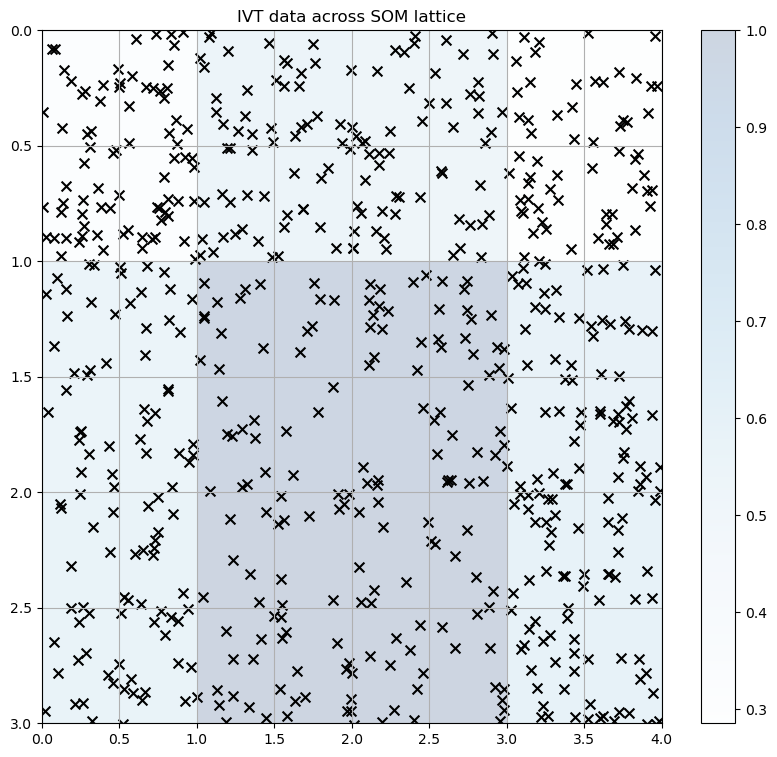

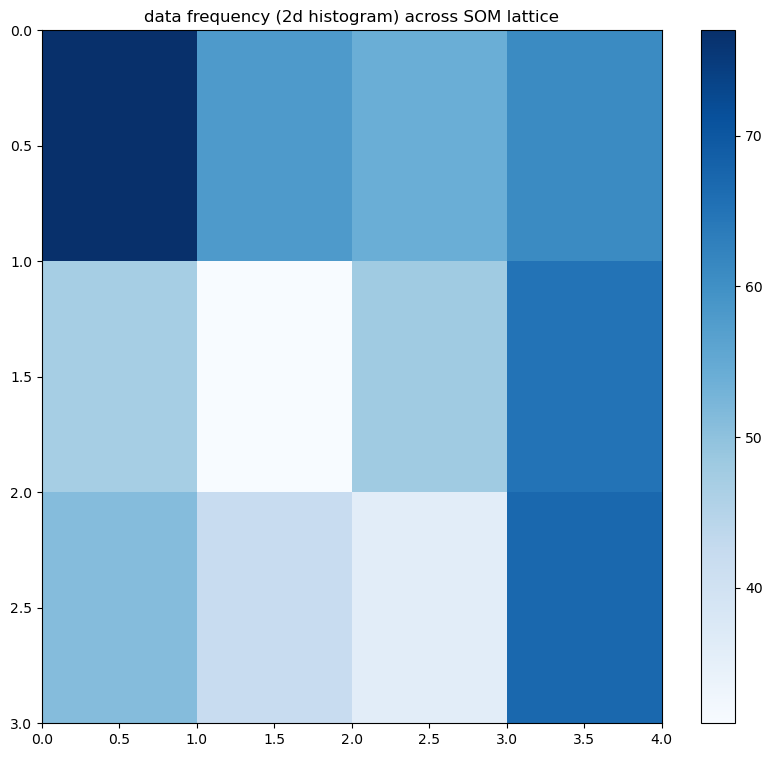

The rows and columns of the SOM lattice to use to grab SOM indexes:
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
Number of composite maps: 16


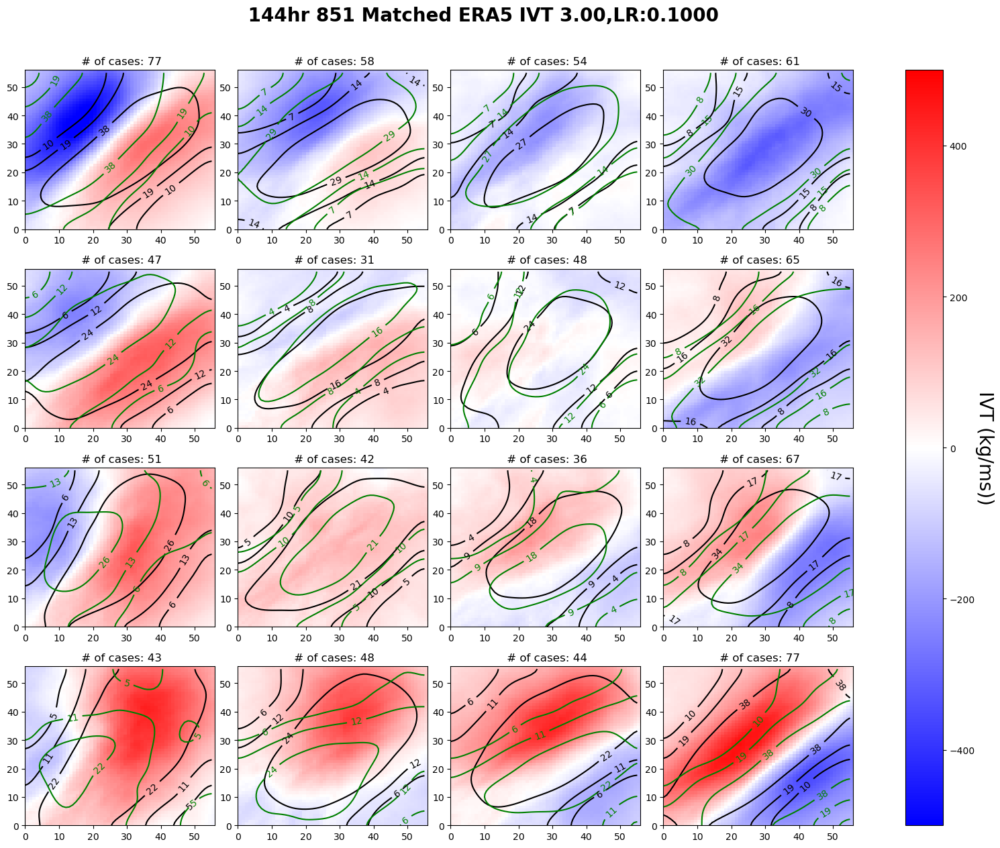

In [60]:
import matplotlib.colors as mcolors
colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

matching=1
som=4
di_dates={}
if som==4 and matching ==1:
    
    era5ss_match=xr.open_dataset('era5ss_matched_0605.nc')
    mask_final=era5ss_match['time'].isin(slp_final['time'])
    regridwrf_match=xr.open_dataset('regridwrfss_matched_0605.nc')
    diff_forecast=xr.open_dataset('diff_matched_0605.nc')
    diff_stack=diff_forecast['variable'][mask_final].stack(new=('y','x'))
    smooth_fcst=xr.open_dataset('fcst_matched.nc')
    smooth_obs=xr.open_dataset('obs_matched.nc')
    
#     new_fcst=old_fcst['__xarray_dataarray_variable__'][pv_mask]
#     new_obs=old_obs['__xarray_dataarray_variable__'][pv_mask]
    ht_final=xr.open_dataset('ht_matched_final.nc')
    slp_final=xr.open_dataset('slp_matched_final.nc')
#     pv=xr.open_dataset('pv_matched_masked.nc')
    pv_new=pv['variable'][pv_mask]
#     pv_new=mpcalc.smooth_gaussian(pv_new,0.10)
#     west_wrf=xr.open_dataset('wrf_matched_final.nc')
   
    
    
    
#     dist_mask=centers_unmatch['fmt_date'].isin(diff_forecast['time'])
#     dist_new=xr.Dataset({'variable': (['time'],centers_unmatch['dist'])},
#              coords={"lon":(["y","x"],diff_forecast['lon'].data),
#                      "lat":(["y","x"],diff_forecast['lat'].data),
#                     "time":(["time"],diff_forecast['time'])})
    centers_unmatch[(centers_unmatch['fmt_date']).isin(landfmt)]
#     with open('som_matched_144_3.05815.p', 'rb') as infile:
#         som_matched = pickle.load(infile)
    newsom=som_matched

    plt.figure(figsize=(10, 9))
    cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
    plt.title("distance map of the ivt", fontsize=12)
    plt.colorbar(cs)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()


    # this may take a few minutes if lots of data! currently doing every 20th point so not bad

    # grab the x and y coords across the lattice for the winner node for each data point

    w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
    print(len(w_x))
    w_x = np.array(w_x)
    w_y = np.array(w_y)
    print(w_x)
    print(w_y)

    # visualize where data falls in lattice (nearest winning neuron/node)

    plt.figure(figsize=(10, 9))
    plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
    plt.colorbar()

    for num, c in enumerate(w_x[::1]):     # every 20th data point

        plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                    w_x[num] + np.random.rand(1),
                    s=50, c='k', marker='x')

    plt.title("IVT data across SOM lattice", fontsize=12)
    plt.margins(x=0,y=0)
    plt.grid()
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()



    plt.figure(figsize=(10, 9))
    frequencies = newsom.activation_response(normalize_data(diff_stack).values)
    plt.pcolormesh(frequencies, cmap='Blues') 
    plt.colorbar()
    plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()

    # grabbing indices from SOM
    #all the cases for 2016-2017 500 mb heights are fairly similar 
    # create an empty dictionary using the rows and columns of SOM
    keys = [i for i in product(range(4),range(4))]
    winmap = {key: [] for key in keys}

    # grab the indices for the data within the SOM lattice
    for i, x in enumerate(normalize_data(diff_stack).values):
        winmap[newsom.winner(x)].append(i)

    print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
    som_keys = list(winmap.keys())
    print(som_keys)
    print(f"Number of composite maps: {len(som_keys)}")


    ##plot som##
    fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
    di_dates={}



    # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
    for map_num in range(len(som_keys)):

        diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
        fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
        obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
        pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
        slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        pvplot=np.where(pv_data>.40,pv_data,np.nan)
        dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        ivt_era=era5ss_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        ivt_wwrf=regridwrf_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])].values


#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
        label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(diff_data,vmin=-500, vmax=500,cmap='bwr')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800, cmap='viridis')



        n=(frequencies.flatten()[map_num])
    #         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors="white") 

#             diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
        fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
        obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
#             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

#             plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')

    #                    
        plt.clabel(fcstctr,fmt='%1.0f',colors='black')
        plt.clabel(obsctr,fmt='%1.0f',colors='green')
    #         # plot the figure containing all plots


    plt.tight_layout()
    fig = plt.gcf()
#         fig.suptitle("144hr 851 PV +SLP {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#         fig.suptitle("144hr 698 Unmatched SLP+500 mb hts {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    fig.suptitle(" 144hr 851 Matched ERA5 IVT {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    #ax1=fig.colorbar(label, ax=fig.get_axes())
    cbar=fig.colorbar(label, ax=fig.get_axes())
#         cbar.ax.set_ylabel('900-700 layer avg PV (PVU)', rotation=270, fontsize=20,labelpad=20)
# #               )
#         cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
# #               )
    cbar.ax.set_ylabel('IVT (kg/ms))', rotation=270, fontsize=20,labelpad=20
          )

    plt.show()


In [63]:
anom=ht_final-ht_final.mean()

In [64]:
ht500['lon']

<xarray.DataArray 'lon' (y: 56)>
[56 values with dtype=float64]
Coordinates:
    lon      (y) float64 ...
Dimensions without coordinates: y

In [65]:
full_hts=xr.open_dataset('hts1629.nc')

In [66]:
full_hts2=xr.open_dataset('hts144.nc')

In [67]:
full_hts2

<xarray.Dataset>
Dimensions:   (time: 1561, y: 569, x: 618)
Coordinates:
    lon       (y, x) float32 ...
    lat       (y, x) float32 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float32 ...

In [68]:
mask_hts=full_hts2['time'].isin(diff_stack['time'])

In [69]:
full_hts2['variable'][mask_hts]

<xarray.DataArray 'variable' (time: 849, y: 569, x: 618)>
[298544058 values with dtype=float32]
Coordinates:
    lon      (y, x) float32 ...
    lat      (y, x) float32 ...
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x

In [70]:
full_hts2['variable'][mask_hts].mean()

<xarray.DataArray 'variable' ()>
array(5585.133, dtype=float32)

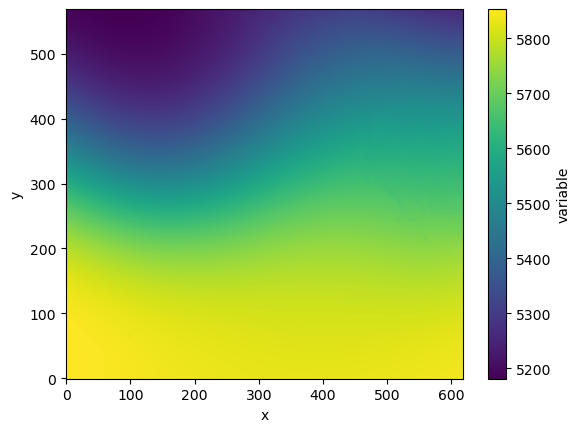

In [71]:
full_hts2['variable'][mask_hts].mean(dim='time').plot()

In [72]:
anom_full=full_hts2['variable'][mask_hts]-full_hts2['variable'][mask_hts].mean(dim='time')

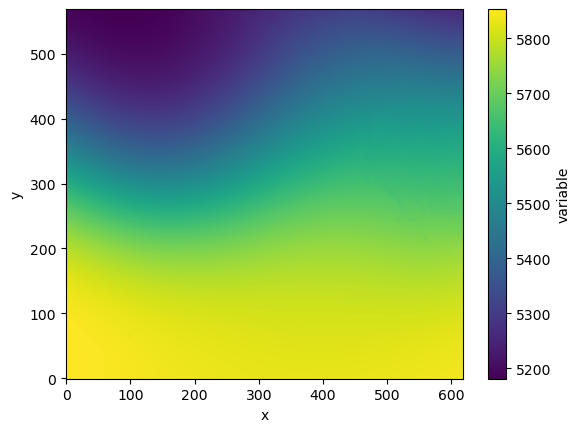

In [73]:
full_hts2['variable'][mask_hts].mean(dim='time').plot() # make this a full contour plot 

In [74]:
full_hts2=xr.open_dataset('hts144.nc')
# anom_full.to_netcdf('anomfull_wwrf.nc')

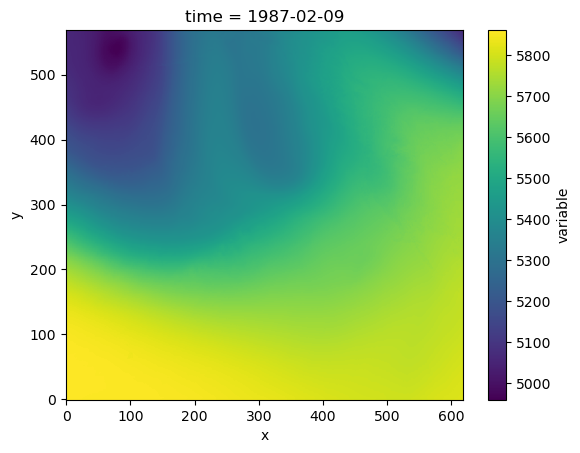

In [75]:
full_hts2['variable'][mask_hts].isel(time=50).plot()

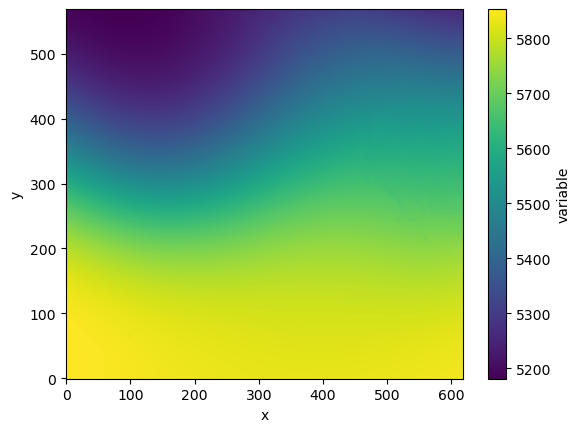

In [76]:
full_hts2['variable'][mask_hts].mean(dim='time').plot()

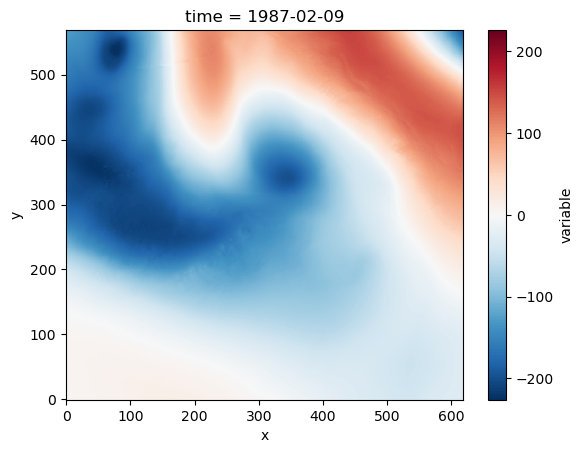

In [77]:
anom_full.isel(time=50).plot()

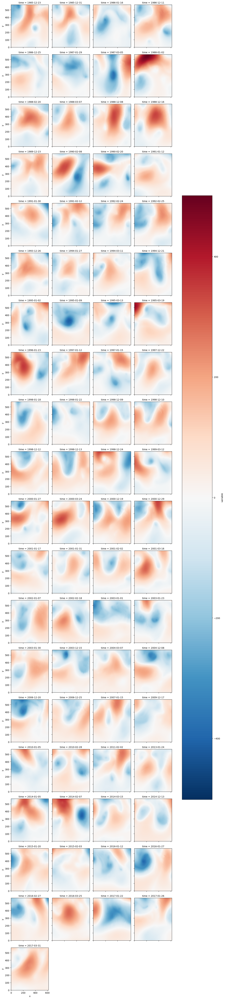

In [78]:
anom_full[np.array(winmap[som_keys[map_num]])].plot(col='time',col_wrap=4)

In [79]:
anom_full.min(), anom_full.max()

(<xarray.DataArray 'variable' ()>
 array(-524.3843, dtype=float32),
 <xarray.DataArray 'variable' ()>
 array(606.1675, dtype=float32))

In [80]:
centlat=xr.open_dataset('centlat_final.nc')
centlon=xr.open_dataset('centlon_final.nc')

In [81]:
rolling_mean=xr.open_dataset('rolling_era_means0228.nc')

In [82]:
#era500hts=sorted(glob.glob('/cw3e/mead/projects/cdd105/ERA500/*PL*500mb_height.nc'))


In [83]:
#len(era500hts)

In [84]:
# era500list=[]
# elonslist=[]
# elatslist=[]
# etimelist=[]
# for e in era500hts:
#     erafile=xr.open_dataset(e)
#     hts=erafile['z'].values
#     elons=erafile['longitude'].values
#     elats=erafile['latitude'].values
#     era500list.append(hts)
#     elonslist.append(elons)
#     elatslist.append(elats)
#     etimelist.append(erafile['time'].values)
# era500list=np.asarray(era500list)
# elonslist=np.asarray(elonslist)
# elatslist=np.asarray(elatslist)
# etimelist=np.asarray(etimelist)

In [85]:
# etimelist[mask_hts]

In [86]:
# era500_xr = xr.Dataset(
#     {'variable': (['time', 'y', 'x'], era500list[mask_hts].squeeze())},
#     coords={
#         "lon": (['x'], elonslist[0, :]),
#         "lat": (['y'], elatslist[0, :]),
#         "time": (['time'], etimelist[mask_hts].squeeze()),
#     },
# )


In [87]:
# era500_xr['variable'].isel(time=0).plot(x='lons',y='lats')

In [88]:
# era500list=era500list.squeeze()
# era500list.shape

In [90]:
lons=np.asarray(centers_matched['x'])
lats=np.asarray(centers_matched['y'])

In [91]:
centers_matched['fmt_date']

0      1985-12-08
1      1985-12-10
2      1985-12-11
4      1985-12-17
5      1985-12-20
          ...    
1555   2017-03-18
1557   2017-03-24
1558   2017-03-28
1559   2017-03-29
1560   2017-03-31
Name: fmt_date, Length: 853, dtype: datetime64[ns]

In [92]:
fullivtgrid=xr.open_dataset('96_ivt.nc')

In [93]:
fullivtgrid ##doesn't matter which ivt I grabbed just needed the grid here 

<xarray.Dataset>
Dimensions:   (time: 1034, y: 569, x: 618)
Coordinates:
    lon       (y, x) float32 ...
    lat       (y, x) float32 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-09 ... 2017-03-30
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float32 ...

In [94]:
# era5 best grid import for ds_tmp
era_best = xr.open_dataset('era_best.nc')

# create ds_tmp to coarsen the west-wrf grid
ds_tmp = xe.Regridder(fullivtgrid.isel(time=0).drop('time')['variable'], 
                      era_best.isel(time=0).drop('time')['variable'], 
                      method="bilinear", reuse_weights=False)

In [95]:
loncentarr=np.asarray(centers_matched['x'])
latcentarr=np.asarray(centers_matched['y'])

In [ ]:
loncentarr.shape

In [96]:
loncentarr[dist_mask].shape

(849,)

In [97]:
latcentarr[dist_mask].shape

(849,)

In [130]:
full_era=xr.open_dataset('era5_match.nc')

In [131]:
full_era

<xarray.Dataset>
Dimensions:   (time: 853, x: 721, y: 1440)
Coordinates:
    lon       (y) float64 ...
    lat       (x) float64 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: x, y
Data variables:
    variable  (time, x, y) float64 ...

In [ ]:
# elonslist.shape

In [ ]:
# etimelist=etimelist.squeeze()

In [ ]:
# era500_xr=xr.Dataset({'variable': (['time','y','x'],era500list[mask_hts])},
#                      coords={"lons":(["x"],elonslist[0,:].data),
#                      "lats":(["y"],elatslist[0,:].data),
#                     "time":(["time"],etimelist[mask_hts])})

In [ ]:
# era500_xr['lons'].min(),era500_xr['lons'].max()

In [ ]:
# full_era['variable'].isel(time=0).plot()

In [ ]:
# era500_xr=xr.Dataset({'variable': (['time','x','y'],era500list[mask_hts].squeeze())},
#                      coords={"lons":(["y"],era500_xr['lons'].data),
#                      "lats":(["x"],era500_xr['lats'].data),
#                     "time":(["time"],etimelist[mask_hts])})

In [ ]:
# era500_xr = xr.Dataset(
#     {'variable': (['time', 'x', 'y'], era500list[mask_hts])},
#     coords={
#         "lats": (["x"], era500_xr['lats'].data[::-1]),  # Reverse the latitudes
#         "lons": (["y"], era500_xr['lons'].data),
#         "time": (["time"], etimelist[mask_hts])
#     }
# )


In [98]:
def indices_coords(ds, lon, lat):
    """
    Extract indices from WRF grid using lat and lon values of AR objects.
    
    Args:
        ds: xarray dataset of WRF d01 grid
        lon (float): longitude value of AR object from csv
        lat (float): latitude value of AR object from csv
        
    """
    #print(ds.lat, lat)
    abslat = np.abs(ds.lat - lat)
    #print(abslat)
    #print(ds.lon, lon)
    abslon = np.abs(ds.lon - lon)
    #print(abslon)
    c = np.maximum(abslon, abslat)
    
    loc_x=np.where(c == np.min(c))[0][0]
    loc_y=np.where(c == np.min(c))[1][0]
    #([loc_x], [loc_y]) = np.where(c == np.min(c))
    #print(loc_x, loc_y)
    return (loc_x, loc_y)

In [ ]:
# # loop through, regrid west-wrf to era5, for each sample take diff

# # eralon_list=[]
# # eralat_list=[]

# # eraivt_list_new=[]
# # diff_erawrf_xr=[]

# eradates=[]

# # difflon=[]
# # difflat=[]

# # rewrf_list=[]

# # init_folder_144list=[]

# # ht500list=[]
# # slplist=[]

# #reslp_ivt=[]
# era5_ivt=[]
# # wwrf_ivt=[]
# # repv=[]

# #ht500=[]

# # Set up loop to run same plots for multiple different times (assume here that we have 1 time per wrfout file)
# for j in range(0,len(centers_matched.index)):
    
#     centroid_date=centers_matched.date.iloc[j][:4]+"-"+\
#         centers_matched.date.iloc[j][4:6]+"-"+\
#         centers_matched.date.iloc[j][6:8]+"_00_00_00"
    
#     init_folder=(pd.to_datetime(centroid_date[:10])-datetime.timedelta(days=6)).strftime("%Y%m%d%H")
#     init_folder_same_day=(pd.to_datetime(centroid_date[:10])).strftime("%Y%m%d%H")
    
#     init_folder_144=(pd.to_datetime(centroid_date[:10])-datetime.timedelta(days=6)).strftime("%Y%m%d%H")
# #     init_folder_144list.append(init_folder_144)
    
#     ncdata=sorted(
#         glob.glob(
#             '/cw3e/mead/projects/cdd105/2023.03.26_from_PJM/Reanalysis/ERA5/IVT/*/ERA5_IVT_'+\
#             init_folder_same_day[:-2]+'.nc')) 
    
#     for name in ncdata:
        
#         ncfile = xr.open_dataset(name)
         
#         eraivt = ncfile["IVT"][0,:,:]
#         eralon = ncfile["lon"]
#         eralat = ncfile["lat"]
        
#         #ncfile["time"].dt.strftime('%Y-%m-%d').values.astype(str)[0]

#         eradates.append(centroid_date[:10])

# #         re_wwrf = ds_tmp(
# #             ivt_full['variable'].sel(
# #                 time=pd.to_datetime(centroid_date[:10])).values, keep_attrs=True, 
# #             skipna=True)
        
# #         re_pv= ds_tmp(pv['variable'].sel(
# #                 time=pd.to_datetime(centroid_date[:10])).values, keep_attrs=True, 
# #             skipna=True)
        
# #         re_slp= ds_tmp(slp['variable'].sel(
# #                 time=pd.to_datetime(centroid_date[:10])).values, keep_attrs=True, 
# #             skipna=True)
        
# #         re_ht500=ds_tmp(hts500['variable'].sel(
# #                 time=pd.to_datetime(centroid_date[:10])).values, keep_attrs=True, 
# #             skipna=True)
        
# #         diff_erawrf = re_wwrf - eraivt
        
# #         diff_erawrf_xr.append(diff_erawrf)
# #         rewrf_list.append(re_wwrf)
#         era5_ivt.append(eraivt)
# #         repv.append(re_pv)
# #         ht500list.append(re_ht500)
# #         slplist.append(re_slp)
        
#         #break
    
# # diff_erawrf_xr=np.asarray(diff_erawrf_xr)
# # rewrf_list=np.asarray(rewrf_list) 
# era5_ivt = np.asarray(era5_ivt)
# # repv=np.asarray(repv)

# #wwrf_ivt=np.asarray(wwrf_ivt)
# #reslp_ivt=np.asarray(reslp_ivt)
# #ht500=np.asarray(ht500)
# #era5_ivt=np.asarray(era5_ivt)
# #eraivt_list_new=np.asarray(eraivt_list_new)
# eradates=np.asarray(eradates)

In [ ]:
# eraivt_xr=xr.Dataset({'variable': (['time','x','y'],era5_ivt)},
#              coords={"lon":(['y'],eralon.data),
#                      "lat":(["x"],eralat.data),
#                     "time":(["time"],pd.to_datetime(eradates))})

In [ ]:
# # Convert longitude values from 0-360 to -180-180 range
# era500_xr_lon_adj = era500_xr.assign_coords(lons=(era500_xr.lons + 180) % 360 - 180)

# # Sort latitude and time values in increasing order
# era500_xr_sorted = era500_xr_lon_adj.sortby(['lats','lons', 'time'])

# # Plot the data
# era500_xr_sorted['variable'].isel(time=0).plot(x='lons', y='lats')

# # Show the plot
# plt.show()

In [ ]:
# era500_conv['variable']['lons']

In [ ]:
# eraivt_xr

In [ ]:
# era500_conv

In [ ]:
# era500_conv['variable'].isel(time=0).plot.contourf(x='lon',y='lat')

In [ ]:


# subdates=[]
# era5lon=[]
# era5lat=[]
# era5ht=[]
# centroids_lat=[]
# centroids_lon=[]

# for num, (i_lon, j_lat)  in enumerate(zip(loncentarr[dist_mask], latcentarr[dist_mask])):
    
#     print(f"Original lat and lon: {i_lon, j_lat}")
    
#     if np.shape(indices_coords(era500_xr_sorted['variable'].isel(time=num), i_lon, j_lat))==(2, ):
        
#         i_, j_ = indices_coords(era500_xr_sorted['variable'].isel(time=num), i_lon, j_lat)
        
#         temp_grid = era500_xr_sorted['variable'].isel(time=num).isel(y = j_, x = i_)
#         # grab the nearest lat lon values in WRF grid
        
#         print(f"Closest lat and lon: {float(temp_grid.lon.values), float(temp_grid.lat.values)}")

        
#         AR_grid_era500=era500_xr_sorted['variable'].isel(time=num).isel(
#             y=slice(j_ - 28, j_ + 28), 
#             x=slice(i_ - 28, i_ + 28))
        

        
# #         AR_reslp=reslp_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
# #                                 x=slice(j_ - 28, j_ + 28))
        
# #         AR_reht=reht500_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
# #                                 x=slice(j_ - 28, j_ + 28))
        
# #         AR_pv=repv_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
# #                                 x=slice(j_ - 28, j_ + 28))
        
        
        
#         if AR_grid_era500.shape==(56, 56):
            
#             print(num)
            
#             centroids_lat.append(float(temp_grid.lat.values))
#             centroids_lon.append(float(temp_grid.lon.values))
#             era5lon.append(AR_grid_era500['lon'].values)
#             era5lat.append(AR_grid_era500['lat'].values)
#             era5ht.append(AR_grid_era500.values)
#             AR_grid_era500.plot.pcolormesh()
#             plt.show()

In [ ]:


# subdates=[]
# era5lon=[]
# era5lat=[]
# era5ht=[]
# centroids_lat=[]
# centroids_lon=[]

# for num, (i_lon, j_lat)  in enumerate(zip(loncentarr[dist_mask], latcentarr[dist_mask])):
    
#     print(f"Original lat and lon: {i_lon, j_lat}")
    
#     if np.shape(indices_coords(era500_conv['variable'].isel(time=num), i_lon, j_lat))==(2, ):
        
#         i_, j_ = indices_coords(era500_conv['variable'].isel(time=num), i_lon, j_lat)
        
#         temp_grid = era500_conv['variable'].isel(time=num).isel(y = j_, x = i_)
#         # grab the nearest lat lon values in WRF grid
        
#         print(f"Closest lat and lon: {float(temp_grid.lon.values), float(temp_grid.lat.values)}")

        
#         AR_grid_era500=era500_conv['variable'].isel(time=num).isel(
#             y=slice(j_ - 28, j_ + 28), 
#             x=slice(i_ - 28, i_ + 28))
        

        
# #         AR_reslp=reslp_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
# #                                 x=slice(j_ - 28, j_ + 28))
        
# #         AR_reht=reht500_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
# #                                 x=slice(j_ - 28, j_ + 28))
        
# #         AR_pv=repv_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
# #                                 x=slice(j_ - 28, j_ + 28))
        
        
        
#         if AR_grid_era500.shape==(56, 56):
            
#             print(num)
            
#             centroids_lat.append(float(temp_grid.lat.values))
#             centroids_lon.append(float(temp_grid.lon.values))
#             era5lon.append(AR_grid_era500['lon'].values)
#             era5lat.append(AR_grid_era500['lat'].values)
#             era5ht.append(AR_grid_era500.values)
#             AR_grid_era500.plot.pcolormesh()
#             plt.show()

In [ ]:
# era5ht=np.asarray(era5ht)

In [ ]:
# era5lon=np.asarray(era5lon)
# era5lat=np.asarray(era5lat)

In [ ]:
# AR_grid_era500['lon']

In [ ]:
# AR_grid_era500['lon'].max()

In [ ]:
# erahts500=xr.Dataset({'variable': (['time','x','y'],era5ht)},
#                      coords={"lat":(["x"],era5lat[0,:]),
#                      "lon":(["y"],era5lon[0,:]),
#                     "time":(["time"],regridwrf_match['time'][pv_mask].data)})

In [ ]:
# erahts500['variable'].mean()/9.6055

In [ ]:
# erahts500['variable'].isel(time=20).plot()

In [ ]:
# erahts500_cleaned = erahts500.where(erahts500['variable'] != -32767, drop=True)

In [ ]:
# erahts500_cleaned['variable'].isel(time=50).plot()

In [ ]:
# erahts500_cleaned=erahts500_cleaned['variable']/9.80655 #divide by the gravitational constant

In [ ]:
# ivt_era.plot()

In [ ]:
# erahts500_cleaned.isel(time=0).plot(x='lon',y='lat')

In [ ]:
# erahts500_cleaned.to_netcdf('erahts500clean_newestv3.nc')

In [ ]:
# era500_xr.to_netcdf('full_144era5ht.nc')

In [ ]:
# regridwrf_match['lon'].max(),regridwrf_match['lon'].min()

In [ ]:
# regridwrf_match['lat'].min(),regridwrf_match['lat'].max()

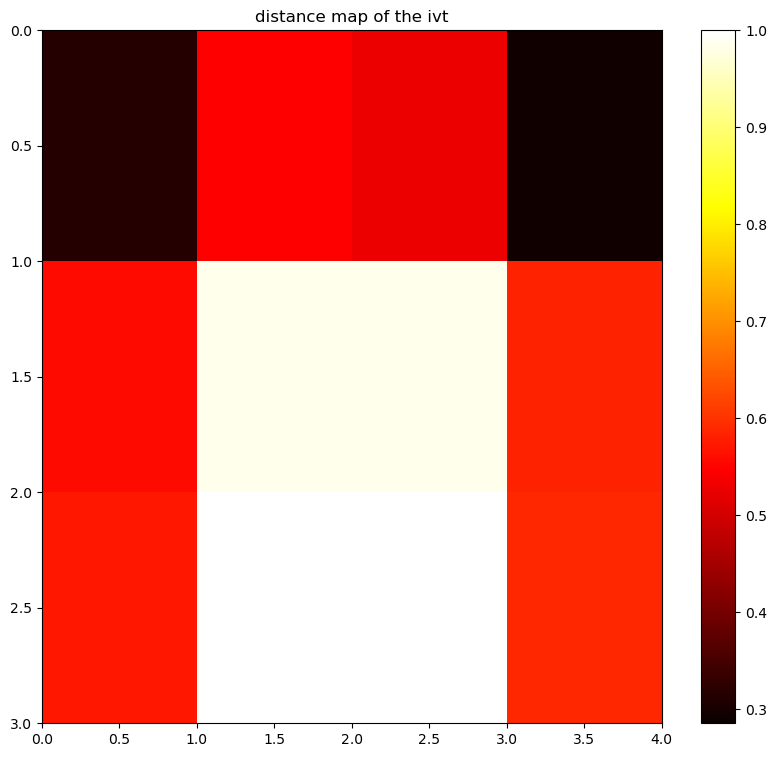

849
[0 1 2 3 3 2 3 1 3 1 2 1 3 3 3 2 3 0 0 1 3 3 0 1 0 3 3 2 1 3 3 2 3 2 3 3 1
 0 1 0 3 0 3 3 0 2 1 2 2 3 3 2 1 0 2 1 3 3 3 1 0 3 1 2 3 0 0 1 0 2 1 0 0 0
 0 1 3 3 2 0 3 2 3 2 2 2 1 0 3 0 2 3 0 0 0 0 0 0 1 2 1 1 1 1 3 0 1 1 2 3 0
 2 0 3 1 3 0 0 2 1 1 3 2 2 0 0 3 0 1 1 3 2 3 0 0 0 0 0 2 1 0 2 3 0 0 0 3 3
 1 2 3 0 3 2 2 3 0 1 0 0 0 0 1 1 1 2 0 0 2 0 0 1 0 1 0 0 0 1 1 3 0 2 0 3 3
 1 0 2 0 2 1 3 0 0 2 2 3 3 0 0 0 3 0 0 0 1 2 2 1 0 3 2 3 2 1 1 0 2 3 1 2 1
 2 0 2 2 0 0 3 0 3 2 2 2 1 3 0 3 1 2 0 0 3 1 0 2 3 3 3 3 1 0 0 0 0 0 0 1 0
 0 2 1 0 2 3 3 2 0 0 0 2 1 1 2 0 2 1 1 2 3 0 0 3 0 1 0 2 1 3 3 1 2 3 0 0 0
 2 0 2 1 1 1 3 0 3 0 3 1 1 1 0 3 3 3 3 3 3 2 0 2 3 3 3 3 3 3 2 1 1 0 2 3 2
 0 0 1 3 0 1 2 2 3 3 3 0 1 0 2 1 2 3 0 1 2 2 1 3 3 0 1 3 3 3 3 3 2 3 2 3 1
 1 1 0 0 2 0 0 2 1 3 1 0 1 2 3 1 2 0 0 2 1 0 1 0 2 1 1 1 1 3 2 2 3 0 3 2 2
 3 2 1 1 2 0 1 3 0 2 3 2 3 3 3 2 2 0 1 3 3 2 1 1 2 2 0 1 1 3 0 2 0 0 1 3 3
 2 3 0 0 3 3 1 2 0 1 0 0 3 0 3 0 3 0 0 2 3 0 0 1 3 0 1 2 3 1 1 0 3 1 0 0 2
 2 1 3 0 0 3 3 1 1 0 

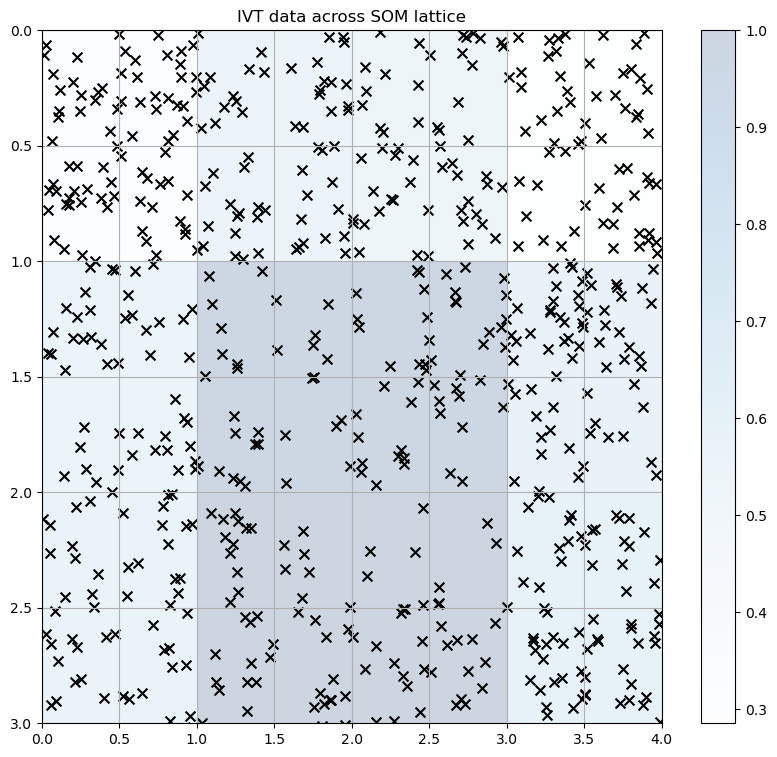

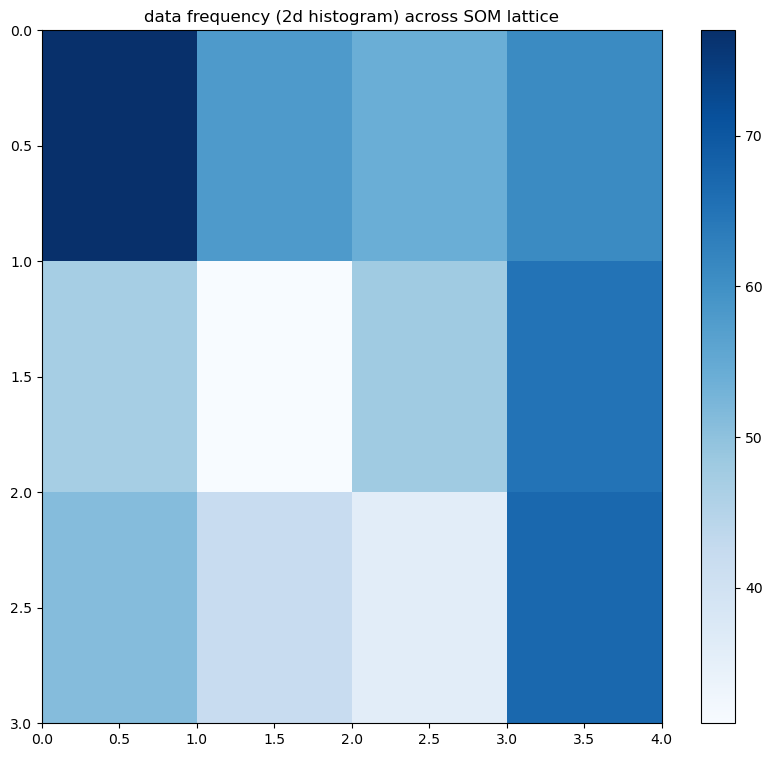

The rows and columns of the SOM lattice to use to grab SOM indexes:
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
Number of composite maps: 16


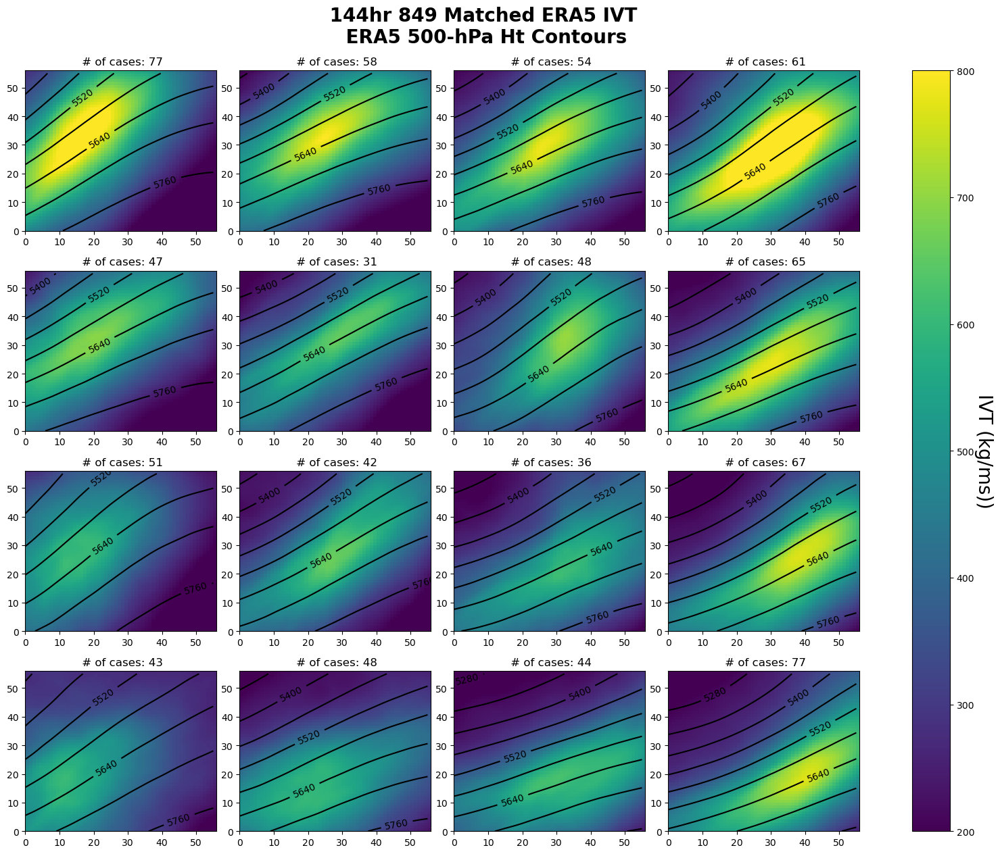

In [99]:
import matplotlib.colors as mcolors
colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

matching=1
som=4
di_dates={}
if som==4 and matching ==1:
    
#     era5ss_match=xr.open_dataset('era5ss_matched_0605.nc')
#     regridwrf_match=xr.open_dataset('regridwrfss_matched_0605.nc')
#     diff_forecast=xr.open_dataset('diff_matched_0605.nc')
#     diff_stack=diff_forecast['variable'][pv_mask].stack(new=('y','x'))
#     smooth_fcst=xr.open_dataset('fcst_matched.nc')
#     smooth_obs=xr.open_dataset('obs_matched.nc')
    
    
# #     new_fcst=old_fcst['__xarray_dataarray_variable__'][pv_mask]
# #     new_obs=old_obs['__xarray_dataarray_variable__'][pv_mask]
#     ht_final=xr.open_dataset('ht_matched_final.nc')
#     slp_final=xr.open_dataset('slp_matched_final.nc')
    htera5=xr.open_dataset('erahts500clean_newestv3.nc')
# #     pv=xr.open_dataset('pv_matched_masked.nc')
#     pv_new=pv['__xarray_dataarray_variable__'][pv_mask]
# #     pv_new=mpcalc.smooth_gaussian(pv_new,1)
# #     west_wrf=xr.open_dataset('wrf_matched_final.nc')
   
    
    
    
#     dist_mask=centers_unmatch['fmt_date'].isin(diff_forecast['time'])
#     dist_new=xr.Dataset({'variable': (['time'],centers_unmatch['dist'])},
#              coords={"lon":(["y","x"],diff_forecast['lon'].data),
#                      "lat":(["y","x"],diff_forecast['lat'].data),
#                     "time":(["time"],diff_forecast['time'])})
#     centers_unmatch[(centers_unmatch['fmt_date']).isin(landfmt)]
#     with open('som_matched_144_3.05815.p', 'rb') as infile:
#     som_matched = pickle.load(infile)
    newsom=som_matched

    plt.figure(figsize=(10, 9))
    cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
    plt.title("distance map of the ivt", fontsize=12)
    plt.colorbar(cs)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()


    # this may take a few minutes if lots of data! currently doing every 20th point so not bad

    # grab the x and y coords across the lattice for the winner node for each data point

    w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
    print(len(w_x))
    w_x = np.array(w_x)
    w_y = np.array(w_y)
    print(w_x)
    print(w_y)

    # visualize where data falls in lattice (nearest winning neuron/node)

    plt.figure(figsize=(10, 9))
    plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
    plt.colorbar()

    for num, c in enumerate(w_x[::1]):     # every 20th data point

        plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                    w_x[num] + np.random.rand(1),
                    s=50, c='k', marker='x')

    plt.title("IVT data across SOM lattice", fontsize=12)
    plt.margins(x=0,y=0)
    plt.grid()
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()



    plt.figure(figsize=(10, 9))
    frequencies = newsom.activation_response(normalize_data(diff_stack).values)
    plt.pcolormesh(frequencies, cmap='Blues') 
    plt.colorbar()
    plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()

    # grabbing indices from SOM
    #all the cases for 2016-2017 500 mb heights are fairly similar 
    # create an empty dictionary using the rows and columns of SOM
    keys = [i for i in product(range(4),range(4))]
    winmap = {key: [] for key in keys}

    # grab the indices for the data within the SOM lattice
    for i, x in enumerate(normalize_data(diff_stack).values):
        winmap[newsom.winner(x)].append(i)

    print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
    som_keys = list(winmap.keys())
    print(som_keys)
    print(f"Number of composite maps: {len(som_keys)}")


    ##plot som##
    #fig, geo_axs = plt.subplots(4, 4, figsize=(16,12),subplot_kw={'projection':ccrs.PlateCarree()})
    fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
    di_dates={}



    # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
    for map_num in range(len(som_keys)):

#             diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
#             fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        ht500=htera5['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             anom_data=anom_full[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#             dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        ivt_era=era5ss_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        ivt_wwrf=regridwrf_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

#             newlons=np.where(anom_data['lon'] < 0., anom_data['lon'], (anom_data['lon']-360.))

#             newlats=np.where(anom_data['lat'] < 0.,anom_data['lat'], (anom_data['lat']-90.))
#             geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_extent([-170, -110, 15, 60],crs=ccrs.PlateCarree())

#             geo_axs[som_keys[map_num][0],som_keys[map_num][1]].coastlines()
#             geo_axs[som_keys[map_num][0],som_keys[map_num][1]].gridlines(draw_labels=True)


#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(newlons,anom_data['lat'],anom_data, vmin=-100, vmax=100, cmap='bwr')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')
        label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800, cmap='viridis')



        n=(frequencies.flatten()[map_num])
        htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040],colors="black") 

#             diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#             fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#             obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
#             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

        plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')

    #                    
#             plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#             plt.clabel(obsctr,fmt='%1.0f',colors='green')
    #         # plot the figure containing all plots


    plt.tight_layout()
    fig = plt.gcf()
#         fig.suptitle("144hr 851 PV +SLP {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#         fig.suptitle("144hr 698 Unmatched SLP+500 mb hts {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    fig.suptitle(" 144hr 849 Matched ERA5 IVT \n ERA5 500-hPa Ht Contours".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    #ax1=fig.colorbar(label, ax=fig.get_axes())
    cbar=fig.colorbar(label, ax=fig.get_axes())
#         cbar.ax.set_ylabel('900-700 layer avg PV (PVU)', rotation=270, fontsize=20,labelpad=20)
# #               )
#         cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
# #               )
    cbar.ax.set_ylabel('IVT (kg/ms))', rotation=270, fontsize=20,labelpad=20
          )

    plt.show()


In [ ]:
lr_arr=[.05]
sigma_arr=[3]

dict_sl={}
listsl=[]
for l in lr_arr:
    #print(l)
    for t,s in enumerate(sigma_arr):
        
            #dict_sl=dict([((s,l), quant_list[t], topo_list[t])])
    
        listsl.append((s,l))

In [ ]:
def normalize_data(data):
    """
    Function for normalizing data prior to training using z-score
    """
    return (data - np.nanmean(data)) / np.nanstd(data)

In [ ]:
quant_list=[]
topo_list=[]
dict_sl={}
#for l in lr_arr:
for l in lr_arr:
    
    for s in sigma_arr:
    
            print(s)

            som_grid_rows = 4         # (y-axis)
            som_grid_columns = 4     # (x-axis)
            input_length = diff_stack.shape[1]    # using preprocessed data array; Number of the elements of the vectors in input.
            sigma = s#4x4 sigma of 3,3x3 sigma of 2            # Spread of the neighborhood function, needs to be adequate to the dimensions of the map.
            learning_rate = l       # initial learning rate (at the iteration t we have learning_rate(t) = learning_rate / (1 + t/T) where T is #num_iteration/2)
            decay_function = asymptotic_decay

            """Function that reduces learning_rate and sigma at each iteration
            the default function is (asymptotic_decay):
                learning_rate / (1+t/(max_iterarations/2))

            A custom decay function will need to to take in input
            three parameters in the following order:

            1. learning rate
            2. current iteration
            3. maximum number of iterations allowed

            Note that if a lambda function is used to define the decay
            MiniSom will not be pickable anymore."""

            neighborhood_function = 'gaussian'

            """Function that weights the neighborhood of a position in the map. 
            Possible values: 'gaussian', 'mexican_hat', 'bubble', 'triangle', 
            which takes in sigma."""

            topology = 'rectangular'                 # Topology of the map; Possible values: 'rectangular', 'hexagonal'
            activation_distance = 'euclidean'        # Distance used to activate the map; Possible values: 'euclidean', 'cosine', 'manhattan', 'chebyshev'
            random_seed = 1 #run a few times with different seed =2,3 etc to prove consistency 


            newsom = MiniSom(
            som_grid_rows,
            som_grid_columns,
            input_length,
            sigma,
            learning_rate,
            decay_function,
            neighborhood_function,
            topology,
            activation_distance,
            random_seed)

    
            

            data2 = normalize_data(diff_stack)
            #data2 = subsetarray
            num_iteration = 20000 #try decreasing to 10,000 to dec training time
            random_order = True #keep True
            verbose = True
            data2.shape
            
            newsom.random_weights_init(data2.values)    # random method
            print(newsom.random_weights_init(data2.values))

            ### train som ###
            newsom.train(
            data2.values,
            num_iteration,
            random_order,
            verbose  
            )

            quant_list.append(newsom.quantization_error(data2))
            topo_list.append(newsom.topographic_error(data2))
            dict_sl = {key: (newsom.quantization_error(data2),newsom.topographic_error(data2),\
                            (newsom.quantization_error(data2)+newsom.topographic_error(data2))) for key in listsl}
            

            plt.figure(figsize=(10, 9))
            cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
            plt.title("distance map of the ivt", fontsize=12)
            plt.colorbar(cs)
            plt.ylim(som_grid_rows, 0)  # flip the y axis to be the same as composite map axes later
            plt.show()


            # this may take a few minutes if lots of data! currently doing every 20th point so not bad

            # grab the x and y coords across the lattice for the winner node for each data point

            w_x, w_y = zip(*[newsom.winner(w) for w in data2.values])
            print(len(w_x))
            w_x = np.array(w_x)
            w_y = np.array(w_y)
            print(w_x)
            print(w_y)

            # visualize where data falls in lattice (nearest winning neuron/node)

            plt.figure(figsize=(10, 9))
            plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
            plt.colorbar()

            for num, c in enumerate(w_x[::1]):     # every 20th data point

                plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                            w_x[num] + np.random.rand(1),
                            s=50, c='k', marker='x')

            plt.title("IVT data across SOM lattice", fontsize=12)
            plt.margins(x=0,y=0)
            plt.grid()
            plt.ylim(som_grid_rows, 0)  # flip the y axis to be the same as composite map axes later
            plt.show()



            plt.figure(figsize=(10, 9))
            frequencies = newsom.activation_response(data2.values)
            plt.pcolormesh(frequencies, cmap='Blues') 
            plt.colorbar()
            plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
            plt.ylim(som_grid_rows, 0)  # flip the y axis to be the same as composite map axes later
            plt.show()

            # grabbing indices from SOM
            #all the cases for 2016-2017 500 mb heights are fairly similar 
            # create an empty dictionary using the rows and columns of SOM
            keys = [i for i in product(range(som_grid_rows),range(som_grid_columns))]
            winmap = {key: [] for key in keys}

            # grab the indices for the data within the SOM lattice
            for i, x in enumerate(data2.values):
                winmap[newsom.winner(x)].append(i)

            print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
            som_keys = list(winmap.keys())
            print(som_keys)
            print(f"Number of composite maps: {len(som_keys)}")


            ##plot som##
            fig, geo_axs = plt.subplots(som_grid_rows, som_grid_columns, figsize=(16,12))
            di_dates={}



            # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
            for map_num in range(len(som_keys)):

                    print(s)
                    
                    ivt_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
#                     fcst_data=smooth_fcst[np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#                     obs_data=smooth_obs[np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
                    #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#                     slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#                     ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
                    
                    #ivt_real=era5ssxr['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
                    
                    #di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack[mask_final]['time'][np.array(winmap[som_keys[map_num]])]
                    

                    label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_data,cmap='bwr',vmin=-500,vmax=500) #cmap="Blues", 
                                                                       
                    n=(frequencies.flatten()[map_num])
                    #diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#                     fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/32,n/16,n/8,n/4,n/2])  
#                     obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/32,n/16,n/8,n/4,n/2])#cmap="Blues", 
#                     htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors='white') #cmap="Blues", 

                    projection = ccrs.PlateCarree()
                    axs_class = (GeoAxes,
                          dict(map_projection=projection))
      


                    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)
                 
#                     plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='white')

#                    
#                     plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#                     plt.clabel(obsctr,fmt='%1.0f',colors='green')
                    # plot the figure containing all plots

            
            plt.tight_layout()
            fig = plt.gcf()
            fig.suptitle(" 144hr 849 Diff matched IVT cases {sigma:.2f},LR:{lr:.4f}  ".format(sigma=s,lr =l), fontsize=20,y=1.05, x=0.45, fontweight='bold')
                #ax1=fig.colorbar(label, ax=fig.get_axes())
            cbar=fig.colorbar(label, ax=fig.get_axes())
            cbar.ax.set_ylabel('IVT diff (kg/ms)', rotation=270, fontsize=20,labelpad=20
                      )
            
            plt.show()


In [ ]:
newsom.get_weights()

In [ ]:
# with open('som_matched_144_3.05_final.p', 'wb') as outfile:
#     pickle.dump(newsom, outfile)

In [ ]:
with open('som_matched_144_3.05_final.p', 'rb') as infile:
    newsom = pickle.load(infile)

In [ ]:
newsom.get_weights()

In [100]:
dict_rmse={}


for sk in som_keys:
    #print(sk)
    rmse_arr=[]

    for i in  range(len(np.array(winmap[sk]))):
        
        
            rmse=(np.sqrt(np.square(regridwrf_match['variable'][mask_final][np.array(winmap[sk])].isel(time=i)-\
                            
            regridwrf_match['variable'][mask_final][np.array(winmap[sk])].mean(dim='time')).values.mean()))
            
            rmse_arr.append(rmse)
            
    dict_rmse[sk]= rmse_arr

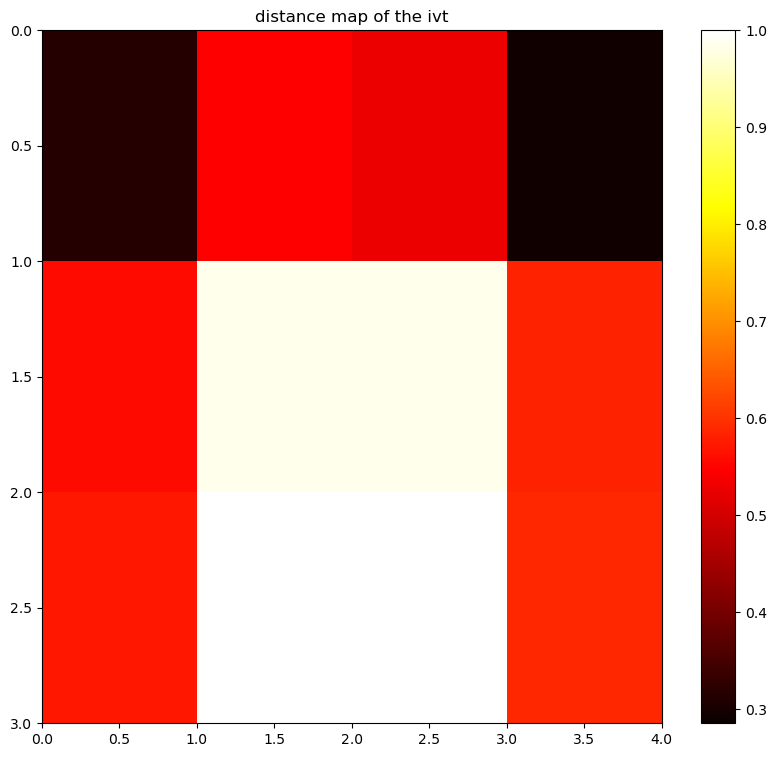

849
[0 1 2 3 3 2 3 1 3 1 2 1 3 3 3 2 3 0 0 1 3 3 0 1 0 3 3 2 1 3 3 2 3 2 3 3 1
 0 1 0 3 0 3 3 0 2 1 2 2 3 3 2 1 0 2 1 3 3 3 1 0 3 1 2 3 0 0 1 0 2 1 0 0 0
 0 1 3 3 2 0 3 2 3 2 2 2 1 0 3 0 2 3 0 0 0 0 0 0 1 2 1 1 1 1 3 0 1 1 2 3 0
 2 0 3 1 3 0 0 2 1 1 3 2 2 0 0 3 0 1 1 3 2 3 0 0 0 0 0 2 1 0 2 3 0 0 0 3 3
 1 2 3 0 3 2 2 3 0 1 0 0 0 0 1 1 1 2 0 0 2 0 0 1 0 1 0 0 0 1 1 3 0 2 0 3 3
 1 0 2 0 2 1 3 0 0 2 2 3 3 0 0 0 3 0 0 0 1 2 2 1 0 3 2 3 2 1 1 0 2 3 1 2 1
 2 0 2 2 0 0 3 0 3 2 2 2 1 3 0 3 1 2 0 0 3 1 0 2 3 3 3 3 1 0 0 0 0 0 0 1 0
 0 2 1 0 2 3 3 2 0 0 0 2 1 1 2 0 2 1 1 2 3 0 0 3 0 1 0 2 1 3 3 1 2 3 0 0 0
 2 0 2 1 1 1 3 0 3 0 3 1 1 1 0 3 3 3 3 3 3 2 0 2 3 3 3 3 3 3 2 1 1 0 2 3 2
 0 0 1 3 0 1 2 2 3 3 3 0 1 0 2 1 2 3 0 1 2 2 1 3 3 0 1 3 3 3 3 3 2 3 2 3 1
 1 1 0 0 2 0 0 2 1 3 1 0 1 2 3 1 2 0 0 2 1 0 1 0 2 1 1 1 1 3 2 2 3 0 3 2 2
 3 2 1 1 2 0 1 3 0 2 3 2 3 3 3 2 2 0 1 3 3 2 1 1 2 2 0 1 1 3 0 2 0 0 1 3 3
 2 3 0 0 3 3 1 2 0 1 0 0 3 0 3 0 3 0 0 2 3 0 0 1 3 0 1 2 3 1 1 0 3 1 0 0 2
 2 1 3 0 0 3 3 1 1 0 

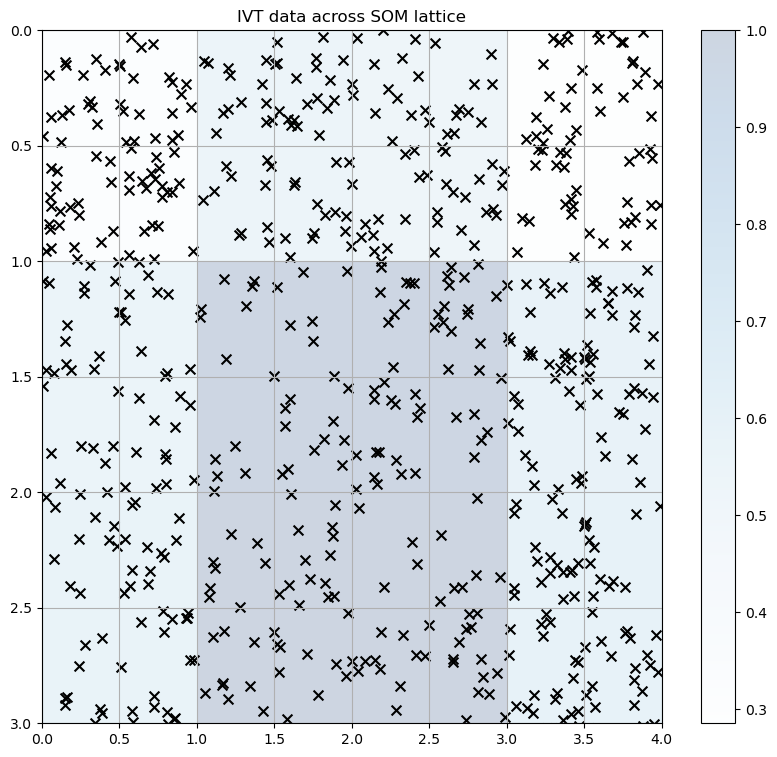

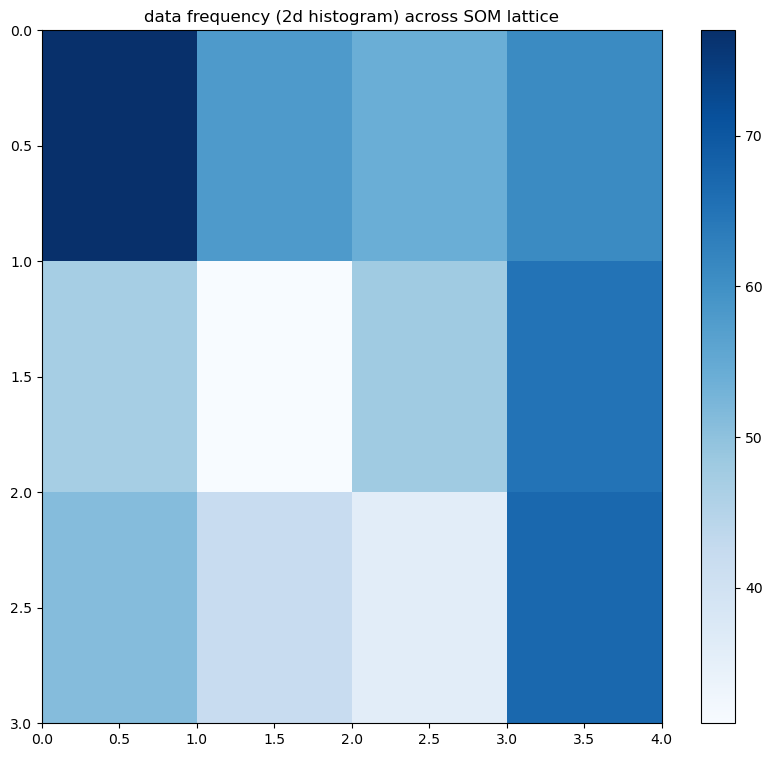

The rows and columns of the SOM lattice to use to grab SOM indexes:
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
Number of composite maps: 16


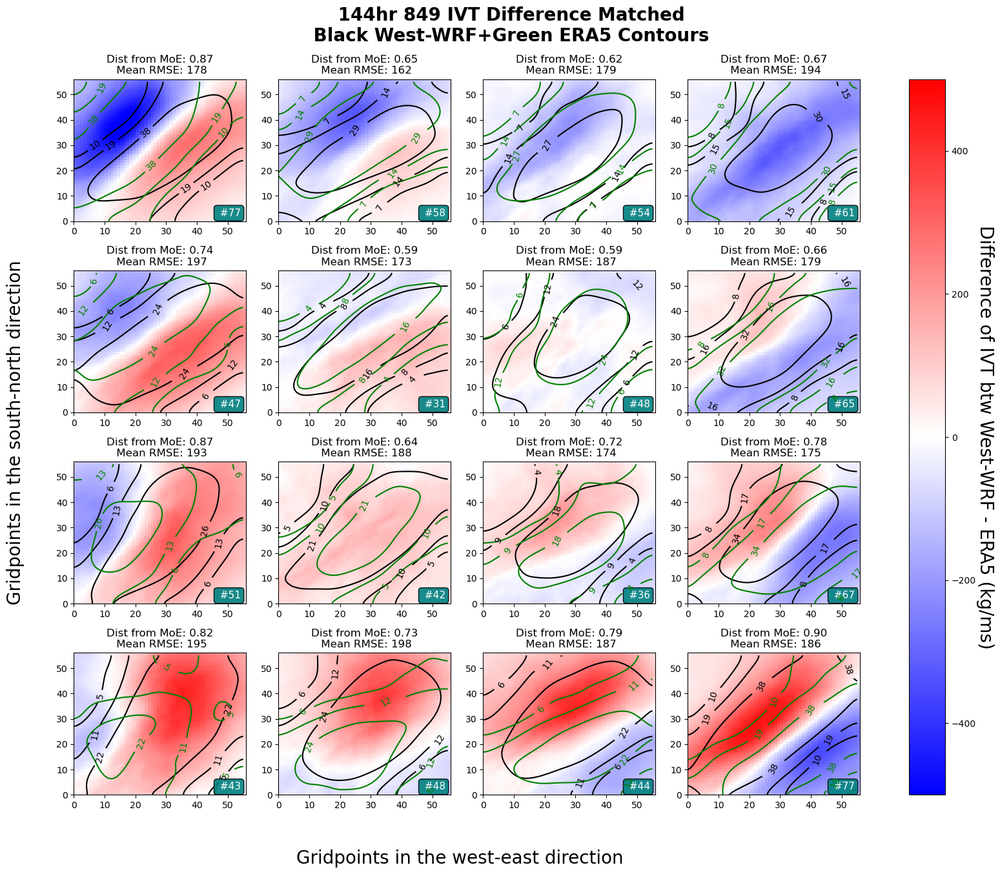

In [101]:
with open('som_matched_144_3.05_final.p', 'rb') as infile:
    newsom = pickle.load(infile)
# if som==newsom:
    
        
plt.figure(figsize=(10, 9))
cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
plt.title("distance map of the ivt", fontsize=12)
plt.colorbar(cs)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()


# this may take a few minutes if lots of data! currently doing every 20th point so not bad

# grab the x and y coords across the lattice for the winner node for each data point

w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
print(len(w_x))
w_x = np.array(w_x)
w_y = np.array(w_y)
print(w_x)
print(w_y)

# visualize where data falls in lattice (nearest winning neuron/node)

plt.figure(figsize=(10, 9))
plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
plt.colorbar()

for num, c in enumerate(w_x[::1]):     # every 20th data point

    plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                w_x[num] + np.random.rand(1),
                s=50, c='k', marker='x')

plt.title("IVT data across SOM lattice", fontsize=12)
plt.margins(x=0,y=0)
plt.grid()
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()



plt.figure(figsize=(10, 9))
frequencies = newsom.activation_response(normalize_data(diff_stack).values)
plt.pcolormesh(frequencies, cmap='Blues') 
plt.colorbar()
plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()

# grabbing indices from SOM
#all the cases for 2016-2017 500 mb heights are fairly similar 
# create an empty dictionary using the rows and columns of SOM
keys = [i for i in product(range(4),range(4))]
winmap = {key: [] for key in keys}

# grab the indices for the data within the SOM lattice
for i, x in enumerate(normalize_data(diff_stack).values):
    winmap[newsom.winner(x)].append(i)

print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
som_keys = list(winmap.keys())
print(som_keys)
print(f"Number of composite maps: {len(som_keys)}")


##plot som##
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))




# (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
for map_num in range(len(som_keys)):

    diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
    fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    rmse_data=np.mean(dict_rmse[som_keys[map_num]])
    dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pv_data=pv[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#         #         pvplot=np.where(pv_data>.40,pv_data,np.nan)

#         ivt_era=era5ss_unmatch['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         ivt_wwrf=regridwrf_unmatch['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

    #di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

    projection = ccrs.PlateCarree()
    axs_class = (GeoAxes,
    dict(map_projection=projection))

#             g=[]
#             di_misses_v2={}
#             for m in miss_new['variable'].values:
#                 for key in di_dates:
#                                 #print(key)
#                     if m in di_dates[key]:

#                         if key not in di_misses_v2.keys():
#                                     di_misses_v2.update({key:m})
#                         else:
#                                 di_misses_v2[key] = di_misses_v2[key],m

#                         g.append(key)
#             e=[]
#             fa_dict={}
#             for f in fa_new['variable'].values:
#                 for key in di_dates:
#                     if f in di_dates[key]:
#                             if key not in fa_dict.keys():
#                                     fa_dict.update({key:f})
#                             else:
#                                     fa_dict[key] = fa_dict[key],f

#                             e.append(key)


#             new_dict=Counter(g)
#             new_dict_fa=Counter(e)





#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
    label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(diff_data,vmin=-500, vmax=500,cmap='bwr')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')


    n=(frequencies.flatten()[map_num])
#         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors="white") 

    #diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
    fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
    obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
#             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f"Dist from MoE: {dist_data.values:.2f}\n Mean RMSE: {rmse_data:.3g}", fontsize=12)
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')
#             plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')

#                    
    plt.clabel(fcstctr,fmt='%1.0f',colors='black')
    plt.clabel(obsctr,fmt='%1.0f',colors='green')

#         # plot the figure containing all plots



    font = {
            'color':  'white',
            'weight': 'normal',
            'size': 11,
            }

    props = dict(boxstyle='round', facecolor='teal', alpha=.9)           
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
    plt.subplots_adjust(left=0.1,
            bottom=.1, 
            right=0.5, 
            top=.9, 
            wspace=0.8, 
            hspace=0.10)
    
    props2 = dict(boxstyle='round', facecolor='gray', alpha=.9)
    
    #geo_axs[som_keys[map_num][0], som_keys[map_num][1]].text(0.45, 52, f" Node #{int(map_num)+1}", bbox=props2, fontdict=font, ha='left', va='center')



plt.tight_layout()
fig = plt.gcf()
# twin_ax = fig.add_axes([-.05, 0.1, 0.02, 0.8])
# twin_ax.set_ylabel('Gridpoints in the north-south direction (1800 km)', fontsize=20, labelpad=10)
#twin_ax.yaxis.set_label_coords(1.1, 0.5)  # Adjust the position of the label
fig.text(-0.03, 0.5, 'Gridpoints in the south-north direction', fontsize=20, ha='center', va='center', rotation=90)


fig.text(.4,-.05,'Gridpoints in the west-east direction', fontsize=20, ha='center', va='center')

fig.suptitle(" 144hr 849 IVT Difference Matched \n Black West-WRF+Green ERA5 Contours ".format(sigma=newsom._sigma,lr =newsom._learning_rate), fontsize=20,y=1.05, x=0.45, fontweight='bold')

#Sigma:{sigma:.2f},LR:{lr:.4f}
#ax1=fig.colorbar(label, ax=fig.get_axes())
cbar=fig.colorbar(label, ax=fig.get_axes())

cbar.ax.set_ylabel('Difference of IVT btw West-WRF - ERA5 (kg/ms)', rotation=270, fontsize=20,labelpad=20
      )



plt.show()


In [ ]:
# dict_rmse={}


# for sk in som_keys:
#     #print(sk)
#     rmse_arr=[]

#     for i in  range(len(np.array(winmap[sk]))):
        
        
#             rmse=(np.sqrt(np.square(diff_forecast['variable'][np.array(winmap[sk])].isel(time=i)-\
                            
#             diff_forecast['variable'][np.array(winmap[sk])].mean(dim='time')).values.mean()))
            
#             rmse_arr.append(rmse)
            
#     dict_rmse[sk]= rmse_arr

In [ ]:
regridwrf_match['variable'][mask_final]

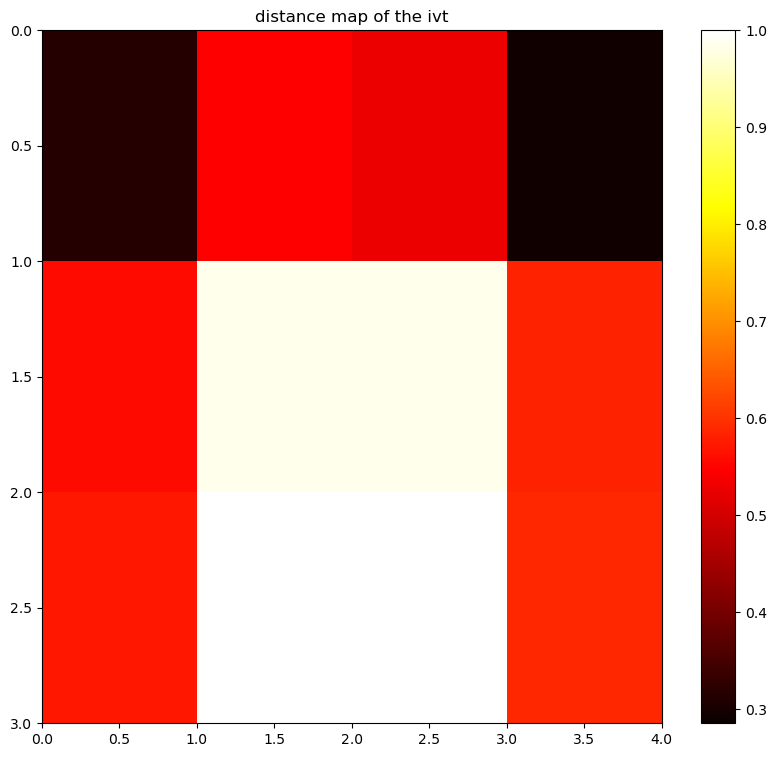

849
[0 1 2 3 3 2 3 1 3 1 2 1 3 3 3 2 3 0 0 1 3 3 0 1 0 3 3 2 1 3 3 2 3 2 3 3 1
 0 1 0 3 0 3 3 0 2 1 2 2 3 3 2 1 0 2 1 3 3 3 1 0 3 1 2 3 0 0 1 0 2 1 0 0 0
 0 1 3 3 2 0 3 2 3 2 2 2 1 0 3 0 2 3 0 0 0 0 0 0 1 2 1 1 1 1 3 0 1 1 2 3 0
 2 0 3 1 3 0 0 2 1 1 3 2 2 0 0 3 0 1 1 3 2 3 0 0 0 0 0 2 1 0 2 3 0 0 0 3 3
 1 2 3 0 3 2 2 3 0 1 0 0 0 0 1 1 1 2 0 0 2 0 0 1 0 1 0 0 0 1 1 3 0 2 0 3 3
 1 0 2 0 2 1 3 0 0 2 2 3 3 0 0 0 3 0 0 0 1 2 2 1 0 3 2 3 2 1 1 0 2 3 1 2 1
 2 0 2 2 0 0 3 0 3 2 2 2 1 3 0 3 1 2 0 0 3 1 0 2 3 3 3 3 1 0 0 0 0 0 0 1 0
 0 2 1 0 2 3 3 2 0 0 0 2 1 1 2 0 2 1 1 2 3 0 0 3 0 1 0 2 1 3 3 1 2 3 0 0 0
 2 0 2 1 1 1 3 0 3 0 3 1 1 1 0 3 3 3 3 3 3 2 0 2 3 3 3 3 3 3 2 1 1 0 2 3 2
 0 0 1 3 0 1 2 2 3 3 3 0 1 0 2 1 2 3 0 1 2 2 1 3 3 0 1 3 3 3 3 3 2 3 2 3 1
 1 1 0 0 2 0 0 2 1 3 1 0 1 2 3 1 2 0 0 2 1 0 1 0 2 1 1 1 1 3 2 2 3 0 3 2 2
 3 2 1 1 2 0 1 3 0 2 3 2 3 3 3 2 2 0 1 3 3 2 1 1 2 2 0 1 1 3 0 2 0 0 1 3 3
 2 3 0 0 3 3 1 2 0 1 0 0 3 0 3 0 3 0 0 2 3 0 0 1 3 0 1 2 3 1 1 0 3 1 0 0 2
 2 1 3 0 0 3 3 1 1 0 

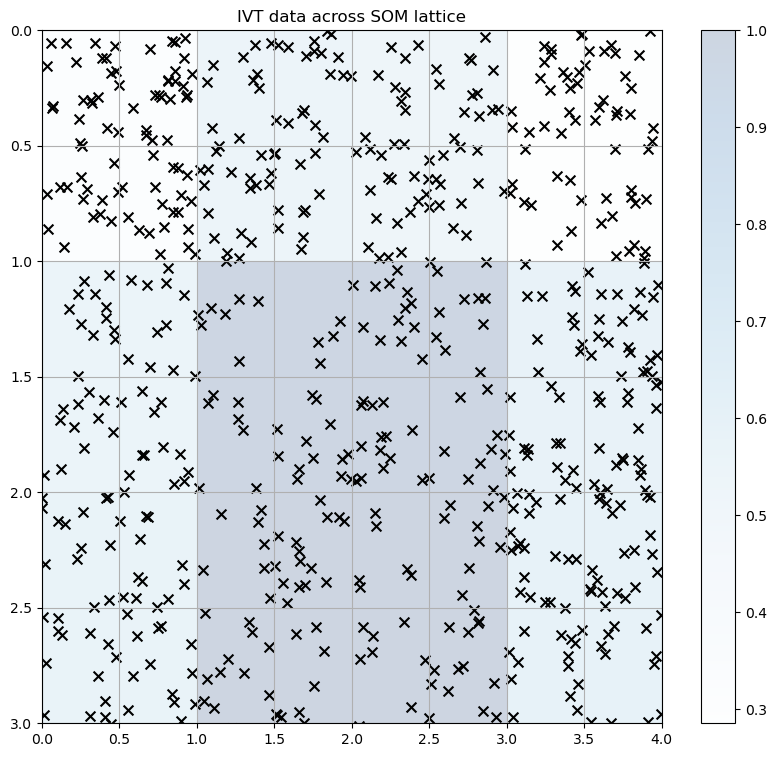

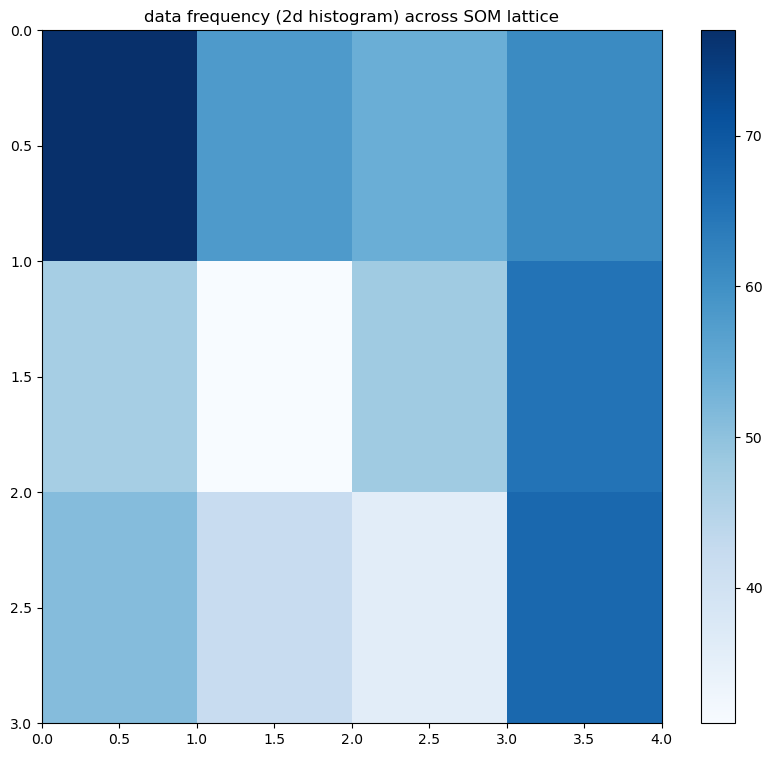

The rows and columns of the SOM lattice to use to grab SOM indexes:
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
Number of composite maps: 16


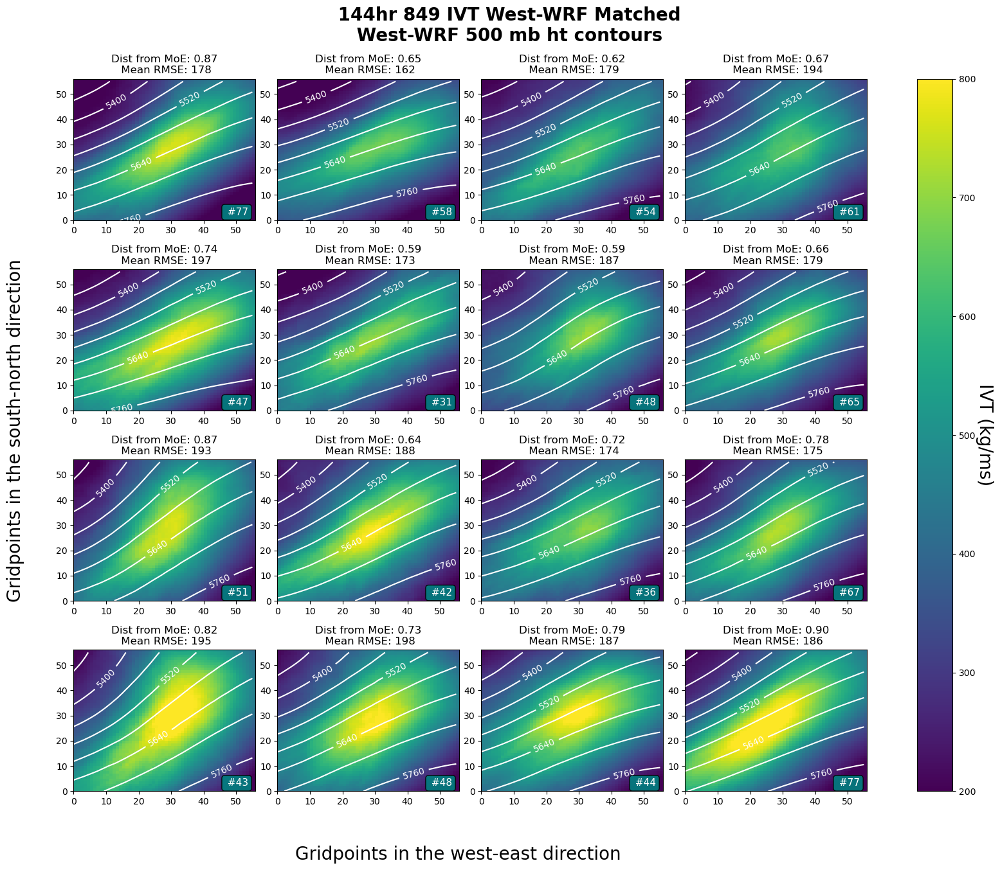

In [110]:

# if som==newsom:
    
        
plt.figure(figsize=(10, 9))
cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
plt.title("distance map of the ivt", fontsize=12)
plt.colorbar(cs)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()


# this may take a few minutes if lots of data! currently doing every 20th point so not bad

# grab the x and y coords across the lattice for the winner node for each data point

w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
print(len(w_x))
w_x = np.array(w_x)
w_y = np.array(w_y)
print(w_x)
print(w_y)

# visualize where data falls in lattice (nearest winning neuron/node)

plt.figure(figsize=(10, 9))
plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
plt.colorbar()

for num, c in enumerate(w_x[::1]):     # every 20th data point

    plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                w_x[num] + np.random.rand(1),
                s=50, c='k', marker='x')

plt.title("IVT data across SOM lattice", fontsize=12)
plt.margins(x=0,y=0)
plt.grid()
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()



plt.figure(figsize=(10, 9))
frequencies = newsom.activation_response(normalize_data(diff_stack).values)
plt.pcolormesh(frequencies, cmap='Blues') 
plt.colorbar()
plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()

# grabbing indices from SOM
#all the cases for 2016-2017 500 mb heights are fairly similar 
# create an empty dictionary using the rows and columns of SOM
keys = [i for i in product(range(4),range(4))]
winmap = {key: [] for key in keys}

# grab the indices for the data within the SOM lattice
for i, x in enumerate(normalize_data(diff_stack).values):
    winmap[newsom.winner(x)].append(i)

print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
som_keys = list(winmap.keys())
print(som_keys)
print(f"Number of composite maps: {len(som_keys)}")


##plot som##
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))




# (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
for map_num in range(len(som_keys)):

    diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
    fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    rmse_data=np.mean(dict_rmse[som_keys[map_num]])
    dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pv_data=pv[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#         #         pvplot=np.where(pv_data>.40,pv_data,np.nan)

#     x_min, x_max = np.min(w_y[winmap[som_keys[map_num]]]), np.max(w_y[winmap[som_keys[map_num]]])
#     y_min, y_max = np.min(w_x[winmap[som_keys[map_num]]]), np.max(w_x[winmap[som_keys[map_num]]])

    ivt_era=era5ss_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ivt_wwrf=regridwrf_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

    #di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

    projection = ccrs.PlateCarree()
    axs_class = (GeoAxes,
    dict(map_projection=projection))

#             g=[]
#             di_misses_v2={}
#             for m in miss_new['variable'].values:
#                 for key in di_dates:
#                                 #print(key)
#                     if m in di_dates[key]:

#                         if key not in di_misses_v2.keys():
#                                     di_misses_v2.update({key:m})
#                         else:
#                                 di_misses_v2[key] = di_misses_v2[key],m

#                         g.append(key)
#             e=[]
#             fa_dict={}
#             for f in fa_new['variable'].values:
#                 for key in di_dates:
#                     if f in di_dates[key]:
#                             if key not in fa_dict.keys():
#                                     fa_dict.update({key:f})
#                             else:
#                                     fa_dict[key] = fa_dict[key],f

#                             e.append(key)


#             new_dict=Counter(g)
#             new_dict_fa=Counter(e)





#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
    label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_wwrf,vmin=200, vmax=800,cmap='viridis')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')


    n=(frequencies.flatten()[map_num])
#         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors="white") 

    #diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#     fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#     obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
    
    htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='white',levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]) #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f"Dist from MoE: {dist_data.values:.2f}\n Mean RMSE: {rmse_data:.3g}", fontsize=12)
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')
    plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='white')



#                    
#     plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#     plt.clabel(obsctr,fmt='%1.0f',colors='green')
#         # plot the figure containing all plots



    font = {
            'color':  'white',
            'weight': 'normal',
            'size': 11,
            }

    props = dict(boxstyle='round', facecolor='teal', alpha=.9)           
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
#     plt.subplots_adjust(left=0.1,
#             bottom=.1, 
#             right=1.5, 
#             top=.9, 
#             wspace=0.8, 
#             hspace=0)


plt.tight_layout()
fig = plt.gcf()
fig.text(-0.03, 0.5, 'Gridpoints in the south-north direction', fontsize=20, ha='center', va='center', rotation=90)


fig.text(.4,-.05,'Gridpoints in the west-east direction', fontsize=20, ha='center', va='center')

fig.suptitle(" 144hr 849 IVT West-WRF Matched \n West-WRF 500 mb ht contours ".format(sigma=newsom._sigma,lr =newsom._learning_rate), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#Sigma:{sigma:.2f},LR:{lr:.4f}
#ax1=fig.colorbar(label, ax=fig.get_axes())
cbar=fig.colorbar(label, ax=fig.get_axes())
cbar.ax.set_ylabel('IVT (kg/ms)', rotation=270, fontsize=20,labelpad=20
      )

plt.show()


In [ ]:

# if som==newsom:
erahts500_cleandata=xr.open_dataset('erahts500clean_newestv3.nc')
        
plt.figure(figsize=(10, 9))
cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
plt.title("distance map of the ivt", fontsize=12)
plt.colorbar(cs)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()


# this may take a few minutes if lots of data! currently doing every 20th point so not bad

# grab the x and y coords across the lattice for the winner node for each data point

w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
print(len(w_x))
w_x = np.array(w_x)
w_y = np.array(w_y)
print(w_x)
print(w_y)

# visualize where data falls in lattice (nearest winning neuron/node)

plt.figure(figsize=(10, 9))
plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
plt.colorbar()

for num, c in enumerate(w_x[::1]):     # every 20th data point

    plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                w_x[num] + np.random.rand(1),
                s=50, c='k', marker='x')

plt.title("IVT data across SOM lattice", fontsize=12)
plt.margins(x=0,y=0)
plt.grid()
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()



plt.figure(figsize=(10, 9))
frequencies = newsom.activation_response(normalize_data(diff_stack).values)
plt.pcolormesh(frequencies, cmap='Blues') 
plt.colorbar()
plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()

# grabbing indices from SOM
#all the cases for 2016-2017 500 mb heights are fairly similar 
# create an empty dictionary using the rows and columns of SOM
keys = [i for i in product(range(4),range(4))]
winmap = {key: [] for key in keys}

# grab the indices for the data within the SOM lattice
for i, x in enumerate(normalize_data(diff_stack).values):
    winmap[newsom.winner(x)].append(i)

print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
som_keys = list(winmap.keys())
print(som_keys)
print(f"Number of composite maps: {len(som_keys)}")


##plot som##
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))




# (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
for map_num in range(len(som_keys)):

    diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
    fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    rmse_data=np.mean(dict_rmse[som_keys[map_num]])
    dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    erahts500_data=erahts500_cleandata['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pv_data=pv[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#         #         pvplot=np.where(pv_data>.40,pv_data,np.nan)

#     x_min, x_max = np.min(w_y[winmap[som_keys[map_num]]]), np.max(w_y[winmap[som_keys[map_num]]])
#     y_min, y_max = np.min(w_x[winmap[som_keys[map_num]]]), np.max(w_x[winmap[som_keys[map_num]]])

    ivt_era=era5ss_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ivt_wwrf=regridwrf_match['variable'][mask_final][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

    #di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

    projection = ccrs.PlateCarree()
    axs_class = (GeoAxes,
    dict(map_projection=projection))

#             g=[]
#             di_misses_v2={}
#             for m in miss_new['variable'].values:
#                 for key in di_dates:
#                                 #print(key)
#                     if m in di_dates[key]:

#                         if key not in di_misses_v2.keys():
#                                     di_misses_v2.update({key:m})
#                         else:
#                                 di_misses_v2[key] = di_misses_v2[key],m

#                         g.append(key)
#             e=[]
#             fa_dict={}
#             for f in fa_new['variable'].values:
#                 for key in di_dates:
#                     if f in di_dates[key]:
#                             if key not in fa_dict.keys():
#                                     fa_dict.update({key:f})
#                             else:
#                                     fa_dict[key] = fa_dict[key],f

#                             e.append(key)


#             new_dict=Counter(g)
#             new_dict_fa=Counter(e)





#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
    label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800,cmap='viridis')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')


    n=(frequencies.flatten()[map_num])
#         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors="white") 

    #diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#     fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#     obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
    #levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]
    #levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]
    htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(erahts500_data, levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040],colors='white') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f"Dist from MoE: {dist_data.values:.2f}\n Mean RMSE: {rmse_data:.3g}", fontsize=12)
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')
    plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='white')



#                    
#     plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#     plt.clabel(obsctr,fmt='%1.0f',colors='green')
#         # plot the figure containing all plots



    font = {
            'color':  'white',
            'weight': 'normal',
            'size': 11,
            }

    props = dict(boxstyle='round', facecolor='teal', alpha=.9)           
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
#     plt.subplots_adjust(left=0.1,
#             bottom=.1, 
#             right=1.5, 
#             top=.9, 
#             wspace=0.8, 
#             hspace=0)


plt.tight_layout()
fig = plt.gcf()
fig.suptitle(" 144hr 849 IVT ERA5 Matched \n ERA5 500-hPa ht contours ".format(sigma=newsom._sigma,lr =newsom._learning_rate), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#Sigma:{sigma:.2f},LR:{lr:.4f}
#ax1=fig.colorbar(label, ax=fig.get_axes())
cbar=fig.colorbar(label, ax=fig.get_axes())
fig.text(-0.03, 0.5, 'Gridpoints in the south-north direction', fontsize=20, ha='center', va='center', rotation=90)


fig.text(.4,-.05,'Gridpoints in the west-east direction', fontsize=20, ha='center', va='center')
cbar.ax.set_ylabel('IVT (kg/ms)', rotation=270, fontsize=20,labelpad=22
      )

plt.show()


In [ ]:
# era_anom.isel(time=0).plot()

In [ ]:
# era_anom.to_netcdf('era_anomv3.nc')

In [ ]:
# era500_xr_sorted['variable'].to_netcdf('fullera5htv3.nc')

In [ ]:
xr.open_dataset('htanomstackclean.nc')

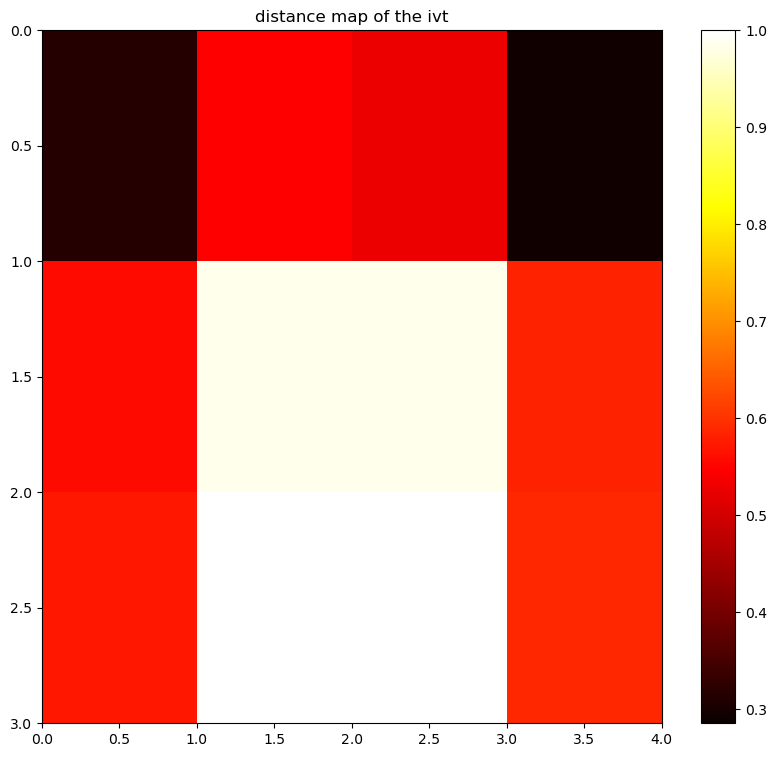

849
[0 1 2 3 3 2 3 1 3 1 2 1 3 3 3 2 3 0 0 1 3 3 0 1 0 3 3 2 1 3 3 2 3 2 3 3 1
 0 1 0 3 0 3 3 0 2 1 2 2 3 3 2 1 0 2 1 3 3 3 1 0 3 1 2 3 0 0 1 0 2 1 0 0 0
 0 1 3 3 2 0 3 2 3 2 2 2 1 0 3 0 2 3 0 0 0 0 0 0 1 2 1 1 1 1 3 0 1 1 2 3 0
 2 0 3 1 3 0 0 2 1 1 3 2 2 0 0 3 0 1 1 3 2 3 0 0 0 0 0 2 1 0 2 3 0 0 0 3 3
 1 2 3 0 3 2 2 3 0 1 0 0 0 0 1 1 1 2 0 0 2 0 0 1 0 1 0 0 0 1 1 3 0 2 0 3 3
 1 0 2 0 2 1 3 0 0 2 2 3 3 0 0 0 3 0 0 0 1 2 2 1 0 3 2 3 2 1 1 0 2 3 1 2 1
 2 0 2 2 0 0 3 0 3 2 2 2 1 3 0 3 1 2 0 0 3 1 0 2 3 3 3 3 1 0 0 0 0 0 0 1 0
 0 2 1 0 2 3 3 2 0 0 0 2 1 1 2 0 2 1 1 2 3 0 0 3 0 1 0 2 1 3 3 1 2 3 0 0 0
 2 0 2 1 1 1 3 0 3 0 3 1 1 1 0 3 3 3 3 3 3 2 0 2 3 3 3 3 3 3 2 1 1 0 2 3 2
 0 0 1 3 0 1 2 2 3 3 3 0 1 0 2 1 2 3 0 1 2 2 1 3 3 0 1 3 3 3 3 3 2 3 2 3 1
 1 1 0 0 2 0 0 2 1 3 1 0 1 2 3 1 2 0 0 2 1 0 1 0 2 1 1 1 1 3 2 2 3 0 3 2 2
 3 2 1 1 2 0 1 3 0 2 3 2 3 3 3 2 2 0 1 3 3 2 1 1 2 2 0 1 1 3 0 2 0 0 1 3 3
 2 3 0 0 3 3 1 2 0 1 0 0 3 0 3 0 3 0 0 2 3 0 0 1 3 0 1 2 3 1 1 0 3 1 0 0 2
 2 1 3 0 0 3 3 1 1 0 

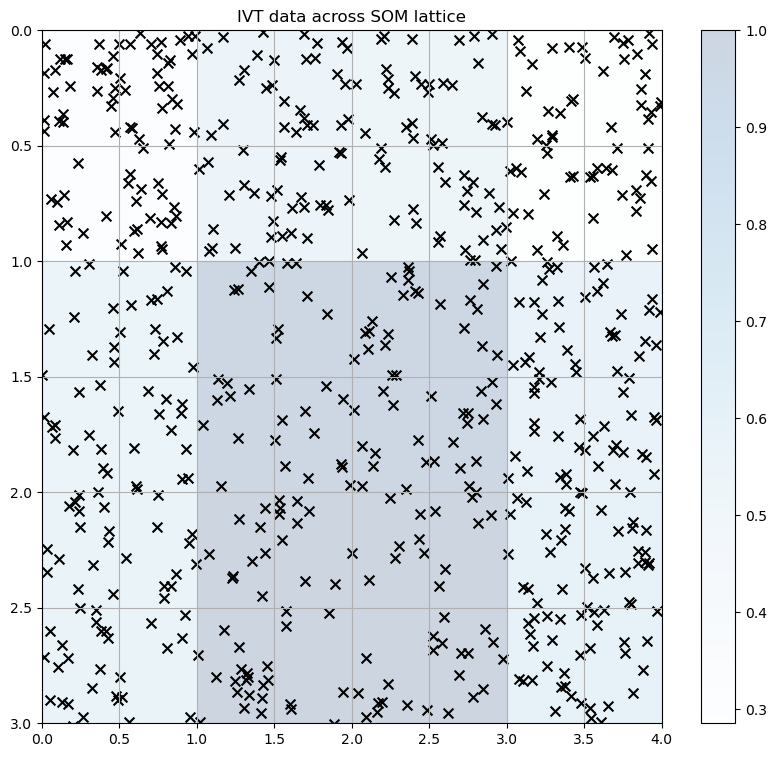

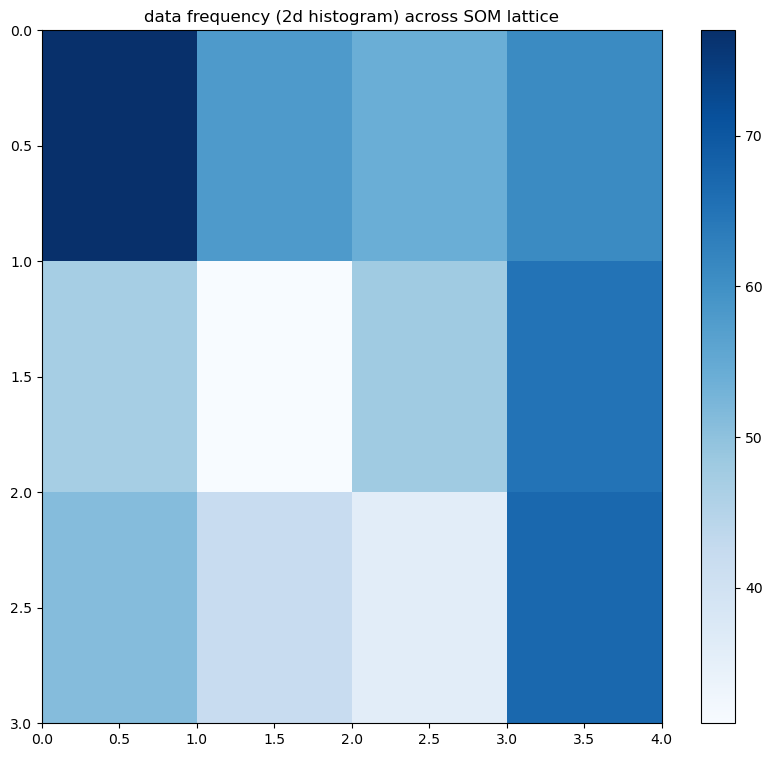

The rows and columns of the SOM lattice to use to grab SOM indexes:
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
Number of composite maps: 16


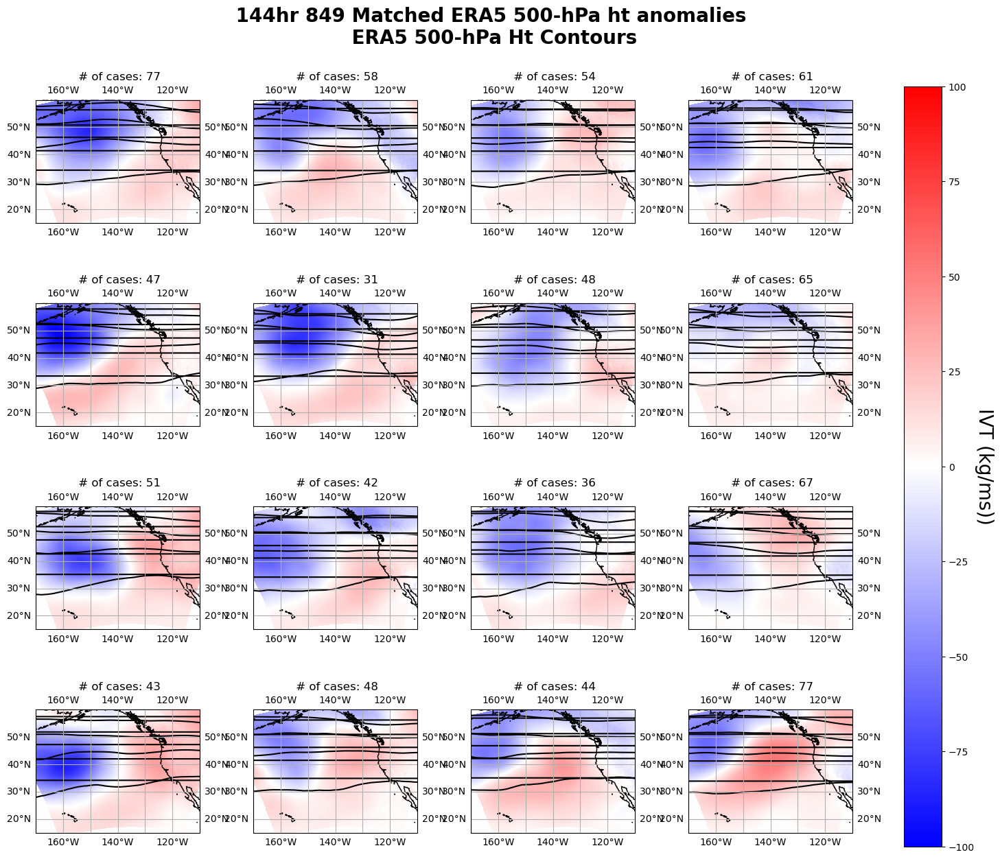

In [114]:
import matplotlib.colors as mcolors
colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

matching=1
som=4
di_dates={}
if som==4 and matching ==1:
    
    era5ss_match=xr.open_dataset('era5ss_matched_0605.nc')
    regridwrf_match=xr.open_dataset('regridwrfss_matched_0605.nc')
    diff_forecast=xr.open_dataset('diff_matched_0605.nc')
    diff_stack=diff_forecast['variable'][mask_final].stack(new=('y','x'))
    smooth_fcst=xr.open_dataset('fcst_matched.nc')
    smooth_obs=xr.open_dataset('obs_matched.nc')
    
    
#     new_fcst=old_fcst['__xarray_dataarray_variable__'][pv_mask]
#     new_obs=old_obs['__xarray_dataarray_variable__'][pv_mask]
    ht_final=xr.open_dataset('ht_matched_final.nc')
    slp_final=xr.open_dataset('slp_matched_final.nc')
    htera5=xr.open_dataset('erahts500clean_newestv3.nc')
    #era_anom_data=xr.open_dataset('era_anomv3.nc')
    era_anom_data=xr.open_dataset('htanomstackclean.nc')
    full_era5ht=xr.open_dataset('fullera5htv3.nc')
#     pv=xr.open_dataset('pv_matched_masked.nc')
   # pv_new=pv['__xarray_dataarray_variable__'][pv_mask]
#     pv_new=mpcalc.smooth_gaussian(pv_new,1)
#     west_wrf=xr.open_dataset('wrf_matched_final.nc')
   
    
    
    
#     dist_mask=centers_unmatch['fmt_date'].isin(diff_forecast['time'])
#     dist_new=xr.Dataset({'variable': (['time'],centers_unmatch['dist'])},
#              coords={"lon":(["y","x"],diff_forecast['lon'].data),
#                      "lat":(["y","x"],diff_forecast['lat'].data),
#                     "time":(["time"],diff_forecast['time'])})
#     centers_unmatch[(centers_unmatch['fmt_date']).isin(landfmt)]
#     with open('som_matched_144_3.05815.p', 'rb') as infile:
#     som_matched = pickle.load(infile)
    newsom=som_matched

    plt.figure(figsize=(10, 9))
    cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
    plt.title("distance map of the ivt", fontsize=12)
    plt.colorbar(cs)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()


    # this may take a few minutes if lots of data! currently doing every 20th point so not bad

    # grab the x and y coords across the lattice for the winner node for each data point

    w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
    print(len(w_x))
    w_x = np.array(w_x)
    w_y = np.array(w_y)
    print(w_x)
    print(w_y)

    # visualize where data falls in lattice (nearest winning neuron/node)

    plt.figure(figsize=(10, 9))
    plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
    plt.colorbar()

    for num, c in enumerate(w_x[::1]):     # every 20th data point

        plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                    w_x[num] + np.random.rand(1),
                    s=50, c='k', marker='x')

    plt.title("IVT data across SOM lattice", fontsize=12)
    plt.margins(x=0,y=0)
    plt.grid()
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()



    plt.figure(figsize=(10, 9))
    frequencies = newsom.activation_response(normalize_data(diff_stack).values)
    plt.pcolormesh(frequencies, cmap='Blues') 
    plt.colorbar()
    plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()

    # grabbing indices from SOM
    #all the cases for 2016-2017 500 mb heights are fairly similar 
    # create an empty dictionary using the rows and columns of SOM
    keys = [i for i in product(range(4),range(4))]
    winmap = {key: [] for key in keys}

    # grab the indices for the data within the SOM lattice
    for i, x in enumerate(normalize_data(diff_stack).values):
        winmap[newsom.winner(x)].append(i)

    print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
    som_keys = list(winmap.keys())
    print(som_keys)
    print(f"Number of composite maps: {len(som_keys)}")


    ##plot som##
    fig, geo_axs = plt.subplots(4, 4, figsize=(16,12),subplot_kw={'projection':ccrs.PlateCarree()})
#     fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
    di_dates={}



    # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
    for map_num in range(len(som_keys)):

#             diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
#             fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        #ht500=htera5['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        era5_anom=era_anom_data['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        full_era5ht_data= full_era5ht['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#             dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

#         ivt_era=era5ss_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         ivt_wwrf=regridwrf_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

        newlons=np.where(era5_anom['lon'] < 0., era5_anom['lon'], (era5_anom['lon']-360.))

        newlats=np.where(era5_anom['lat'] < 0.,era5_anom['lat'], (era5_anom['lat']-90.))
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_extent([-170, -110, 15, 60],crs=ccrs.PlateCarree())

        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].coastlines()
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].gridlines(draw_labels=True)



#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
        label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(newlons,era5_anom['lat'],era5_anom, vmin=-100, vmax=100, cmap='bwr')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')
#         label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800, cmap='viridis')



        n=(frequencies.flatten()[map_num])
        #newlons,era5_anom['lat']
        htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(newlons,era5_anom['lat'],full_era5ht_data,colors="black") 

#             diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#             fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#             obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
#             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

        #plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')

    #                    
#             plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#             plt.clabel(obsctr,fmt='%1.0f',colors='green')
    #         # plot the figure containing all plots


    plt.tight_layout()
    fig = plt.gcf()
#         fig.suptitle("144hr 851 PV +SLP {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#         fig.suptitle("144hr 698 Unmatched SLP+500 mb hts {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    fig.suptitle(" 144hr 849 Matched ERA5 500-hPa ht anomalies \n ERA5 500-hPa Ht Contours".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    #ax1=fig.colorbar(label, ax=fig.get_axes())
    cbar=fig.colorbar(label, ax=fig.get_axes())
#         cbar.ax.set_ylabel('900-700 layer avg PV (PVU)', rotation=270, fontsize=20,labelpad=20)
# #               )
#         cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
# #               )
    cbar.ax.set_ylabel('IVT (kg/ms))', rotation=270, fontsize=20,labelpad=20
          )

    plt.show()


In [ ]:
full_hts2['variable'][np.array(winmap[som_keys[map_num]])].values

In [ ]:
import matplotlib.colors as mcolors
colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

matching=1
som=4
di_dates={}
di_htanom={}
di_hts={}
# di_lons={}
# di_lats={}
if som==4 and matching ==1:
    
    era5ss_match=xr.open_dataset('era5ss_matched_0605.nc')
    regridwrf_match=xr.open_dataset('regridwrfss_matched_0605.nc')
    diff_forecast=xr.open_dataset('diff_matched_0605.nc')
    diff_stack=diff_forecast['variable'][pv_mask].stack(new=('y','x'))
    smooth_fcst=xr.open_dataset('fcst_matched.nc')
    smooth_obs=xr.open_dataset('obs_matched.nc')
    full_hts2=xr.open_dataset('hts144.nc')
    wwrf_full=xr.open_dataset('anomfull_wwrf.nc')
#     anom_full.to_netcdf('anomfull_wwrf.nc')
    
    
#     new_fcst=old_fcst['__xarray_dataarray_variable__'][pv_mask]
#     new_obs=old_obs['__xarray_dataarray_variable__'][pv_mask]
    ht_final=xr.open_dataset('ht_matched_final.nc')
    slp_final=xr.open_dataset('slp_matched_final.nc')
    htera5=xr.open_dataset('erahts500clean_newestv3.nc')
    era_anom_data=xr.open_dataset('era_anomv3.nc')
    full_era5ht=xr.open_dataset('fullera5htv3.nc')
#     pv=xr.open_dataset('pv_matched_masked.nc')
    pv_new=pv['__xarray_dataarray_variable__'][pv_mask]
#     pv_new=mpcalc.smooth_gaussian(pv_new,1)
#     west_wrf=xr.open_dataset('wrf_matched_final.nc')
   
    
    
    
#     dist_mask=centers_unmatch['fmt_date'].isin(diff_forecast['time'])
#     dist_new=xr.Dataset({'variable': (['time'],centers_unmatch['dist'])},
#              coords={"lon":(["y","x"],diff_forecast['lon'].data),
#                      "lat":(["y","x"],diff_forecast['lat'].data),
#                     "time":(["time"],diff_forecast['time'])})
#     centers_unmatch[(centers_unmatch['fmt_date']).isin(landfmt)]
#     with open('som_matched_144_3.05815.p', 'rb') as infile:
#     som_matched = pickle.load(infile)
    newsom=som_matched

    plt.figure(figsize=(10, 9))
    cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
    plt.title("distance map of the ivt", fontsize=12)
    plt.colorbar(cs)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()


    # this may take a few minutes if lots of data! currently doing every 20th point so not bad

    # grab the x and y coords across the lattice for the winner node for each data point

    w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
    print(len(w_x))
    w_x = np.array(w_x)
    w_y = np.array(w_y)
    print(w_x)
    print(w_y)

    # visualize where data falls in lattice (nearest winning neuron/node)

    plt.figure(figsize=(10, 9))
    plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
    plt.colorbar()

    for num, c in enumerate(w_x[::1]):     # every 20th data point

        plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                    w_x[num] + np.random.rand(1),
                    s=50, c='k', marker='x')

    plt.title("IVT data across SOM lattice", fontsize=12)
    plt.margins(x=0,y=0)
    plt.grid()
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()



    plt.figure(figsize=(10, 9))
    frequencies = newsom.activation_response(normalize_data(diff_stack).values)
    plt.pcolormesh(frequencies, cmap='Blues') 
    plt.colorbar()
    plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()

    # grabbing indices from SOM
    #all the cases for 2016-2017 500 mb heights are fairly similar 
    # create an empty dictionary using the rows and columns of SOM
    keys = [i for i in product(range(4),range(4))]
    winmap = {key: [] for key in keys}

    # grab the indices for the data within the SOM lattice
    for i, x in enumerate(normalize_data(diff_stack).values):
        winmap[newsom.winner(x)].append(i)

    print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
    som_keys = list(winmap.keys())
    print(som_keys)
    print(f"Number of composite maps: {len(som_keys)}")


    ##plot som##
    fig, geo_axs = plt.subplots(4, 4, figsize=(16,12),subplot_kw={'projection':ccrs.PlateCarree()})
#     fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
    di_dates={}



    # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
    for map_num in range(len(som_keys)):

#             diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
#             fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        ht500=htera5['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        era5_anom=era_anom_data['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        full_era5ht_data= full_era5ht['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        full_hts_wwrf=full_hts2['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        wwrf_anom_data=wwrf_full['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#             dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

#         ivt_era=era5ss_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         ivt_wwrf=regridwrf_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]
        di_htanom[som_keys[map_num][0],som_keys[map_num][1]]=wwrf_full['variable'][np.array(winmap[som_keys[map_num]])].values
        di_hts[som_keys[map_num][0],som_keys[map_num][1]]=full_hts2['variable'][np.array(winmap[som_keys[map_num]])].values
#         di_lons[som_keys[map_num][0],som_keys[map_num][1]]=full_hts2['lon'][np.array(winmap[som_keys[map_num]])].values
#         di_lats[som_keys[map_num][0],som_keys[map_num][1]]=full_hts2['lat'][np.array(winmap[som_keys[map_num]])].values



        newlons=np.where(wwrf_anom_data['lon'] < 0., wwrf_anom_data['lon'], (wwrf_anom_data['lon']-360.))

        newlats=np.where(wwrf_anom_data['lat'] < 0.,wwrf_anom_data['lat'], (wwrf_anom_data['lat']-90.))
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_extent([-170, -110, 15, 60],crs=ccrs.PlateCarree())

        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].coastlines()
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].gridlines(draw_labels=True)



#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
        label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(newlons,wwrf_anom_data['lat'],wwrf_anom_data, vmin=-50, vmax=50, cmap='bwr')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')
#         label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800, cmap='viridis')



        n=(frequencies.flatten()[map_num])
        #newlons,era5_anom['lat']
        htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(newlons,full_hts_wwrf['lat'],full_hts_wwrf,colors="black") 

#             diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#             fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#             obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
#             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

        plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')

    #                    
#             plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#             plt.clabel(obsctr,fmt='%1.0f',colors='green')
    #         # plot the figure containing all plots


    plt.tight_layout()
    fig = plt.gcf()
#         fig.suptitle("144hr 851 PV +SLP {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#         fig.suptitle("144hr 698 Unmatched SLP+500 mb hts {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    fig.suptitle(" 144hr 849 Matched West-WRF 500 mb ht anomalies \n West-WRF 500mb Ht Contours".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    #ax1=fig.colorbar(label, ax=fig.get_axes())
    cbar=fig.colorbar(label, ax=fig.get_axes())
#         cbar.ax.set_ylabel('900-700 layer avg PV (PVU)', rotation=270, fontsize=20,labelpad=20)
# #               )
#         cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
# #               )
    cbar.ax.set_ylabel('500 mb ht anomaly (mb))', rotation=270, fontsize=20,labelpad=20
          )

    plt.show()


In [ ]:
di_four_htanom = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_four_htanom[0,0]['(0, 0)'].extend(di_htanom[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_four_htanom[0,0]['(0, 1)'].extend(di_htanom[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_four_htanom[0,0]['(1, 0)'].extend(di_htanom[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_four_htanom[0,0]['(1, 1)'].extend(di_htanom[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_four_htanom[0,1]['(0,2)'].extend(di_htanom[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_four_htanom[0,1]['(1,2)'].extend(di_htanom[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_four_htanom[0,1]['(0,3)'].extend(di_htanom[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_four_htanom[0,1]['(1,3)'].extend(di_htanom[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_four_htanom[1,0]['(2,0)'].extend(di_htanom[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_four_htanom[1,0]['(2,1)'].extend(di_htanom[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_four_htanom[1,0]['(3,0)'].extend(di_htanom[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_four_htanom[1,0]['(3,1)'].extend(di_htanom[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_four_htanom[1,1]['(2,2)'].extend(di_htanom[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_four_htanom[1,1]['(2,3)'].extend(di_htanom[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_four_htanom[1,1]['(3,2)'].extend(di_htanom[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_four_htanom[1,1]['(3,3)'].extend(di_htanom[3,3])
        
        


In [ ]:
di_four_hts = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_four_hts[0,0]['(0, 0)'].extend(di_hts[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_four_hts[0,0]['(0, 1)'].extend(di_hts[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_four_hts[0,0]['(1, 0)'].extend(di_hts[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_four_hts[0,0]['(1, 1)'].extend(di_hts[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_four_hts[0,1]['(0,2)'].extend(di_hts[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_four_hts[0,1]['(1,2)'].extend(di_hts[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_four_hts[0,1]['(0,3)'].extend(di_hts[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_four_hts[0,1]['(1,3)'].extend(di_hts[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_four_hts[1,0]['(2,0)'].extend(di_hts[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_four_hts[1,0]['(2,1)'].extend(di_hts[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_four_hts[1,0]['(3,0)'].extend(di_hts[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_four_hts[1,0]['(3,1)'].extend(di_hts[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_four_hts[1,1]['(2,2)'].extend(di_hts[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_four_hts[1,1]['(2,3)'].extend(di_hts[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_four_hts[1,1]['(3,2)'].extend(di_hts[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_four_hts[1,1]['(3,3)'].extend(di_hts[3,3])
        
        


# Do a four grouping plot of ht anomalies

In [ ]:
height1=np.concatenate([wwrf_full['variable'][np.array(winmap[som_keys[0]])],wwrf_full['variable'][np.array(winmap[som_keys[1]])],
wwrf_full['variable'][np.array(winmap[som_keys[4]])],wwrf_full['variable'][np.array(winmap[som_keys[5]])]])

height2=np.concatenate([wwrf_full['variable'][np.array(winmap[som_keys[2]])],wwrf_full['variable'][np.array(winmap[som_keys[3]])],
wwrf_full['variable'][np.array(winmap[som_keys[6]])],wwrf_full['variable'][np.array(winmap[som_keys[7]])]])

height3=np.concatenate([wwrf_full['variable'][np.array(winmap[som_keys[8]])],wwrf_full['variable'][np.array(winmap[som_keys[9]])],
wwrf_full['variable'][np.array(winmap[som_keys[12]])],wwrf_full['variable'][np.array(winmap[som_keys[13]])]])

height4=np.concatenate([wwrf_full['variable'][np.array(winmap[som_keys[10]])],wwrf_full['variable'][np.array(winmap[som_keys[11]])],
wwrf_full['variable'][np.array(winmap[som_keys[14]])],wwrf_full['variable'][np.array(winmap[som_keys[15]])]])

In [ ]:
heightfull1=np.concatenate([full_hts2['variable'][np.array(winmap[som_keys[0]])],full_hts2['variable'][np.array(winmap[som_keys[1]])],
full_hts2['variable'][np.array(winmap[som_keys[4]])],full_hts2['variable'][np.array(winmap[som_keys[5]])]])

heightfull2=np.concatenate([full_hts2['variable'][np.array(winmap[som_keys[2]])],full_hts2['variable'][np.array(winmap[som_keys[3]])],
full_hts2['variable'][np.array(winmap[som_keys[6]])],full_hts2['variable'][np.array(winmap[som_keys[7]])]])

heightfull3=np.concatenate([full_hts2['variable'][np.array(winmap[som_keys[8]])],full_hts2['variable'][np.array(winmap[som_keys[9]])],
full_hts2['variable'][np.array(winmap[som_keys[12]])],full_hts2['variable'][np.array(winmap[som_keys[13]])]])

heightfull4=np.concatenate([full_hts2['variable'][np.array(winmap[som_keys[10]])],full_hts2['variable'][np.array(winmap[som_keys[11]])],
full_hts2['variable'][np.array(winmap[som_keys[14]])],full_hts2['variable'][np.array(winmap[som_keys[15]])]])

In [ ]:
height1_mean=np.mean(height1,axis=0)
height2_mean=np.mean(height2,axis=0)
height3_mean=np.mean(height3,axis=0)
height4_mean=np.mean(height4,axis=0)

height1full_mean=np.mean(heightfull1,axis=0)
height2full_mean=np.mean(heightfull2,axis=0)
height3full_mean=np.mean(heightfull3,axis=0)
height4full_mean=np.mean(heightfull4,axis=0)

In [ ]:
newlons.shape,wwrf_full['lat'].shape

In [ ]:
fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
label_list = ['Too Fast', 'Too Weak', 'Too Intense', 'Too Slow']
Ht_levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]
newlons=np.where(wwrf_full['lon'] < 0., wwrf_full['lon'], (wwrf_full['lon']-360.))

# Assuming you want to add text to the top-left subplot [0, 0]
label=geo_axs[0, 0].pcolormesh(height1_mean, vmin=-10, vmax=10, cmap='bwr')
htctr=geo_axs[0, 0].contour(newlons,wwrf_full['lat'],height1full_mean, vmin=-25, vmax=25, colors='black',levels=Ht_levels)
geo_axs[0, 0].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[0, 0].coastlines()
geo_axs[0, 0].text(0.05, 0.9, label_list[0], transform=geo_axs[0, 0].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[0, 0].gridlines(draw_labels=True)
geo_axs[0,0].clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')

geo_axs[0, 1].pcolormesh(height2_mean, vmin=-10, vmax=10, cmap='bwr')
geo_axs[0, 1].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[0, 1].coastlines()
geo_axs[0, 1].text(0.05, 0.9, label_list[1], transform=geo_axs[0, 1].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[0, 1].gridlines(draw_labels=True)
htctr2=geo_axs[0, 1].contour(newlons,wwrf_full['lat'],height2full_mean, vmin=-25, vmax=25, colors='black',levels=Ht_levels)
geo_axs[0,1].clabel(htctr2,htctr2.levels[::2],fmt='%1.0f',colors='black')


geo_axs[1, 0].pcolormesh(height3_mean, vmin=-10, vmax=10, cmap='bwr')
geo_axs[1, 0].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[1, 0].coastlines()
geo_axs[1, 0].text(0.05, 0.9, label_list[2], transform=geo_axs[1, 0].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[1, 0].gridlines(draw_labels=True)
htctr3=geo_axs[1, 0].contour(newlons,wwrf_full['lat'],height3full_mean, vmin=-25, vmax=25, colors='black',levels=Ht_levels)
geo_axs[1,0].clabel(htctr3,htctr3.levels[::2],fmt='%1.0f',colors='black')


geo_axs[1, 1].pcolormesh(height4_mean, vmin=-10, vmax=10, cmap='bwr')
geo_axs[1, 1].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[1, 1].coastlines()
htctr4=geo_axs[1, 1].contour(newlons,wwrf_full['lat'],height4full_mean, vmin=-10, vmax=10, colors='black',levels=Ht_levels)
geo_axs[1, 1].text(0.05, 0.9, label_list[3], transform=geo_axs[1, 1].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[1, 1].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[1, 1].coastlines()
geo_axs[1, 1].text(0.05, 0.9, label_list[0], transform=geo_axs[0, 0].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[1,1].clabel(htctr4,htctr4.levels[::2],fmt='%1.0f',colors='black')

geo_axs[1, 1].gridlines(draw_labels=True)


cbar = fig.colorbar(label, ax=fig.get_axes())

cbar.ax.set_ylabel('500 mb ht anomaly (m)', rotation=270, fontsize=20, labelpad=20)

#plt.tight_layout()
fig.suptitle(
    "144hr 849 Normalized Ht Anomaly Histogram Phases",
    fontsize=20, y=1.05, x=0.40, fontweight='bold'
)

plt.show()


In [ ]:
wwrf_full['variable'][np.array(winmap[som_keys[0]])].mean(dim="time",skipna=True)


In [ ]:
fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
label_list = ['Too Fast', 'Too Weak', 'Too Intense', 'Too Slow']
Ht_levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]
newlons=np.where(wwrf_full['lon'] < 0., wwrf_full['lon'], (wwrf_full['lon']-360.))

# Assuming you want to add text to the top-left subplot [0, 0]
label=geo_axs[0, 0].pcolormesh(wwrf_full['variable'][np.array(winmap[som_keys[0]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, cmap='bwr')
htctr=geo_axs[0, 0].contour(newlons,wwrf_full['lat'],full_hts2['variable'][np.array(winmap[som_keys[0]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, colors='black',levels=Ht_levels)
geo_axs[0, 0].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[0, 0].coastlines()
geo_axs[0, 0].text(0.05, 0.9, label_list[0], transform=geo_axs[0, 0].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[0, 0].gridlines(draw_labels=True)
geo_axs[0,0].clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')



geo_axs[0, 1].pcolormesh(wwrf_full['variable'][np.array(winmap[som_keys[3]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, cmap='bwr')
geo_axs[0, 1].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())

geo_axs[0, 1].coastlines()
geo_axs[0, 1].text(0.05, 0.9, label_list[1], transform=geo_axs[0, 1].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[0, 1].gridlines(draw_labels=True)
htctr2=geo_axs[0, 1].contour(newlons,wwrf_full['lat'],full_hts2['variable'][np.array(winmap[som_keys[3]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, colors='black',levels=Ht_levels)
geo_axs[0,1].clabel(htctr2,htctr2.levels[::2],fmt='%1.0f',colors='black')


geo_axs[1, 0].pcolormesh(wwrf_full['variable'][np.array(winmap[som_keys[12]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, cmap='bwr')
geo_axs[1, 0].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[1, 0].coastlines()
geo_axs[1, 0].text(0.05, 0.9, label_list[2], transform=geo_axs[1, 0].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[1, 0].gridlines(draw_labels=True)
htctr3=geo_axs[1, 0].contour(newlons,wwrf_full['lat'],full_hts2['variable'][np.array(winmap[som_keys[12]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, colors='black',levels=Ht_levels)
geo_axs[1,0].clabel(htctr3,htctr3.levels[::2],fmt='%1.0f',colors='black')



geo_axs[1, 1].pcolormesh(wwrf_full['variable'][np.array(winmap[som_keys[15]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, cmap='bwr')
geo_axs[1, 1].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[1, 1].coastlines()
htctr4=geo_axs[1, 1].contour(newlons,wwrf_full['lat'],full_hts2['variable'][np.array(winmap[som_keys[15]])].mean(dim="time",skipna=True), vmin=-10, vmax=10, colors='black',levels=Ht_levels)
geo_axs[1, 1].text(0.05, 0.9, label_list[3], transform=geo_axs[1, 1].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[1, 1].set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())
geo_axs[1, 1].coastlines()
geo_axs[1, 1].text(0.05, 0.9, label_list[0], transform=geo_axs[0, 0].transAxes, fontsize=14, fontweight='bold', color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
geo_axs[1,1].clabel(htctr4,htctr4.levels[::2],fmt='%1.0f',colors='black')
geo_axs[1, 1].gridlines(draw_labels=True)



cbar = fig.colorbar(label, ax=fig.get_axes())

cbar.ax.set_ylabel('500 mb ht anomaly (m)', rotation=270, fontsize=20, labelpad=20)

#plt.tight_layout()
fig.suptitle(
    "144hr 849 Four Corner Normalized Ht Anomalies",
    fontsize=20, y=.9, x=0.45, fontweight='bold'
)

plt.show()


In [ ]:


# fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
# label_list = ['Too Fast', 'Too Weak', 'Too Intense', 'Too Slow']

# for map_num, (i, ax) in enumerate(zip(di_four_htanom.keys(), geo_axs.flatten())):
#     key_i_values = di_four_htanom[i]
# #     all_values_for_i = np.concatenate(list(key_i_values))
#     all_values_for_i = all_values_for_i[all_values_for_i != None]

#     key_hts = di_four_hts[i].items()

#     anom_four = np.mean(key_i_values, axis=0)

#     ax.set_extent([-170, -110, 15, 60], crs=ccrs.PlateCarree())

#     ax.coastlines()
#     ax.text(0.05, 0.9, label_list[map_num], transform=ax.transAxes, fontsize=14, fontweight='bold', color='black',
#             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

#     ax.gridlines(draw_labels=True)

#     label = ax.pcolormesh(anom_four, vmin=-25, vmax=25, cmap='bwr')
# #     ax.contour(newlons,full_hts2['lat'],all_hts_for_i)

# #     ax.legend()

# plt.tight_layout()
# cbar = fig.colorbar(label, ax=fig.get_axes())

# cbar.ax.set_ylabel('500 mb ht anomaly (mb)', rotation=270, fontsize=20,labelpad=20
#           )

# fig.suptitle(
#     "144hr 849 Normalized Ht Anomaly Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
#     fontsize=20, y=1.05, x=0.45, fontweight='bold'
# )

# plt.show()


In [ ]:
# import matplotlib.colors as mcolors
# colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
#           '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
#           '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

# matching=1
# som=4
# di_dates={}
# if som==4 and matching ==1:
    
#     era5ss_match=xr.open_dataset('era5ss_matched_0605.nc')
#     regridwrf_match=xr.open_dataset('regridwrfss_matched_0605.nc')
#     diff_forecast=xr.open_dataset('diff_matched_0605.nc')
#     diff_stack=diff_forecast['variable'][pv_mask].stack(new=('y','x'))
#     smooth_fcst=xr.open_dataset('fcst_matched.nc')
#     smooth_obs=xr.open_dataset('obs_matched.nc')
#     full_era5ht=xr.open_dataset('hts144.nc')
#     anom_full_wwrf=xr.open_dataset('anomfull_wwrf.nc')
    
    
# #     new_fcst=old_fcst['__xarray_dataarray_variable__'][pv_mask]
# #     new_obs=old_obs['__xarray_dataarray_variable__'][pv_mask]
#     ht_final=xr.open_dataset('ht_matched_final.nc')
#     slp_final=xr.open_dataset('slp_matched_final.nc')
#     htera5=xr.open_dataset('erahts500clean_newestv3.nc')
#     era_anom_data=xr.open_dataset('era_anomv3.nc')
#     full_era5ht=xr.open_dataset('fullera5htv3.nc')
# #     pv=xr.open_dataset('pv_matched_masked.nc')
#     pv_new=pv['__xarray_dataarray_variable__'][pv_mask]
# #     pv_new=mpcalc.smooth_gaussian(pv_new,1)
# #     west_wrf=xr.open_dataset('wrf_matched_final.nc')
   
    
    
    
# #     dist_mask=centers_unmatch['fmt_date'].isin(diff_forecast['time'])
# #     dist_new=xr.Dataset({'variable': (['time'],centers_unmatch['dist'])},
# #              coords={"lon":(["y","x"],diff_forecast['lon'].data),
# #                      "lat":(["y","x"],diff_forecast['lat'].data),
# #                     "time":(["time"],diff_forecast['time'])})
# #     centers_unmatch[(centers_unmatch['fmt_date']).isin(landfmt)]
# #     with open('som_matched_144_3.05815.p', 'rb') as infile:
# #     som_matched = pickle.load(infile)
#     newsom=som_matched

#     plt.figure(figsize=(10, 9))
#     cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
#     plt.title("distance map of the ivt", fontsize=12)
#     plt.colorbar(cs)
#     plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
#     plt.show()


#     # this may take a few minutes if lots of data! currently doing every 20th point so not bad

#     # grab the x and y coords across the lattice for the winner node for each data point

#     w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
#     print(len(w_x))
#     w_x = np.array(w_x)
#     w_y = np.array(w_y)
#     print(w_x)
#     print(w_y)

#     # visualize where data falls in lattice (nearest winning neuron/node)

#     plt.figure(figsize=(10, 9))
#     plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
#     plt.colorbar()

#     for num, c in enumerate(w_x[::1]):     # every 20th data point

#         plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
#                     w_x[num] + np.random.rand(1),
#                     s=50, c='k', marker='x')

#     plt.title("IVT data across SOM lattice", fontsize=12)
#     plt.margins(x=0,y=0)
#     plt.grid()
#     plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
#     plt.show()



#     plt.figure(figsize=(10, 9))
#     frequencies = newsom.activation_response(normalize_data(diff_stack).values)
#     plt.pcolormesh(frequencies, cmap='Blues') 
#     plt.colorbar()
#     plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
#     plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
#     plt.show()

#     # grabbing indices from SOM
#     #all the cases for 2016-2017 500 mb heights are fairly similar 
#     # create an empty dictionary using the rows and columns of SOM
#     keys = [i for i in product(range(4),range(4))]
#     winmap = {key: [] for key in keys}

#     # grab the indices for the data within the SOM lattice
#     for i, x in enumerate(normalize_data(diff_stack).values):
#         winmap[newsom.winner(x)].append(i)

#     print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
#     som_keys = list(winmap.keys())
#     print(som_keys)
#     print(f"Number of composite maps: {len(som_keys)}")


#     ##plot som##
#     fig, geo_axs = plt.subplots(4, 4, figsize=(16,12),subplot_kw={'projection':ccrs.PlateCarree()})
# #     fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
#     di_dates={}



#     # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
#     for map_num in range(len(som_keys)):

# #             diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
# #             fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
# #             obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
# #             pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
# #         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
# #             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         anom_wwrf=anom_full_wwrf['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         ht500=htera5['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         era5_anom=era_anom_data['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         full_era5ht_data= full_era5ht['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
# #             pvplot=np.where(pv_data>.40,pv_data,np.nan)
# #             dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

# #         ivt_era=era5ss_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
# #         ivt_wwrf=regridwrf_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

#         di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

#         newlons=np.where(anom_wwrf['lon'] < 0., anom_wwrf['lon'], (anom_wwrf['lon']-360.))

#         newlats=np.where(anom_wwrf['lat'] < 0.,anom_wwrf['lat'], (anom_wwrf['lat']-90.))
#         geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_extent([-170, -110, 15, 60],crs=ccrs.PlateCarree())

#         geo_axs[som_keys[map_num][0],som_keys[map_num][1]].coastlines()
#         geo_axs[som_keys[map_num][0],som_keys[map_num][1]].gridlines(draw_labels=True)



# #             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
#         label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(newlons,anom_wwrf['lat'],anom_wwrf, vmin=-100, vmax=100, cmap='bwr')
# #             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')
# #         label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800, cmap='viridis')



#         n=(frequencies.flatten()[map_num])
#         #newlons,era5_anom['lat']
#         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(newlons,anom_wwrf['lat'],full_era5ht_data,colors="black") 

# #             diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
# #             fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
# #             obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
# #             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
# #             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
#         geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

#         plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')
# #             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')

#     #                    
# #             plt.clabel(fcstctr,fmt='%1.0f',colors='black')
# #             plt.clabel(obsctr,fmt='%1.0f',colors='green')
#     #         # plot the figure containing all plots


#     plt.tight_layout()
#     fig = plt.gcf()
# #         fig.suptitle("144hr 851 PV +SLP {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
# #         fig.suptitle("144hr 698 Unmatched SLP+500 mb hts {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#     fig.suptitle(" 144hr 849 Matched ERA5 500 mb ht anomalies \n ERA5 500mb Ht Contours".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#     #ax1=fig.colorbar(label, ax=fig.get_axes())
#     cbar=fig.colorbar(label, ax=fig.get_axes())
# #         cbar.ax.set_ylabel('900-700 layer avg PV (PVU)', rotation=270, fontsize=20,labelpad=20)
# # #               )
# #         cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
# # #               )
#     cbar.ax.set_ylabel('IVT (kg/ms))', rotation=270, fontsize=20,labelpad=20
#           )

#     plt.show()


In [ ]:
newlons.shape

In [ ]:
import matplotlib.colors as mcolors
colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

matching=1
som=4
di_dates={}
if som==4 and matching ==1:
    
    era5ss_match=xr.open_dataset('era5ss_matched_0605.nc')
    regridwrf_match=xr.open_dataset('regridwrfss_matched_0605.nc')
    diff_forecast=xr.open_dataset('diff_matched_0605.nc')
    diff_stack=diff_forecast['variable'][pv_mask].stack(new=('y','x'))
    smooth_fcst=xr.open_dataset('fcst_matched.nc')
    smooth_obs=xr.open_dataset('obs_matched.nc')
    
    
#     new_fcst=old_fcst['__xarray_dataarray_variable__'][pv_mask]
#     new_obs=old_obs['__xarray_dataarray_variable__'][pv_mask]
    ht_final=xr.open_dataset('ht_matched_final.nc')
    slp_final=xr.open_dataset('slp_matched_final.nc')
    htera5=xr.open_dataset('erahts500clean_newestv3.nc')
    era_anom_data=xr.open_dataset('era_anomv3.nc')
    full_era5ht=xr.open_dataset('fullera5htv3.nc')
#     pv=xr.open_dataset('pv_matched_masked.nc')
    pv_new=pv['__xarray_dataarray_variable__'][pv_mask]
#     pv_new=mpcalc.smooth_gaussian(pv_new,1)
#     west_wrf=xr.open_dataset('wrf_matched_final.nc')
   
    
    
    
#     dist_mask=centers_unmatch['fmt_date'].isin(diff_forecast['time'])
#     dist_new=xr.Dataset({'variable': (['time'],centers_unmatch['dist'])},
#              coords={"lon":(["y","x"],diff_forecast['lon'].data),
#                      "lat":(["y","x"],diff_forecast['lat'].data),
#                     "time":(["time"],diff_forecast['time'])})
#     centers_unmatch[(centers_unmatch['fmt_date']).isin(landfmt)]
#     with open('som_matched_144_3.05815.p', 'rb') as infile:
#     som_matched = pickle.load(infile)
    newsom=som_matched

    plt.figure(figsize=(10, 9))
    cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
    plt.title("distance map of the ivt", fontsize=12)
    plt.colorbar(cs)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()


    # this may take a few minutes if lots of data! currently doing every 20th point so not bad

    # grab the x and y coords across the lattice for the winner node for each data point

    w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
    print(len(w_x))
    w_x = np.array(w_x)
    w_y = np.array(w_y)
    print(w_x)
    print(w_y)

    # visualize where data falls in lattice (nearest winning neuron/node)

    plt.figure(figsize=(10, 9))
    plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
    plt.colorbar()

    for num, c in enumerate(w_x[::1]):     # every 20th data point

        plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                    w_x[num] + np.random.rand(1),
                    s=50, c='k', marker='x')

    plt.title("IVT data across SOM lattice", fontsize=12)
    plt.margins(x=0,y=0)
    plt.grid()
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()



    plt.figure(figsize=(10, 9))
    frequencies = newsom.activation_response(normalize_data(diff_stack).values)
    plt.pcolormesh(frequencies, cmap='Blues') 
    plt.colorbar()
    plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
    plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
    plt.show()

    # grabbing indices from SOM
    #all the cases for 2016-2017 500 mb heights are fairly similar 
    # create an empty dictionary using the rows and columns of SOM
    keys = [i for i in product(range(4),range(4))]
    winmap = {key: [] for key in keys}

    # grab the indices for the data within the SOM lattice
    for i, x in enumerate(normalize_data(diff_stack).values):
        winmap[newsom.winner(x)].append(i)

    print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
    som_keys = list(winmap.keys())
    print(som_keys)
    print(f"Number of composite maps: {len(som_keys)}")


    ##plot som##
    fig, geo_axs = plt.subplots(4, 4, figsize=(16,12),subplot_kw={'projection':ccrs.PlateCarree()})
#     fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
    di_dates={}



    # (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
    for map_num in range(len(som_keys)):

#             diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
#             fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
#             pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
#             slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        ht500=htera5['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        era5_anom=era_anom_data['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        full_era5ht_data= full_era5ht['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#             pvplot=np.where(pv_data>.40,pv_data,np.nan)
#             dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

#         ivt_era=era5ss_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#         ivt_wwrf=regridwrf_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

        di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

        newlons=np.where(era5_anom['lon'] < 0., era5_anom['lon'], (era5_anom['lon']-360.))

        newlats=np.where(era5_anom['lat'] < 0.,era5_anom['lat'], (era5_anom['lat']-90.))
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_extent([-170, -110, 15, 60],crs=ccrs.PlateCarree())

        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].coastlines()
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].gridlines(draw_labels=True)



#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
        label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(newlons,era5_anom['lat'],era5_anom, vmin=-100, vmax=100, cmap='bwr')
#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')
#         label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_era,vmin=200, vmax=800, cmap='viridis')



        n=(frequencies.flatten()[map_num])
        #newlons,era5_anom['lat']
        htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(newlons,era5_anom['lat'],full_era5ht_data,colors="black") 

#             diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#             fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#             obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
#             htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black') #cmap="Blues", 
#             slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp, colors='black')
        geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

        plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')
#             plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')

    #                    
#             plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#             plt.clabel(obsctr,fmt='%1.0f',colors='green')
    #         # plot the figure containing all plots


    plt.tight_layout()
    fig = plt.gcf()
#         fig.suptitle("144hr 851 PV +SLP {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#         fig.suptitle("144hr 698 Unmatched SLP+500 mb hts {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    fig.suptitle(" 144hr 849 Matched ERA5 500 mb ht anomalies \n ERA5 500mb Ht Contours".format(sigma=newsom._sigma,lr =.1), fontsize=20,y=1.05, x=0.45, fontweight='bold')
    #ax1=fig.colorbar(label, ax=fig.get_axes())
    cbar=fig.colorbar(label, ax=fig.get_axes())
#         cbar.ax.set_ylabel('900-700 layer avg PV (PVU)', rotation=270, fontsize=20,labelpad=20)
# #               )
#         cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
# #               )
    cbar.ax.set_ylabel('IVT (kg/ms))', rotation=270, fontsize=20,labelpad=20
          )

    plt.show()


In [ ]:
era5_stack=era5ss_match['variable'][pv_mask].stack(new=('y','x'))

In [ ]:
era5_stack

In [119]:
pv=xr.open_dataset('repv_march212024.nc')

In [120]:
pv_new=mpcalc.smooth_gaussian(pv['variable'],0.25)

In [121]:
pv_new.shape

(849, 56, 56)

In [122]:
pv_nonsmooth=xr.open_dataset('pv144_jan2024.nc')

In [123]:
pv_nonsmooth

<xarray.Dataset>
Dimensions:   (time: 1561, y: 569, x: 618)
Coordinates:
    lon       (y, x) float32 ...
    lat       (y, x) float32 ...
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float32 ...

In [ ]:
diff_stack['time']

In [124]:

ds_tmp = xe.Regridder(pv_nonsmooth.isel(time=0).drop('time')['variable'], 
                      era_best.isel(time=0).drop('time')['variable'], 
                      method="bilinear", reuse_weights=False)


In [125]:
re_pv_list=[]
for time in diff_stack['time']:
    
    re_pv=ds_tmp(pv_nonsmooth['variable'].sel(time=time), keep_attrs=True, skipna=True)
    re_pv_list.append(re_pv)
re_pv_list=np.asarray(re_pv_list)

In [127]:
re_pv_list.shape

(849, 721, 1440)

In [132]:
erahts500_cleaned=xr.open_dataset('erahts500_dec2423.nc')

In [133]:
mask_era5=erahts500_cleaned['time'].isin(diff_stack['time'])

In [134]:
erahts500_cleaned['variable'][mask_era5]

<xarray.DataArray 'variable' (time: 849, y: 721, x: 1440)>
[881465760 values with dtype=float32]
Coordinates:
    lon      (x) float32 ...
    lat      (y) float32 ...
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x

In [ ]:
diff_forecast

In [128]:
re_pv_xr=xr.Dataset({'variable': (['time','y','x'],np.asarray(re_pv_list))},
             coords={"lon":(["x"],era_best['lon'].data),
                     "lat":(["y"],era_best['lat'].data),
                    "time":(["time"],diff_stack['time'].data)})

In [135]:
era2_mask=full_era['time'].isin(diff_stack['time'])

In [136]:
full_era['variable'][era2_mask]

<xarray.DataArray 'variable' (time: 849, x: 721, y: 1440)>
[881465760 values with dtype=float64]
Coordinates:
    lon      (y) float64 ...
    lat      (x) float64 ...
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: x, y

In [ ]:
re_pv_xr['variable'].isel(time=0).plot()

In [139]:


subdates=[]
era5lon=[]
era5lat=[]
# era5ht=[]
centroids_lat=[]
centroids_lon=[]
repv_regrid=[]

for num, (i_lon, j_lat)  in enumerate(zip(loncentarr[dist_mask], latcentarr[dist_mask])):
    
    print(f"Original lat and lon: {i_lon, j_lat}")
    
    if np.shape(indices_coords(full_era['variable'][era2_mask].isel(time=num), i_lon, j_lat))==(2, ):
        
        i_, j_ = indices_coords(full_era['variable'][era2_mask].isel(time=num), i_lon, j_lat)
        
        temp_grid = full_era['variable'][era2_mask].isel(time=num).isel(y = i_, x = j_)
        # grab the nearest lat lon values in WRF grid
        
        print(f"Closest lat and lon: {float(temp_grid.lon.values), float(temp_grid.lat.values)}")

        
        AR_grid_era500=erahts500_cleaned['variable'].isel(time=num).isel(
            y=slice(i_ - 28, i_ + 28), 
            x=slice(j_ - 28, j_ + 28))
        

        
#         AR_reslp=reslp_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
#                                 x=slice(j_ - 28, j_ + 28))
        
#         AR_reht=reht500_xr['variable'].isel(time=num).isel(y=slice(i_ - 28, i_ + 28), 
#                                 x=slice(j_ - 28, j_ + 28))
        
        AR_pv=re_pv_xr['variable'].isel(time=num).isel(y=slice(j_ - 28, j_ + 28), 
                                x=slice(i_ - 28, i_ + 28))
        
        
        
        if AR_pv.shape==(56, 56):
            
            print(num)
            
            centroids_lat.append(float(temp_grid.lat.values))
            centroids_lon.append(float(temp_grid.lon.values))
            era5lon.append(AR_pv['lon'].values)
            era5lat.append(AR_pv['lat'].values)
            repv_regrid.append(AR_pv.values)
            #AR_pv.plot.pcolormesh()
            #plt.show()

Original lat and lon: (-152.45189, 37.2385)
Closest lat and lon: (-152.5, 37.25)
0
Original lat and lon: (-144.91113, 38.1214)
Closest lat and lon: (-145.0, 38.0)
1
Original lat and lon: (-147.77399, 41.55376)
Closest lat and lon: (-147.75, 41.5)
2
Original lat and lon: (-141.8173, 41.46056)
Closest lat and lon: (-141.75, 41.5)
3
Original lat and lon: (-143.04767, 38.26888)
Closest lat and lon: (-143.0, 38.25)
4
Original lat and lon: (-136.06425, 45.37109)
Closest lat and lon: (-136.0, 45.25)
5
Original lat and lon: (-151.96629, 46.46665)
Closest lat and lon: (-152.0, 46.5)
6
Original lat and lon: (-147.94278, 39.42555)
Closest lat and lon: (-148.0, 39.5)
7
Original lat and lon: (-151.99088, 47.1115)
Closest lat and lon: (-152.0, 47.0)
8
Original lat and lon: (-135.46766, 42.04972)
Closest lat and lon: (-135.5, 42.0)
9
Original lat and lon: (-141.53959, 40.02236)
Closest lat and lon: (-141.5, 40.0)
10
Original lat and lon: (-138.65472, 40.79895)
Closest lat and lon: (-138.75, 40.75)
11

In [140]:
repv_regrid_xr=xr.Dataset({'variable': (['time','y','x'],repv_regrid)},
             coords={"lon":(["x"],diff_forecast['lon'].data),
                     "lat":(["y"],diff_forecast['lat'].data),
                    "time":(["time"],full_era['time'][era2_mask].data)})

In [141]:
repv_regrid_xr

<xarray.Dataset>
Dimensions:   (time: 849, y: 56, x: 56)
Coordinates:
    lon       (x) float64 -155.5 -155.2 -155.0 -154.8 ... -142.2 -142.0 -141.8
    lat       (y) float64 35.0 35.25 35.5 35.75 36.0 ... 48.0 48.25 48.5 48.75
  * time      (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x
Data variables:
    variable  (time, y, x) float64 0.5547 0.5832 0.3496 ... 1.107 1.171 1.291

In [160]:
repv_regrid_xr.to_netcdf('repv_regridded_xr0321_2024.nc')

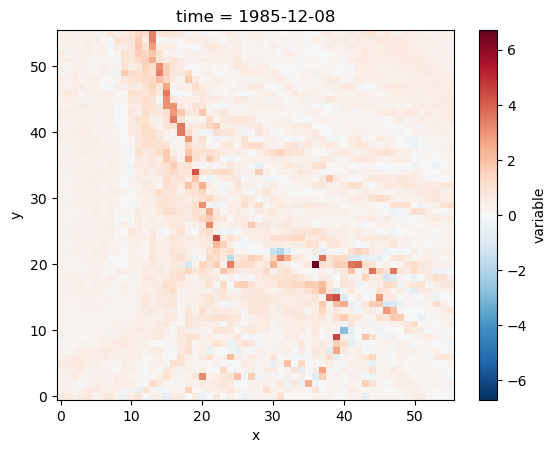

In [142]:
repv_regrid_xr['variable'].isel(time=0).plot()

In [155]:
new_repv_xr=mpcalc.smooth_gaussian(repv_regrid_xr['variable'],5)

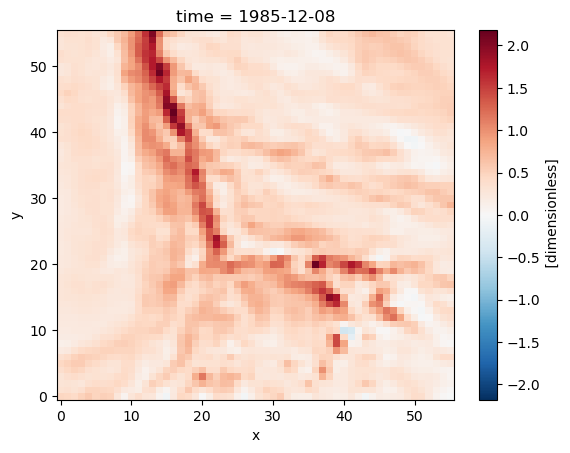

In [156]:
new_repv_xr.isel(time=0).plot()

In [ ]:
# for num, (i_lon, j_lat)  in enumerate(zip(best_lon, best_lat)):
#     print(f"Original lat and lon: {i_lon, j_lat}")
    
#     if np.shape(indices_coords(diff_xr['variable'].isel(time=num), i_lon, j_lat))==(2, ):
        
#         i_, j_ = indices_coords(diff_xr['variable'].isel(time=num), i_lon, j_lat)
    
#         temp_grid = diff_xr['variable'].isel(time=num).isel(y = i_, x = j_) # grab the nearest lat lon values in WRF grid
    
#         print(f"Closest lat and lon: {float(temp_grid.lon.values), float(temp_grid.lat.values)}")

        
#         AR_grid_fcst=fcst['variable'][mask_best].isel(time=num).isel(y=slice(j_ - 28, j_ + 28), 
#                            x=slice(i_ - 28, i_ + 28))
        
#         AR_grid_obs=obs['variable'][mask_best].isel(time=num).isel(y=slice(j_ - 28, j_ + 28), 
#                            x=slice(i_ - 28, i_ + 28))
        
#         if AR_grid_fcst.shape == (56, 56):
            
#             print(num)
#             fcst_sub.append(AR_grid_fcst.values)
#             obs_sub.append(AR_grid_obs.values)
#             newlonlist.append(AR_grid_fcst['lon'].values)
#             newlatlist.append(AR_grid_fcst['lat'].values)
#             AR_grid_fcst.plot.pcolormesh()
#             plt.show()
#             AR_grid_obs.plot.pcolormesh()
#             plt.show()

In [ ]:
pv_nonsmooth['lon']

In [ ]:
pv_mask_ns=nonsmooth_pv['time'].isin(diff_stack['time'])

In [ ]:
nonsmooth_pv['variable'][pv_mask_ns]

In [107]:
slp_final['variable']

<xarray.DataArray 'variable' (time: 849, y: 56, x: 56)>
[2662464 values with dtype=float64]
Coordinates:
    lon      (y) float64 ...
    lat      (x) float64 ...
  * time     (time) datetime64[ns] 1985-12-08 1985-12-10 ... 2017-03-31
Dimensions without coordinates: y, x

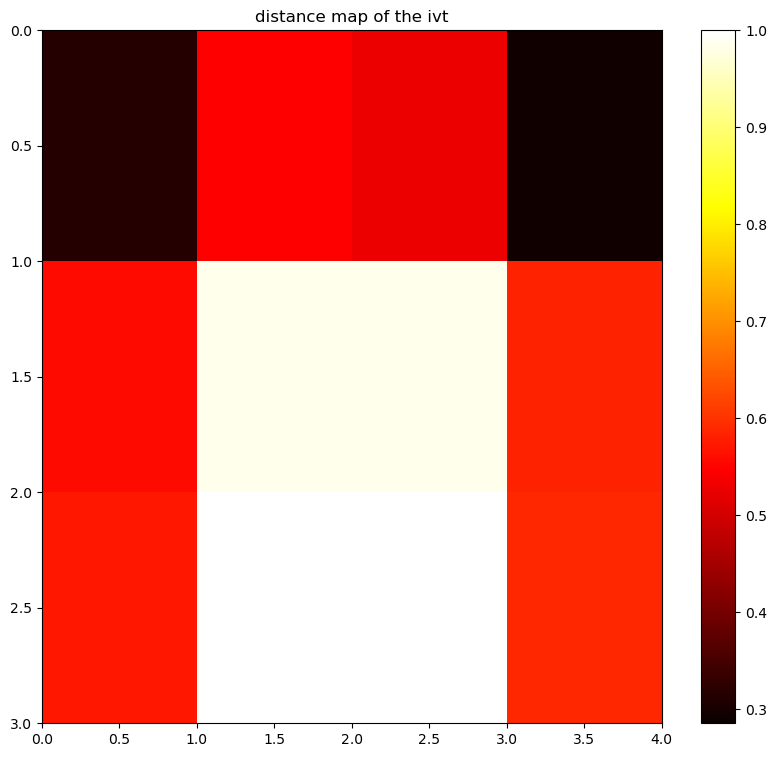

849
[0 1 2 3 3 2 3 1 3 1 2 1 3 3 3 2 3 0 0 1 3 3 0 1 0 3 3 2 1 3 3 2 3 2 3 3 1
 0 1 0 3 0 3 3 0 2 1 2 2 3 3 2 1 0 2 1 3 3 3 1 0 3 1 2 3 0 0 1 0 2 1 0 0 0
 0 1 3 3 2 0 3 2 3 2 2 2 1 0 3 0 2 3 0 0 0 0 0 0 1 2 1 1 1 1 3 0 1 1 2 3 0
 2 0 3 1 3 0 0 2 1 1 3 2 2 0 0 3 0 1 1 3 2 3 0 0 0 0 0 2 1 0 2 3 0 0 0 3 3
 1 2 3 0 3 2 2 3 0 1 0 0 0 0 1 1 1 2 0 0 2 0 0 1 0 1 0 0 0 1 1 3 0 2 0 3 3
 1 0 2 0 2 1 3 0 0 2 2 3 3 0 0 0 3 0 0 0 1 2 2 1 0 3 2 3 2 1 1 0 2 3 1 2 1
 2 0 2 2 0 0 3 0 3 2 2 2 1 3 0 3 1 2 0 0 3 1 0 2 3 3 3 3 1 0 0 0 0 0 0 1 0
 0 2 1 0 2 3 3 2 0 0 0 2 1 1 2 0 2 1 1 2 3 0 0 3 0 1 0 2 1 3 3 1 2 3 0 0 0
 2 0 2 1 1 1 3 0 3 0 3 1 1 1 0 3 3 3 3 3 3 2 0 2 3 3 3 3 3 3 2 1 1 0 2 3 2
 0 0 1 3 0 1 2 2 3 3 3 0 1 0 2 1 2 3 0 1 2 2 1 3 3 0 1 3 3 3 3 3 2 3 2 3 1
 1 1 0 0 2 0 0 2 1 3 1 0 1 2 3 1 2 0 0 2 1 0 1 0 2 1 1 1 1 3 2 2 3 0 3 2 2
 3 2 1 1 2 0 1 3 0 2 3 2 3 3 3 2 2 0 1 3 3 2 1 1 2 2 0 1 1 3 0 2 0 0 1 3 3
 2 3 0 0 3 3 1 2 0 1 0 0 3 0 3 0 3 0 0 2 3 0 0 1 3 0 1 2 3 1 1 0 3 1 0 0 2
 2 1 3 0 0 3 3 1 1 0 

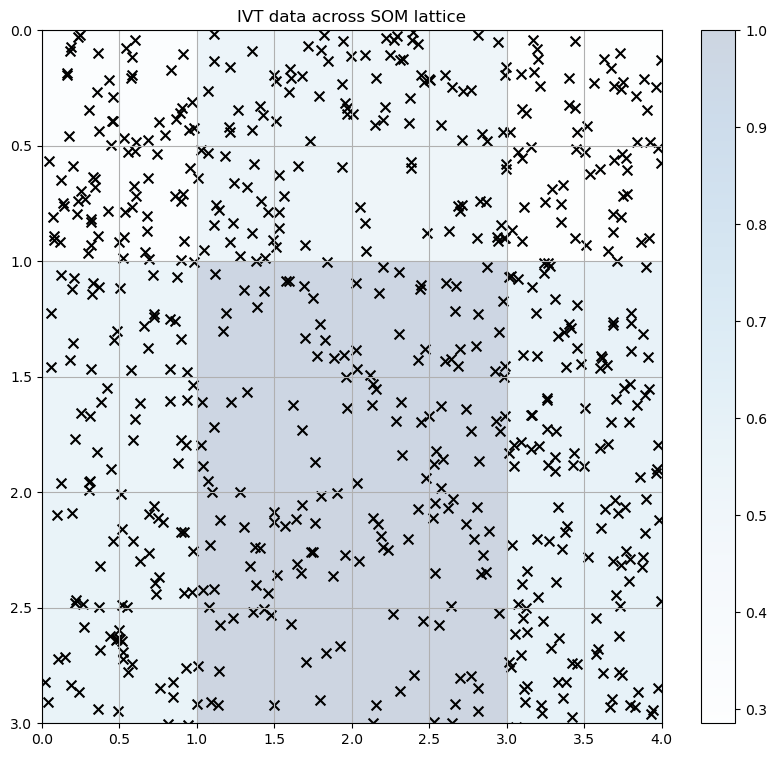

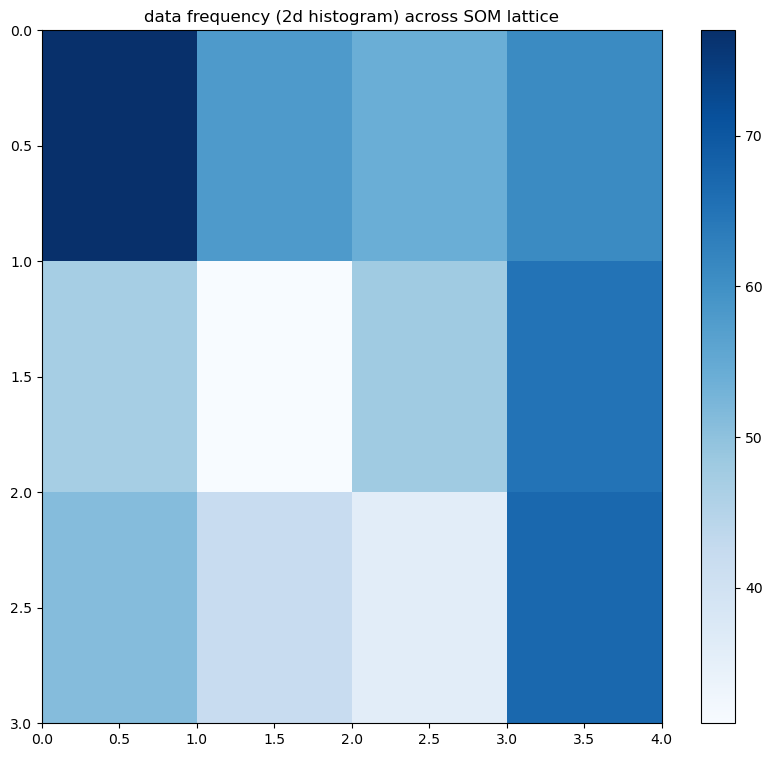

The rows and columns of the SOM lattice to use to grab SOM indexes:
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
Number of composite maps: 16


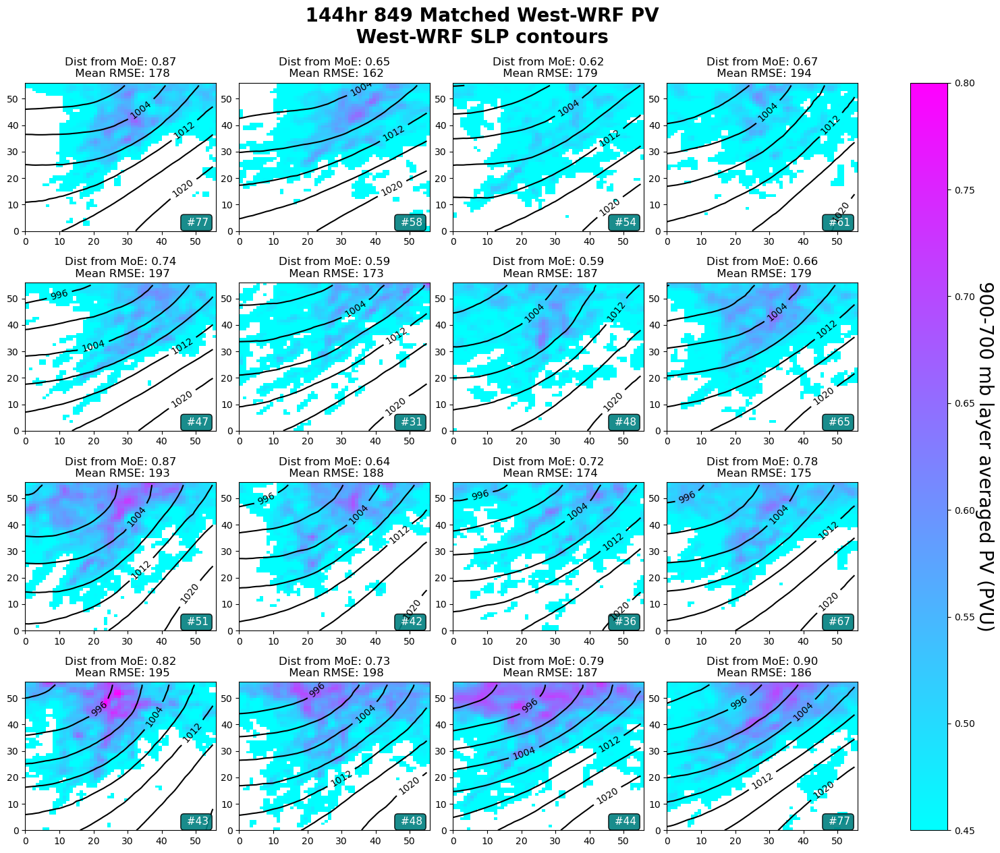

In [159]:
##unsmoothed pv plot
# if som==newsom:
# nonsmooth_pv=xr.open_dataset('repv_matched_0318.nc')  
# pv_new=mpcalc.smooth_gaussian(nonsmooth_pv['variable'],0.25)
        
plt.figure(figsize=(10, 9))
cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
plt.title("distance map of the ivt", fontsize=12)
plt.colorbar(cs)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()


# this may take a few minutes if lots of data! currently doing every 20th point so not bad

# grab the x and y coords across the lattice for the winner node for each data point

w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
print(len(w_x))
w_x = np.array(w_x)
w_y = np.array(w_y)
print(w_x)
print(w_y)

# visualize where data falls in lattice (nearest winning neuron/node)

plt.figure(figsize=(10, 9))
plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
plt.colorbar()

for num, c in enumerate(w_x[::1]):     # every 20th data point

    plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                w_x[num] + np.random.rand(1),
                s=50, c='k', marker='x')

plt.title("IVT data across SOM lattice", fontsize=12)
plt.margins(x=0,y=0)
plt.grid()
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()



plt.figure(figsize=(10, 9))
frequencies = newsom.activation_response(normalize_data(diff_stack).values)
plt.pcolormesh(frequencies, cmap='Blues') 
plt.colorbar()
plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()

# grabbing indices from SOM
#all the cases for 2016-2017 500 mb heights are fairly similar 
# create an empty dictionary using the rows and columns of SOM
keys = [i for i in product(range(4),range(4))]
winmap = {key: [] for key in keys}

# grab the indices for the data within the SOM lattice
for i, x in enumerate(normalize_data(diff_stack).values):
    winmap[newsom.winner(x)].append(i)

print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
som_keys = list(winmap.keys())
print(som_keys)
print(f"Number of composite maps: {len(som_keys)}")


##plot som##
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))




# (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
for map_num in range(len(som_keys)):

    diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
    fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    rmse_data=np.mean(dict_rmse[som_keys[map_num]])
    dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    pv_data=new_repv_xr[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#     pv_data=pv_newer['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
    slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    pvplot=np.where(pv_data>.40,pv_data,np.nan)
#         #         pvplot=np.where(pv_data>.40,pv_data,np.nan)

#     x_min, x_max = np.min(w_y[winmap[som_keys[map_num]]]), np.max(w_y[winmap[som_keys[map_num]]])
#     y_min, y_max = np.min(w_x[winmap[som_keys[map_num]]]), np.max(w_x[winmap[som_keys[map_num]]])

#     ivt_era=era5ss_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#     ivt_wwrf=regridwrf_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

    #di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

    projection = ccrs.PlateCarree()
    axs_class = (GeoAxes,
    dict(map_projection=projection))

#             g=[]
#             di_misses_v2={}
#             for m in miss_new['variable'].values:
#                 for key in di_dates:
#                                 #print(key)
#                     if m in di_dates[key]:

#                         if key not in di_misses_v2.keys():
#                                     di_misses_v2.update({key:m})
#                         else:
#                                 di_misses_v2[key] = di_misses_v2[key],m

#                         g.append(key)
#             e=[]
#             fa_dict={}
#             for f in fa_new['variable'].values:
#                 for key in di_dates:
#                     if f in di_dates[key]:
#                             if key not in fa_dict.keys():
#                                     fa_dict.update({key:f})
#                             else:
#                                     fa_dict[key] = fa_dict[key],f

#                             e.append(key)


#             new_dict=Counter(g)
#             new_dict_fa=Counter(e)





#             label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
#     label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_wwrf,vmin=200, vmax=800,cmap='viridis')
    label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')


    n=(frequencies.flatten()[map_num])
#         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors="white") 

    #diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#     fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#     obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
    
#     htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black',levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]) #cmap="Blues", 
    slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp,levels=[980,984,988,992,996,1000,1004,1008,1012,1016,1020], colors='black')
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f"Dist from MoE: {dist_data.values:.2f}\n Mean RMSE: {rmse_data:.3g}", fontsize=12)
    plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')
#     plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')



#                    
#     plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#     plt.clabel(obsctr,fmt='%1.0f',colors='green')
#         # plot the figure containing all plots



    font = {
            'color':  'white',
            'weight': 'normal',
            'size': 11,
            }

    props = dict(boxstyle='round', facecolor='teal', alpha=.9)           
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
#     plt.subplots_adjust(left=0.1,
#             bottom=.1, 
#             right=1.5, 
#             top=.9, 
#             wspace=0.8, 
#             hspace=0)


plt.tight_layout()
fig = plt.gcf()
fig.suptitle(" 144hr 849 Matched West-WRF PV \n West-WRF SLP contours ".format(sigma=newsom._sigma,lr =newsom._learning_rate), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#Sigma:{sigma:.2f},LR:{lr:.4f}
#ax1=fig.colorbar(label, ax=fig.get_axes())
cbar=fig.colorbar(label, ax=fig.get_axes())
cbar.ax.set_ylabel('900-700 mb layer averaged PV (PVU)', rotation=270, fontsize=20,labelpad=20
      )
plt.savefig('144hr_pv_slp_march212024.png',bbox_inches='tight',pad_inches = 0)

plt.show()


In [ ]:

# if som==newsom:
    
        
plt.figure(figsize=(10, 9))
cs = plt.pcolormesh(newsom.distance_map(), cmap='hot')
plt.title("distance map of the ivt", fontsize=12)
plt.colorbar(cs)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()


# this may take a few minutes if lots of data! currently doing every 20th point so not bad

# grab the x and y coords across the lattice for the winner node for each data point

w_x, w_y = zip(*[newsom.winner(w) for w in normalize_data(diff_stack).values])
print(len(w_x))
w_x = np.array(w_x)
w_y = np.array(w_y)
print(w_x)
print(w_y)

# visualize where data falls in lattice (nearest winning neuron/node)

plt.figure(figsize=(10, 9))
plt.pcolormesh(newsom.distance_map(), cmap='Blues', alpha=.2)
plt.colorbar()

for num, c in enumerate(w_x[::1]):     # every 20th data point

    plt.scatter(w_y[num] + np.random.rand(1),   # add a random decimal to prevent overlapping of markers
                w_x[num] + np.random.rand(1),
                s=50, c='k', marker='x')

plt.title("IVT data across SOM lattice", fontsize=12)
plt.margins(x=0,y=0)
plt.grid()
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()



plt.figure(figsize=(10, 9))
frequencies = newsom.activation_response(normalize_data(diff_stack).values)
plt.pcolormesh(frequencies, cmap='Blues') 
plt.colorbar()
plt.title("data frequency (2d histogram) across SOM lattice", fontsize=12)
plt.ylim(3, 0)  # flip the y axis to be the same as composite map axes later
plt.show()

# grabbing indices from SOM
#all the cases for 2016-2017 500 mb heights are fairly similar 
# create an empty dictionary using the rows and columns of SOM
keys = [i for i in product(range(4),range(4))]
winmap = {key: [] for key in keys}

# grab the indices for the data within the SOM lattice
for i, x in enumerate(normalize_data(diff_stack).values):
    winmap[newsom.winner(x)].append(i)

print(f"The rows and columns of the SOM lattice to use to grab SOM indexes:\n{[i for i in list(winmap.keys())]}")
som_keys = list(winmap.keys())
print(som_keys)
print(f"Number of composite maps: {len(som_keys)}")


##plot som##
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))




# (1) loop through the SOM neurons, (2) grab data samples using SOM indices, (3) compute the mean for each SOM neuron, plot each 
for map_num in range(len(som_keys)):

    diff_data = diff_stack[np.array(winmap[som_keys[map_num]])].unstack().mean(dim="time",skipna=True)#.values
    fcst_data=smooth_fcst['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    obs_data=smooth_obs['__xarray_dataarray_variable__'][np.array(winmap[som_keys[map_num]])].sum(dim="time",skipna=True)
    rmse_data=np.mean(dict_rmse[som_keys[map_num]])
    dist_data=dist_new['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    pv_data=pv_new[np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
#     pv_data=pv_newer['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
        #         #diff_data=diff_fcsts[np.array(winmap[som_keys[map_num]])].unstack().sum(dim="time",skipna=True)
    slp=slp_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ht500=ht_final['variable'][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    pvplot=np.where(pv_data>.40,pv_data,np.nan)
#         #         pvplot=np.where(pv_data>.40,pv_data,np.nan)

#     x_min, x_max = np.min(w_y[winmap[som_keys[map_num]]]), np.max(w_y[winmap[som_keys[map_num]]])
#     y_min, y_max = np.min(w_x[winmap[som_keys[map_num]]]), np.max(w_x[winmap[som_keys[map_num]]])

    ivt_era=era5ss_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)
    ivt_wwrf=regridwrf_match['variable'][pv_mask][np.array(winmap[som_keys[map_num]])].mean(dim="time",skipna=True)

    di_dates[som_keys[map_num][0],som_keys[map_num][1]]=diff_stack['time'][np.array(winmap[som_keys[map_num]])]

    projection = ccrs.PlateCarree()
    axs_class = (GeoAxes,
    dict(map_projection=projection))

#             g=[]
#             di_misses_v2={}
#             for m in miss_new['variable'].values:
#                 for key in di_dates:
#                                 #print(key)
#                     if m in di_dates[key]:

#                         if key not in di_misses_v2.keys():
#                                     di_misses_v2.update({key:m})
#                         else:
#                                 di_misses_v2[key] = di_misses_v2[key],m

#                         g.append(key)
#             e=[]
#             fa_dict={}
#             for f in fa_new['variable'].values:
#                 for key in di_dates:
#                     if f in di_dates[key]:
#                             if key not in fa_dict.keys():
#                                     fa_dict.update({key:f})
#                             else:
#                                     fa_dict[key] = fa_dict[key],f

#                             e.append(key)


#             new_dict=Counter(g)
#             new_dict_fa=Counter(e)





    label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(slp,vmin=995, vmax=1020,cmap='rainbow')#cmap="Blues", 
#     label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(ivt_wwrf,vmin=200, vmax=800,cmap='viridis')
#     label=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].pcolormesh(pvplot,vmin=.45, vmax=.8,cmap='cool')


    n=(frequencies.flatten()[map_num])
#         htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500,colors="white") 

    #diffctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(diff_data,colors="black")  
#     fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(fcst_data,colors="black", levels=[n/8,n/4,n/2])  
#     obsctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(obs_data,colors="green",levels=[n/8,n/4,n/2])#cmap="Blues", 
    
    htctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(ht500, colors='black',levels=[5280,5340,5400,5460,5520,5580,5640,5700,5760,5820,5880,6040]) #cmap="Blues", 
#     slpctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].contour(slp,levels=[980,984,988,992,996,1000,1004,1008,1012,1016,1020], colors='black')
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f"Dist from MoE: {dist_data.values:.2f}\n Mean RMSE: {rmse_data:.3g}", fontsize=12)
#     plt.clabel(slpctr,slpctr.levels[::2],fmt='%1.0f',colors='black')
    plt.clabel(htctr,htctr.levels[::2],fmt='%1.0f',colors='black')



#                    
#     plt.clabel(fcstctr,fmt='%1.0f',colors='black')
#     plt.clabel(obsctr,fmt='%1.0f',colors='green')
#         # plot the figure containing all plots



    font = {
            'color':  'white',
            'weight': 'normal',
            'size': 11,
            }

    props = dict(boxstyle='round', facecolor='teal', alpha=.9)           
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
#     plt.subplots_adjust(left=0.1,
#             bottom=.1, 
#             right=1.5, 
#             top=.9, 
#             wspace=0.8, 
#             hspace=0)


plt.tight_layout()
fig = plt.gcf()
fig.suptitle(" 144hr 849 West-WRF SLP Matched \n West-WRF 500 mb ht contours ".format(sigma=newsom._sigma,lr =newsom._learning_rate), fontsize=20,y=1.05, x=0.45, fontweight='bold')
#Sigma:{sigma:.2f},LR:{lr:.4f}
#ax1=fig.colorbar(label, ax=fig.get_axes())
cbar=fig.colorbar(label, ax=fig.get_axes())
cbar.ax.set_ylabel('SLP (mb)', rotation=270, fontsize=20,labelpad=20)
      

plt.show()


In [ ]:
di_dates

In [ ]:
ar_df = pd.read_csv('dates_ar.csv')
#using all unmatched and matched
# ar_df=pd.read_csv('144alldates.csv')

ar_df=ar_df.drop(columns=['time.1'])
ar_df.columns = ['date']
ar_df['date']=pd.to_datetime(ar_df['date'])

df = pd.read_csv("./greta_mjo_data.csv",header=None)
df.columns =['Year', 'Month', 'Day', 'phase','amplitude']
df['dates'] = df['Year'][1:].astype(str) + df['Month'][1:].astype(str) + df['Day'][1:].astype(str)
df['date'] = df.loc[1:, 'dates'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d')) 

#columns did not have names, so assigning them now

 

In [ ]:
ar_df['date'][np.array(winmap[som_keys[map_num]])]

In [ ]:
ar_df['date'][np.array(winmap[som_keys[map_num]])]-pd.Timedelta(days=6)

In [ ]:
for map_num in range(len(som_keys)):

            database = pd.merge(df, ar_df['date'][np.array(winmap[som_keys[map_num]])]-pd.Timedelta(days=6), on='date', how="inner")
            print(len(database))
            print(database)
            #count = #database['phase'].value_counts()
            count=Counter(database['phase'])
            #print(count)
            phases = ['1','2','3','4','5','6','7','8']
            counts = [count['1'],count['2'],count['3'],count['4'],count['5'],count['6'],count['7'],count['8']]

            percentages = []
            for i in range(len(counts)):
                percentages.append(counts[i]/sum(counts) * 100)
                print('%.2f' % percentages[i])
                
#             fcstctr=geo_axs[som_keys[map_num][0],som_keys[map_num][1]].bar()  

            plt.bar(phases,counts)
            plt.xlabel('MJO Phase')
            plt.ylabel('Number of Missed AR Events')
            plt.title('All Nodes')
            plt.show()

In [ ]:
df_new=df[:-900]

In [ ]:
df_new['Month']=df_new['Month'].apply(lambda x: '0' + x if len(x) == 1 else x)

In [ ]:
df_new[df_new['phase']==str(8)]

In [ ]:
import matplotlib.pyplot as plt

database = pd.merge(df_new, ar_df['date'], on='date', how="inner")
mjo_data = pd.to_numeric(database['phase'])

# Adjust the number of bins to match the desired x-axis labels
bins = np.arange(0.5, 9.5)  # Adjusted to center the bins on x-tick marks

mjo_counts, _, _ = plt.hist(mjo_data, bins=bins, density=True,
                            edgecolor='black', rwidth=0.5)

print("Histogram Counts:")
print(counts)

#plt.hist(mjo_data, bins=bins, density=True, edgecolor='black', rwidth=0.8)  # Adjusted rwidth for better visualization

x_ticks = range(0, 9)  # Adjusted to match the desired x-axis labels
plt.xticks(x_ticks)  # Updated to use plt.xticks instead of plt.set_xticks
  # Updated to use plt.xlabel

# plt.ylim([0, 0.3])
plt.xlim([0, 9])
plt.grid(zorder=0)

plt.tight_layout()
plt.xlabel('MJO phase', ha='center')
plt.ylabel('Number of ARs', va='center', rotation='vertical')
plt.title(
    "144hr 721 (out of 849) Normalized MJO ALL NODES \n Histogram Phases {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma, lr=0.1),
    fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
di_mjo={}
# di_mjo[key] = []
for map_num in range(len(som_keys)):
    database = pd.merge(df_new, ar_df['date'][np.array(winmap[som_keys[map_num]])], on='date', how="inner")
    mjo_data = pd.to_numeric(database['phase'])
    
    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(1, 10)
#     font = {
#                     'color':  'white',
#                     'weight': 'normal',
#                     'size': 11,
#                     }
    
    mjo_hist = geo_axs[som_keys[map_num][0], som_keys[map_num][1]].hist(mjo_data, bins=bins, density=True, color='red', edgecolor='black',rwidth=0.5)
    di_mjo[som_keys[map_num][0], som_keys[map_num][1]]=mjo_data
    
#     for i in range(len(mjo_hist[0])):
#         height = mjo_hist[0][i]
#         x = mjo_hist[1][i] + (mjo_hist[1][i + 1] - mjo_hist[1][i]) / 2
#         y = height + 0.5  # Adjust the y-offset for label placement
#         geo_axs[som_keys[map_num][0], som_keys[map_num][1]].text(x, y, f'{height}', ha='center', va='bottom')
       
    # Use the bin centers as x-ticks
    x_ticks = bins
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticks(x_ticks+0.5)
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticklabels(range(1, 10)) 

#     geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylabel('Number of ARs w/ MJO phase')
#     geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlabel('MJO Phase')
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylim([0, 0.4])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlim([1,9])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].grid(zorder=0)
#     props = dict(boxstyle='round', facecolor='teal', alpha=.9) 
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

    
#     geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
# #             plt.subplots_adjust(left=0.1,
# #                     bottom=.1, 
# #                     right=0.5, 
# #                     top=.9, 
# #                     wspace=0, 
# #                     hspace=0)

#     plt.subplots_adjust(left=0.1,
#             bottom=0.1, 
#             right=0.8, 
#             top=0.5, 
#             wspace=0, 
#             hspace=0)
            
plt.tight_layout()
fig.text(0.5, -.01, 'MJO phase', ha='center',fontsize=20)
fig.text(-.05, 0.5, 'Number of ARs Normalized', va='center', rotation='vertical',fontsize=20)
fig.suptitle("144hr 721 (out of 849) Normalized MJO Histogram Phases {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma, lr=.1),
             fontsize=20, y=1.05, x=0.45, fontweight='bold')





plt.show()

In [ ]:
mjo_hist_dict = []
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))

for map_num in range(len(som_keys)):
    database = pd.merge(df_new, ar_df['date'][np.array(winmap[som_keys[map_num]])], on='date', how="inner")
    mjo_data = pd.to_numeric(database['phase'])
    
    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(0.5, 9.5)  # Adjusted to center the bins on x-tick marks
    
    mjo_hist, bin_edges, _ = geo_axs[som_keys[map_num][0], som_keys[map_num][1]].hist(mjo_data, bins=bins, density=True, color='red', edgecolor='black', label='MJO Hist',rwidth=0.5)

    # Calculate the histogram differences
    differences = mjo_hist - counts
    
    # Plot the histogram differences
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].bar(bin_edges[:-1], differences, width=0.8, align='edge', edgecolor='black',label='Difference btw total AR MJO signal')
    
    # Use the bin centers as x-ticks
    x_ticks = bins[:-1] + 0.5
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticks(x_ticks)
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticklabels(range(1, 9))
    
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylim([-.15, 0.40])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlim([1, 9])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].grid(zorder=0)
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].legend()
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)

    
    
    #mjo_hist_dict[som_keys[map_num][0],som_keys[map_num][1]] = mjo_hist

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Number of ARs', va='center', rotation='vertical', fontsize=20)
fig.suptitle("144hr 721 (out of 849) Normalized MJO Anomaly Histogram Phases {sigma:.2f}, LR:{lr:.4f}".format(sigma=newsom._sigma, lr=0.1),
             fontsize=20, y=1.05, x=0.45, fontweight='bold')

plt.show()


In [ ]:
mjo_hist_dict=[]
fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
for map_num in range(len(som_keys)):
    database = pd.merge(df_new, ar_df['date'][np.array(winmap[som_keys[map_num]])], on='date', how="inner")
    mjo_data = pd.to_numeric(database['phase'])
    
    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(1, 10)
#     font = {
#                     'color':  'white',
#                     'weight': 'normal',
#                     'size': 11,
#                     }
    
    mjo_hist,_,_ = geo_axs[som_keys[map_num][0], som_keys[map_num][1]].hist(mjo_data, bins=bins, density=True, edgecolor='black',rwidth=0.5)
    
#     for i in range(len(mjo_hist[0])):
#         height = mjo_hist[0][i]
#         x = mjo_hist[1][i] + (mjo_hist[1][i + 1] - mjo_hist[1][i]) / 2
#         y = height + 0.5  # Adjust the y-offset for label placement
#         geo_axs[som_keys[map_num][0], som_keys[map_num][1]].text(x, y, f'{height}', ha='center', va='bottom')
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].hist(mjo_hist-counts,bins=bins,density=True, edgecolor='black',rwidth=0.5,color='red')
    # Use the bin centers as x-ticks
    x_ticks = bins
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticks(x_ticks+0.5)
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticklabels(range(1, 10)) 

#     geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylabel('Number of ARs w/ MJO phase')
#     geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlabel('MJO Phase')
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylim([0, 0.4])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlim([1,9])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].grid(zorder=0)
    #mjo_hist_dict[som_keys[map_num][0],som_keys[map_num][1]]=mjo_hist
#     props = dict(boxstyle='round', facecolor='teal', alpha=.9) 
    
#     geo_axs[som_keys[map_num][0],som_keys[map_num][1]].text(46.5,2,f" #{int(frequencies.flatten()[map_num])}",bbox=props,fontdict=font)
# #             plt.subplots_adjust(left=0.1,
# #                     bottom=.1, 
# #                     right=0.5, 
# #                     top=.9, 
# #                     wspace=0, 
# #                     hspace=0)

#     plt.subplots_adjust(left=0.1,
#             bottom=0.1, 
#             right=0.8, 
#             top=0.5, 
#             wspace=0, 
#             hspace=0)
            
plt.tight_layout()
fig.text(0.5, -.01, 'MJO phase', ha='center',fontsize=20)
fig.text(-.01, 0.5, 'Number of ARs', va='center', rotation='vertical',fontsize=20)
fig.suptitle("144hr 721 (out of 849) Normalized MJO Anomaly Histogram Phases {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma, lr=.1),
             fontsize=20, y=1.05, x=0.45, fontweight='bold')





plt.show()

In [ ]:
di_dates

# PNA

In [ ]:
pna=pd.read_csv('norm.daily.nao.cdas.z500.19500101_current.csv')

In [ ]:
pna

In [ ]:
pna['day']

In [ ]:
pna['day']=pna['day'].apply(lambda x: '0' + str(x) if x < 10 else str(x))

In [ ]:
pna['month']=pna['month'].apply(lambda x: '0' + str(x) if x < 10 else str(x))

In [ ]:
pna

In [ ]:
pna['date'] = pna['year'][1:].astype(str) + pna['month'][1:].astype(str) + pna['day'][1:].astype(str)
#pna['date'] = df.loc[1:, 'dates'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d')) 
#pna['date'][0:4]+'-'+pna['date'][4:6]+'-'+pna['date'][6:8]

In [ ]:
pna['date']=pna['date'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

In [ ]:
pna

In [ ]:
 pd.merge(pna['date'], ar_df['date'][np.array(winmap[som_keys[map_num]])])

In [ ]:


database = pd.merge(pna, ar_df['date'],on='date',how='inner')
pna_data = pd.to_numeric(database['nao_index_cdas'])

# Adjust the number of bins to match the desired x-axis labels
bins = np.arange(-1, 2)  # Adjusted to center the bins on x-tick marks

pna_counts, _, _ = plt.hist(pna_data, bins=bins, density=True,
                            edgecolor='black', rwidth=0.5)

print("Histogram Counts:")
print(counts)


#plt.hist(mjo_data, bins=bins, density=True, edgecolor='black', rwidth=0.8)  # Adjusted rwidth for better visualization

x_ticks = range(-2, 2)  # Adjusted to match the desired x-axis labels
plt.xticks(x_ticks)  # Updated to use plt.xticks instead of plt.set_xticks
  # Updated to use plt.xlabel

# plt.ylim([0, 0.3])
plt.xlim([-2, 2])
plt.grid(zorder=0)

plt.tight_layout()
plt.xlabel('PNA phase (+ or -)', ha='center')
plt.ylabel('Number of ARs', va='center', rotation='vertical')
plt.title(
    "144hr 849 Normalized PNA ALL NODES Histogram Phases".format(sigma=newsom._sigma, lr=0.1),
    fontweight='bold'
)

plt.show()


In [ ]:


# Adjust the number of bins to match the desired x-axis labels
bins = np.arange(-1.5, 1.6)  # Adjusted to center the bins on x-tick marks

# Create a histogram
pna_counts, _, _ = plt.hist(pna_data, bins=bins, density=True,
                            edgecolor='black', rwidth=0.5)

# Set x-axis ticks and labels
x_ticks = range(-1, 2)
plt.xticks(x_ticks)

# Set axis labels and title
plt.xlabel('PNA Phase (+ or -)')
plt.ylabel('Density')
plt.title('PNA Phase Histogram')

# Add gridlines
plt.grid()

plt.tight_layout()
plt.show()


In [ ]:

fig, geo_axs = plt.subplots(4, 4, figsize=(16,12))
di_pna={}
# di_pna[key] = []
for map_num in range(len(som_keys)):
    database = pd.merge(pna, ar_df['date'][np.array(winmap[som_keys[map_num]])], on='date', how="inner")
    pna_data = pd.to_numeric(database['nao_index_cdas'])
# Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6)  # Adjusted to center the bins on x-tick marks

    # Create a histogram
#     pna_counts, _, _ = plt.hist(pna_data, bins=bins, density=True,
#                                 edgecolor='black', rwidth=0.5)
    
    pna_hist = geo_axs[som_keys[map_num][0], som_keys[map_num][1]].hist(pna_data, bins=bins, density=True, color='red', edgecolor='black',rwidth=0.5)
    di_pna[som_keys[map_num][0], som_keys[map_num][1]]=pna_data

    # Set x-axis ticks and labels
    x_ticks = [-1, 0, 1]  # Set the desired x-axis ticks
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xticks(x_ticks)
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylim([0, 0.7])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlim([-2,2])
    geo_axs[som_keys[map_num][0], som_keys[map_num][1]].grid(zorder=0)
#     props = dict(boxstyle='round', facecolor='teal', alpha=.9) 
    geo_axs[som_keys[map_num][0],som_keys[map_num][1]].set_title(f" # of cases: {int(frequencies.flatten()[map_num])}", fontsize=12)


    # Set axis labels and title
plt.tight_layout()
fig.text(0.5, -.01, 'PNA phase', ha='center',fontsize=20)
fig.text(-.05, 0.5, 'Frequency of ARs Normalized', va='center', rotation='vertical',fontsize=20)
fig.suptitle(" 144hr 849 Normalized PNA Histogram Phases".format(sigma=newsom._sigma, lr=.1),
             fontsize=20, y=1.05, x=0.45, fontweight='bold')

plt.tight_layout()
plt.show()


In [ ]:
di_pna

In [ ]:
di_four_pna = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_four_pna[0,0]['(0, 0)'].extend(di_pna[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_four_pna[0,0]['(0, 1)'].extend(di_pna[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_four_pna[0,0]['(1, 0)'].extend(di_pna[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_four_pna[0,0]['(1, 1)'].extend(di_pna[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_four_pna[0,1]['(0,2)'].extend(di_pna[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_four_pna[0,1]['(1,2)'].extend(di_pna[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_four_pna[0,1]['(0,3)'].extend(di_pna[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_four_pna[0,1]['(1,3)'].extend(di_pna[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_four_pna[1,0]['(2,0)'].extend(di_pna[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_four_pna[1,0]['(2,1)'].extend(di_pna[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_four_pna[1,0]['(3,0)'].extend(di_pna[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_four_pna[1,0]['(3,1)'].extend(di_pna[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_four_pna[1,1]['(2,2)'].extend(di_pna[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_four_pna[1,1]['(2,3)'].extend(di_pna[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_four_pna[1,1]['(3,2)'].extend(di_pna[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_four_pna[1,1]['(3,3)'].extend(di_pna[3,3])
        
        


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
pna_counts_dict = {}
pna_hist_dict = {}  # Add this dictionary to store histogram data

label_list = ['Too Fast', 'Too Weak', 'Too Strong', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(di_four_pna.keys(), geo_axs.flatten())):
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']
    bin_centers = 0.5 * np.diff(bins) + bins[:-1]
#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=15, fontweight='bold', color='black')

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels)
    ax.tick_params(axis='y', labelcolor='red')

    ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=20, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
keys_to_plot = [(0, 0), (1, 1)] 

label_list = ['Too Fast', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']

#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=25, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers,  np.round(normalized_hist-pna_counts,2)*100):
        ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 0), ha='center', fontsize=20, fontweight='bold', color='black')


   
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels, fontsize=25)
    ax.tick_params(axis='y', labelcolor='red')

#     ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=30)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Matched Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
for map_num, (i, ax) in enumerate(zip(keys_to_plot, geo_axs.flatten())):
    print(map_num,i,ax)

In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']

#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=25, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers,  np.round(normalized_hist-pna_counts,4)*100):
        ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 0), ha='center', fontsize=20, fontweight='bold', color='black')


   
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=25)
    ax.tick_params(axis='y', labelcolor='red')

#     ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=30)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Matched Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(map_num,i,ax)

In [ ]:
geo_axs

In [ ]:
pna_hist_dict

In [ ]:
fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']

#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
#     twin_ax = ax.twinx()
    geo_axs[1,1].bar(bin_centers, pna_hist_dict[1,1]-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
    geo_axs[1,0].bar(bin_centers, pna_hist_dict[1,0]-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
    geo_axs[1,1].grid(zorder=0)
    geo_axs[1,0].grid(zorder=0)
    
    geo_axs[1,1].set_ylim([-0.06,0.04])
    geo_axs[1,0].set_ylim([-0.06,0.04])
    geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
    geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    
#     geo_axs[1,0].set_xticklabels(labels,fontsize=25)
#     geo_axs[1,1].set_xticklabels(labels,fontsize=25)


  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
#     twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
#     twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    # Calculate the percentage difference based on the differences between histograms
#     percentage_difference = ((pna_hist_dict[1, 0] - pna_counts) / pna_counts) * 100


    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 16), ha='center', fontsize=20, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, (pna_hist_dict[1, 0] - pna_counts)):
        
        geo_axs[1, 0].text(x-.2, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, (pna_hist_dict[1, 1] - pna_counts)):
        
        geo_axs[1, 1].text(x-.2, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
#     for x, y in zip(bin_centers, percentage_difference):
#         geo_axs[1, 0].text(x, pna_hist_dict[1, 0][np.where(bin_centers == x)[1][0]], f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
# #     for x, y in zip(bin_centers, percentage_difference):
#         ax.annotate(f"{y:.2f}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -550), ha='center', fontsize=20, fontweight='bold', color='black')




   
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=25)
    ax.tick_params(axis='y', labelcolor='red')

#     ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=30)
fig.text(-0.01, 0.7, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(-0.01, .15, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Matched Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
keys_to_plot = [(0, 0), (1, 1)] 

label_list = ['Too Fast', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']

#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
#     twin_ax = ax.twinx()
    geo_axs[1,1].bar(bin_centers, pna_hist_dict[1,1]-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
    geo_axs[1,0].bar(bin_centers, pna_hist_dict[1,0]-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
    geo_axs[1,1].grid(zorder=0)
    geo_axs[1,0].grid(zorder=0)
    
    geo_axs[1,1].set_ylim([-0.06,0.04])
    geo_axs[1,0].set_ylim([-0.06,0.04])
    geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
    geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    
#     geo_axs[1,0].set_xticklabels(labels,fontsize=25)
#     geo_axs[1,1].set_xticklabels(labels,fontsize=25)


  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
#     twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
#     twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    # Calculate the percentage difference based on the differences between histograms
#     percentage_difference = ((pna_hist_dict[1, 0] - pna_counts) / pna_counts) * 100


    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 16), ha='center', fontsize=20, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, (pna_hist_dict[1, 0] - pna_counts)):
        
        geo_axs[1, 0].text(x-.2, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, (pna_hist_dict[1, 1] - pna_counts)):
        
        geo_axs[1, 1].text(x-.2, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
#     for x, y in zip(bin_centers, percentage_difference):
#         geo_axs[1, 0].text(x, pna_hist_dict[1, 0][np.where(bin_centers == x)[1][0]], f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
# #     for x, y in zip(bin_centers, percentage_difference):
#         ax.annotate(f"{y:.2f}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -550), ha='center', fontsize=20, fontweight='bold', color='black')




   
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=25)
    ax.tick_params(axis='y', labelcolor='red')

#     ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=30)
fig.text(-0.01, 0.7, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(-0.01, .15, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Matched Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
mean_list=[]
values = di_four_pna[0,0].values()

# Calculate the mean of the values for each key
means = {key: sum(values_list) / len(values_list) for key, values_list in di_four_pna[0,0].items()}

# Print the means
for key, mean in means.items():
    print(f'Mean of {key}: {mean}')
    mean_list.append(mean)
mean_list=np.asarray(mean_list)
print(np.nanmean(mean_list))

In [ ]:
mean_list=[]
for key, values_list in di_four_pna[0,0].items():
    # Remove NaN values and calculate the mean for each key
    valid_values = [value for value in values_list if not np.isnan(value)]
    if valid_values:
        mean = np.mean(valid_values)
        mean_list.append(mean)
        print(f'Mean of {key}: {mean}')
    else:
        print(f'No valid values for {key}')

mean_list = np.asarray(mean_list)
overall_mean = np.nanmean(mean_list)

In [ ]:
overall_mean

In [ ]:
mean_list=[]
values = di_four_pna[0,1].values()

# Calculate the mean of the values for each key
means = {key: sum(values_list) / len(values_list) for key, values_list in di_four_pna[0,1].items()}

# Print the means
for key, mean in means.items():
    print(f'Mean of {key}: {mean}')
    mean_list.append(mean)
mean_list=np.asarray(mean_list)
print(np.mean(mean_list))

In [ ]:
mean_list=[]
values = di_four_pna[1,0].values()

# Calculate the mean of the values for each key
means = {key: sum(values_list) / len(values_list) for key, values_list in di_four_pna[1,0].items()}

# Print the means
for key, mean in means.items():
    print(f'Mean of {key}: {mean}')
    mean_list.append(mean)
mean_list=np.asarray(mean_list)
print(np.mean(mean_list))

In [ ]:
mean_list=[]
values = di_four_pna[1,1].values()

# Calculate the mean of the values for each key
means = {key: sum(values_list) / len(values_list) for key, values_list in di_four_pna[1,1].items()}

# Print the means
for key, mean in means.items():
    print(f'Mean of {key}: {mean}')
    mean_list.append(mean)
mean_list=np.asarray(mean_list)
print(np.nanmean(mean_list))

# All dates PNA


In [ ]:
database = pd.merge(pna, newest_df,on='date',how='inner')
pna_data = pd.to_numeric(database['nao_index_cdas'])

# Adjust the number of bins to match the desired x-axis labels
bins = np.arange(-1, 2)  # Adjusted to center the bins on x-tick marks

pna_counts, _, _ = plt.hist(pna_data, bins=bins, density=True,
                            edgecolor='black', rwidth=0.5)

print("Histogram Counts:")
print(counts)


#plt.hist(mjo_data, bins=bins, density=True, edgecolor='black', rwidth=0.8)  # Adjusted rwidth for better visualization

x_ticks = range(-2, 2)  # Adjusted to match the desired x-axis labels
plt.xticks(x_ticks)  # Updated to use plt.xticks instead of plt.set_xticks
  # Updated to use plt.xlabel

# plt.ylim([0, 0.3])
plt.xlim([-2, 2])
plt.grid(zorder=0)

plt.tight_layout()
plt.xlabel('PNA phase (+ or -)', ha='center')
plt.ylabel('Number of ARs', va='center', rotation='vertical')
plt.title(
    "144hr 849 Normalized PNA ALL NODES Histogram Phases".format(sigma=newsom._sigma, lr=0.1),
    fontweight='bold'
)

plt.show()


In [ ]:

# Adjust the number of bins to match the desired x-axis labels
bins = np.arange(-1.5, 1.6)  # Adjusted to center the bins on x-tick marks

# Create a histogram
pna_counts_umm, _, _ = plt.hist(pna_data, bins=bins, density=True,
                            edgecolor='black', rwidth=0.5)

# Set x-axis ticks and labels
x_ticks = range(-1, 2)
plt.xticks(x_ticks)

# Set axis labels and title
plt.xlabel('PNA Phase (+ or -)')
plt.ylabel('Density')
plt.title('PNA Phase Histogram')

# Add gridlines
plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
di_four_pna = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_four_pna[0,0]['(0, 0)'].extend(di_pna[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_four_pna[0,0]['(0, 1)'].extend(di_pna[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_four_pna[0,0]['(1, 0)'].extend(di_pna[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_four_pna[0,0]['(1, 1)'].extend(di_pna[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_four_pna[0,1]['(0,2)'].extend(di_pna[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_four_pna[0,1]['(1,2)'].extend(di_pna[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_four_pna[0,1]['(0,3)'].extend(di_pna[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_four_pna[0,1]['(1,3)'].extend(di_pna[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_four_pna[1,0]['(2,0)'].extend(di_pna[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_four_pna[1,0]['(2,1)'].extend(di_pna[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_four_pna[1,0]['(3,0)'].extend(di_pna[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_four_pna[1,0]['(3,1)'].extend(di_pna[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_four_pna[1,1]['(2,2)'].extend(di_pna[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_four_pna[1,1]['(2,3)'].extend(di_pna[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_four_pna[1,1]['(3,2)'].extend(di_pna[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_four_pna[1,1]['(3,3)'].extend(di_pna[3,3])
        
        


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
pna_counts_dict = {}
pna_hist_dict = {}  # Add this dictionary to store histogram data

label_list = ['Too Fast', 'Too Weak', 'Too Strong', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(di_four_pna.keys(), geo_axs.flatten())):
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']
    bin_centers = 0.5 * np.diff(bins) + bins[:-1]
#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-pna_counts_umm, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=15, fontweight='bold', color='black')

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels)
    ax.tick_params(axis='y', labelcolor='red')

    ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=20, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']

#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-pna_counts_umm, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=20, fontweight='bold', color='black')
        
    # Add annotations for raw counts
    for x, y in zip(bin_centers,  np.round(normalized_hist-pna_counts_umm,2)*100):
        ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 0), ha='center', fontsize=20, fontweight='bold', color='black')


   
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=25)
    ax.tick_params(axis='y', labelcolor='red')

#     ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=30)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
keys_to_plot = [(0, 0), (1, 1)] 

label_list = ['Too Fast', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    
    key_i_values = di_four_pna[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = np.arange(-1.5, 1.6) 
    labels = ['Negative', 'Neutral', 'Positive']

#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    pna_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    pna_counts_dict[i] = pna_counts_total

    pna_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = pna_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    pna_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-pna_counts_umm, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

  
    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, pna_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=25, fontweight='bold', color='black')

    for x, y in zip(bin_centers,  np.round(normalized_hist-pna_counts_umm,2)*100):
        ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 0), ha='center', fontsize=20, fontweight='bold', color='black')

   
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=25)
    ax.tick_params(axis='y', labelcolor='red')

#     ax.legend()
    
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'PNA phase', ha='center', fontsize=30)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized PNA Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


# ENSO matched

In [ ]:
oni=pd.read_csv('oni_data.txt')
oni=oni.rename(columns={"DJF": "12-01-02", "JFM": "01-02-03", "FMA": "02-03-04","MAM": "03-04-05","AMJ": "04-05-06",
                   "MJJ": "05-06-07","JJA": "06-07-08","JAS": "07-08-09","ASO": "08-09-10","SON":"09-10-11",
                    "OND":"10-11-12","NDJ": "11-12-01"})
oni_new=oni.rename(columns={"12-01-02":'12',"01-02-03": "01", "02-03-04": "02", "03-04-05" : "03", "04-05-06":"04",
                  "05-06-07": "05","06-07-08":"06", "07-08-09": "07","08-09-10":"08","09-10-11":"09",
                  "10-11-12":"10","11-12-01":"11"})

In [ ]:
oni_newest = []
di_oni = {}

for key in di_dates:
    di_oni[key] = []  # Initialize an empty list for each key in di_oni

    for i, m in enumerate(oni_new.columns):
        # Iterate through di_dates keys
        for j, year in enumerate(oni_new['Year']):
            if str(m[:2]) in [str(value)[5:7] for value in di_dates[key].values] and str(year) in [str(value)[:4] for value in di_dates[key].values]:
                di_oni[key].append(oni_new.iloc[j, i])  # Fix indexing

    # Truncate or pad di_oni[key] to match the length of di_dates[key]
    desired_length = len(di_dates[key])
    di_oni[key] = di_oni[key][:desired_length] + [None] * (desired_length - len(di_oni[key]))

    oni_newest.extend([key] * desired_length)  # Append key to oni_newest

print("Updated oni Dictionary:")
print(di_oni)

In [ ]:
oni_new.loc[67]

In [ ]:
oni_new

# right full total counts enso

In [ ]:

import matplotlib.pyplot as plt
import numpy as np

# Sample data (replace this with your actual data)
all_values = [value for values_list in di_oni.values() for value in values_list]

# Adjust the number of bins to match the desired x-axis labels
bins = [-2.5, -0.5, 0.5, 2.5]
labels = ['La Nina', 'Neutral', 'El Nino']

# Calculate the positions of the labels
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
label_positions = bin_centers 

# Place the labels at the calculated positions
plt.xticks(label_positions, labels)

# Create the histogram without density=True
enso_counts,_= np.histogram(all_values, bins=bins)

# Calculate the total count
total_count = np.sum(enso_counts) #* np.diff(bins)

# Normalize the total counts and create the histogram
norm_total_counts = enso_counts / total_count

# Plot the normalized total counts
plt.bar(bin_centers, norm_total_counts, width=np.diff(bins), align='center', edgecolor='black')
area_under_histogram = np.sum(norm_total_counts * np.diff(bins))
print("Area under the histogram:", area_under_histogram)

# Set labels and title
plt.xlabel('Values')
plt.ylabel('Normalized Frequency')
plt.title('Normalized Histogram of All Oni Values')

# Display the histogram
plt.show()


In [ ]:
all_values

In [ ]:
norm_total_counts

# Di four code

In [ ]:
di_four = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_four[0,0]['(0, 0)'].extend(di_oni[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_four[0,0]['(0, 1)'].extend(di_oni[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_four[0,0]['(1, 0)'].extend(di_oni[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_four[0,0]['(1, 1)'].extend(di_oni[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_four[0,1]['(0,2)'].extend(di_oni[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_four[0,1]['(1,2)'].extend(di_oni[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_four[0,1]['(0,3)'].extend(di_oni[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_four[0,1]['(1,3)'].extend(di_oni[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_four[1,0]['(2,0)'].extend(di_oni[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_four[1,0]['(2,1)'].extend(di_oni[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_four[1,0]['(3,0)'].extend(di_oni[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_four[1,0]['(3,1)'].extend(di_oni[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_four[1,1]['(2,2)'].extend(di_oni[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_four[1,1]['(2,3)'].extend(di_oni[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_four[1,1]['(3,2)'].extend(di_oni[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_four[1,1]['(3,3)'].extend(di_oni[3,3])
        
        


# right full enso code

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
enso_counts_dict = {}
enso_hist_dict = {}  # Add this dictionary to store histogram data

label_list = ['Too Fast', 'Too Weak', 'Too Intense', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(di_four.keys(), geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

#     twin_ax.set_ylim([-.12, 0.10])
    twin_ax.tick_params(axis='y', labelcolor='blue')
    
    ax.set_xlim([min(bin_centers) - 1, max(bin_centers) + 1])
    twin_ax.set_xlim([min(bin_centers) - 1, max(bin_centers) + 1])
    
#     ax.set_yticks(np.linspace(0, 0.4, 4))  # Set desired y-tick values
#     twin_ax.set_yticks(np.arange(-.12, 0.10,.050))  # Set desired y-tick values
    
#     ax.yaxis.set_major_locator(plt.MaxNLocator(5))
#     twin_ax.yaxis.set_major_locator(plt.MaxNLocator(5))

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} Error Pattern'.format(label_list[map_num]))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=15, fontweight='bold', color='black')

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels)
    ax.tick_params(axis='y', labelcolor='red')
    twin_ax.set_ylim([-.06, 0.12])
    ax.set_ylim([0,0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    twin_ax.grid(None)

    
#     ax.set_yticks(np.arange(0, 0.5, 0.1))  # Set desired y-tick values
#     twin_ax.set_yticks(np.arange(-0.05, 0.10, 0.05))  # Set desired y-tick values
    

    ax.legend()
    #yrange=np.linspace(0,0.45,10)
#     ax.set_ylim([0,0.45])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=20, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
# enso_counts_dict = {}
enso_hist_dict = {}  # Add this dictionary to store histogram data
keys_to_plot = [(0, 0), (1, 1)] 
labels_list = [[label_list[0]], [label_list[1]]]

label_list = ['Too Fast', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
#     enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

#     twin_ax.set_ylim([-0.05, 0.20])
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

#     geo_axs[1,1].bar(bin_centers, pna_hist_dict[1,1]-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
#     geo_axs[1,0].bar(bin_centers, pna_hist_dict[1,0]-pna_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
#     geo_axs[1,1].grid(zorder=0)
#     geo_axs[1,0].grid(zorder=0)
    
#     geo_axs[1,1].set_ylim([-0.06,0.04])
#     geo_axs[1,0].set_ylim([-0.06,0.04])
#     geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
#     geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    
    


    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7)

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 14), ha='center', fontsize=15, fontweight='bold', color='black')
    for x, y in zip(bin_centers,  np.round(normalized_hist-norm_total_counts,2)*100):
        ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -3), ha='center', fontsize=15, fontweight='bold', color='black')


    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')
  
    

#     ax.legend()
#     ax.set_ylim([0, 0.45])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Init Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
enso_hist_dict

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
enso_counts_dict = {}
# enso_hist_dict = {}  # Add this dictionary to store histogram data
keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))


    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7)

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=15, fontweight='bold', color='black')
    for x, y in zip(bin_centers,  np.round(normalized_hist-norm_total_counts,2)*100):
        ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -2), ha='center', fontsize=15, fontweight='bold', color='black')


    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

#     ax.legend()

    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
# enso_counts_dict = {}
#enso_hist_dict = {}  # Add this dictionary to store histogram data
keys_to_plot = [(0, 0), (1, 1)] 
labels_list = [[label_list[0]], [label_list[1]]]

label_list = ['Too Fast', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
#     twin_ax = ax.twinx()
#     twin_ax.bar(bin_centers, normalized_hist-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

#     twin_ax.set_ylim([-0.05, 0.20])
#     twin_ax.tick_params(axis='y', labelcolor='blue')
#     twin_ax.set_ylim([-0.06, 0.12])
#     ax.set_ylim([0, 0.45])
#     twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    geo_axs[1,0].bar(bin_centers, enso_hist_dict[0,0]-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
    geo_axs[1,1].bar(bin_centers, enso_hist_dict[1,1]-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
    geo_axs[1,1].grid(zorder=0)
    geo_axs[1,0].grid(zorder=0)
    
    geo_axs[1,1].set_ylim([-0.04,0.06])
    geo_axs[1,0].set_ylim([-0.04,0.06])
    geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
    geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7)

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 14), ha='center', fontsize=15, fontweight='bold', color='black')
    
    for x, y in zip(bin_centers, ((enso_hist_dict[0,0]-norm_total_counts)/(norm_total_counts))*100):
        
        geo_axs[1, 0].text(x-.25, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, ((enso_hist_dict[1,1]-norm_total_counts)/(norm_total_counts))*100):
        
        geo_axs[1, 1].text(x-.25, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
#     for x, y in zip(bin_centers,  np.round(normalized_hist-norm_total_counts,2)*100):
#         ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -3), ha='center', fontsize=15, fontweight='bold', color='black')


    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')
  
    

#     ax.legend()
#     ax.set_ylim([0, 0.45])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.7, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(-0.01, .15, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Init Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
enso_counts_dict

In [ ]:
enso_counts_dict[i]

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
# enso_counts_dict = {}
# enso_hist_dict = {}  # Add this dictionary to store histogram data
keys_to_plot = [(0, 1), (1, 0)] 
labels_list = [[label_list[0]], [label_list[1]]]

label_list = ['Too Weak', 'Too Intense']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
#     enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
#     enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
#     twin_ax = ax.twinx()
#     twin_ax.bar(bin_centers, normalized_hist-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

#     twin_ax.set_ylim([-0.05, 0.20])
#     twin_ax.tick_params(axis='y', labelcolor='blue')
#     twin_ax.set_ylim([-0.06, 0.12])
#     ax.set_ylim([0, 0.45])
#     twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

    geo_axs[1,0].bar(bin_centers, enso_hist_dict[0,1]-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
    geo_axs[1,1].bar(bin_centers, enso_hist_dict[1,0]-norm_total_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
    geo_axs[1,0].grid(zorder=0)
    geo_axs[1,1].grid(zorder=0)
    
    geo_axs[1,0].set_ylim([-0.04,0.06])
    geo_axs[1,1].set_ylim([-0.04,0.06])
    geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
    

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7)

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 14), ha='center', fontsize=15, fontweight='bold', color='black')
    
    for x, y in zip(bin_centers, ((enso_hist_dict[0,1]-norm_total_counts)/(norm_total_counts))*100):
        
        geo_axs[1, 0].text(x-.2, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, ((enso_hist_dict[1,0]-norm_total_counts)/(norm_total_counts))*100):
        
        geo_axs[1, 1].text(x-.2, 0, f"{y:.2f}%", fontsize=20, fontweight='bold', color='black')
        
#     for x, y in zip(bin_centers,  np.round(normalized_hist-norm_total_counts,2)*100):
#         ax.annotate(f"{y}%", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -3), ha='center', fontsize=15, fontweight='bold', color='black')


    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')
  
    

#     ax.legend()
#     ax.set_ylim([0, 0.45])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
# fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
# fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.text(-0.01, 0.7, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(-0.01, .15, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Init Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


# ENSO unmatched and matched

In [ ]:
di_um=pd.read_csv('unmatched_144_1011_newest.csv')

In [ ]:
di_um=di_um.drop(columns=['Unnamed: 0'])

In [ ]:
di_um.columns

In [ ]:
di_new=di_um.to_dict(orient='list')

In [ ]:
import re
date_objects_dict = {}

for key, date_strings in di_new.items():
    # Extract the part inside the array and split it into individual strings
    date_str_list = re.findall(r"'(.*?)'", date_strings[0])

    # Filter out strings that can be converted to datetime objects
    date_objects = []
    for date_str in date_str_list:
        try:
            date_obj = pd.to_datetime(date_str, format='%Y-%m-%dT%H:%M:%S.%f')
            date_objects.append(date_obj)
        except ValueError:
            pass

    date_objects_dict[key] = date_objects

print(date_objects_dict)

In [ ]:


# Create a new dictionary with renamed keys
renamed_dict = {}

for key, value in di_new.items():
    # Extract the coordinates from the string and convert them to a tuple
    coordinates = tuple(map(int, key.strip('()').split(', ')))
    renamed_dict[coordinates] = value

# Print the renamed dictionary
print(renamed_dict)

In [ ]:
di_dates.items()

In [ ]:
renamed_dict={}
for key, value in di_dates.items():
    new_key = f'({key[0]}, {key[1]})'
    renamed_dict[new_key] = value

# Print the renamed dictionary
print(renamed_dict)

In [ ]:
# Initialize the merged_dict as a dictionary of empty arrays
merged_dict = {key: np.array([], dtype='str') for key in set(list(date_objects_dict.keys()) + list(renamed_dict.keys()))}

# Iterate over the renamed_dict
for key, data_array in date_objects_dict.items():
    if key in merged_dict:
        merged_dict[key] = np.concatenate([merged_dict[key], np.array(data_array).astype(str)])

# Iterate over the di_dates
for key, numpy_array in renamed_dict.items():
    if key in merged_dict:
        merged_dict[key] = np.concatenate([merged_dict[key], np.array(numpy_array).astype(str)])


In [ ]:
merged_dict

In [ ]:
merged_dict = {(int(key[1]), int(key[4])): value for key, value in merged_dict.items()}

In [ ]:
# di_oni_m.keys()

In [ ]:
oni_newest_m = []
di_oni_m = {}

for key in merged_dict:
    di_oni_m[key] = []  # Initialize an empty list for each key in di_oni

    for i, m in enumerate(oni_new.columns):
        # Iterate through di_dates keys
        for j, year in enumerate(oni_new['Year']):
            if str(m[:2]) in [str(value)[5:7] for value in merged_dict[key]] and str(year) in [str(value)[:4] for value in merged_dict[key]]:
                di_oni_m[key].append(oni_new.iloc[j, i])  # Fix indexing

    # Truncate or pad di_oni[key] to match the length of di_dates[key]
    desired_length = len(merged_dict[key])
    di_oni_m[key] = di_oni_m[key][:desired_length] + [None] * (desired_length - len(di_oni_m[key]))

    oni_newest_m.extend([key] * desired_length)  # Append key to oni_newest

print("Updated oni Dictionary:")
print(di_oni_m)

In [ ]:
di_oni_m

In [ ]:


# Sample data (replace this with your actual data)
all_values_m = [value for values_list in di_oni_m.values() for value in values_list if value is not None]
# Adjust the number of bins to match the desired x-axis labels
bins = [-2.5, -0.5, 0.5, 2.5]
labels = ['La Nina', 'Neutral', 'El Nino']

# Calculate the positions of the labels
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
label_positions = bin_centers 

# Place the labels at the calculated positions
plt.xticks(label_positions, labels)

# Create the histogram without density=True
enso_counts,_= np.histogram(all_values_m, bins=bins)

# Calculate the total count
total_count = np.sum(enso_counts) #* np.diff(bins)

# Normalize the total counts and create the histogram
norm_total_counts_m = enso_counts / total_count

# Plot the normalized total counts
plt.bar(bin_centers, norm_total_counts_m, width=np.diff(bins), align='center', edgecolor='black')
area_under_histogram = np.sum(norm_total_counts_m * np.diff(bins))
print("Area under the histogram:", area_under_histogram)

# Set labels and title
plt.xlabel('Values')
plt.ylabel('Normalized Frequency')
plt.title('Normalized Histogram of All Oni Values')

# Display the histogram
plt.show()


In [ ]:
norm_total_counts_m

In [ ]:
di_oni_m

In [ ]:
norm_total_counts_m

In [ ]:
norm_total_counts

In [ ]:
di_four = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_four[0,0]['(0, 0)'].extend(di_oni[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_four[0,0]['(0, 1)'].extend(di_oni[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_four[0,0]['(1, 0)'].extend(di_oni[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_four[0,0]['(1, 1)'].extend(di_oni[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_four[0,1]['(0,2)'].extend(di_oni[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_four[0,1]['(1,2)'].extend(di_oni[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_four[0,1]['(0,3)'].extend(di_oni[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_four[0,1]['(1,3)'].extend(di_oni[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_four[1,0]['(2,0)'].extend(di_oni[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_four[1,0]['(2,1)'].extend(di_oni[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_four[1,0]['(3,0)'].extend(di_oni[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_four[1,0]['(3,1)'].extend(di_oni[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_four[1,1]['(2,2)'].extend(di_oni[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_four[1,1]['(2,3)'].extend(di_oni[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_four[1,1]['(3,2)'].extend(di_oni[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_four[1,1]['(3,3)'].extend(di_oni[3,3])
        
        


In [ ]:
norm_total_counts_m

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
enso_counts_dict = {}
enso_hist_dict = {}  # Add this dictionary to store histogram data

label_list = ['Too Fast', 'Too Intense', 'Too Weak', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(di_four.keys(), geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density

    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-norm_total_counts_m, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

    twin_ax.set_ylim([-0.12, 0.10])
    twin_ax.tick_params(axis='y', labelcolor='blue')
    
    ax.set_xlim([min(bin_centers) - 1, max(bin_centers) + 1])
    twin_ax.set_xlim([min(bin_centers) - 1, max(bin_centers) + 1])
    
    ax.set_yticks(np.linspace(0, 0.4, 5))  # Set desired y-tick values for ax
    twin_ax.set_yticks(np.linspace(-0.12, 0.10, 5))  # Set desired y-tick values for twin_ax

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} ENSO Mode'.format(label_list[map_num]))

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=15, fontweight='bold', color='black')
    

    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')

    ax.legend()
    
    ax.set_ylim([0, 0.45])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Normalized Total ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=20, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
enso_counts_dict = {}
enso_hist_dict = {}  # Add this dictionary to store histogram data
keys_to_plot = [(0, 0), (1, 1)] 
labels_list = [[label_list[0]], [label_list[1]]]

label_list = ['Too Fast', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-norm_total_counts_m, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

#     twin_ax.set_ylim([-0.05, 0.20])
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))


    


    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7)

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 12), ha='center', fontsize=15, fontweight='bold', color='black')
    for x, y in zip(bin_centers,  np.round(normalized_hist-norm_total_counts_m,2)*100):
        formatted_label = '{:.1f}%'.format(y) if y != 0 else '0%'
        ax.annotate(f"{formatted_label}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -2), ha='center', fontsize=15, fontweight='bold', color='black')


    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')
  
    

#     ax.legend()
#     ax.set_ylim([0, 0.45])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Total Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(1, 2, figsize=(24, 11))
enso_counts_dict = {}
enso_hist_dict = {}  # Add this dictionary to store histogram data
keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    key_i_values = di_four[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    all_values_for_i = all_values_for_i[all_values_for_i != None]

    # Adjust the number of bins to match the desired x-axis labels
    bins = [-2.5, -0.5, 0.5, 2.5]
    labels = ['La Nina', 'Neutral', 'El Nino']

    bin_centers = 0.5 * np.diff(bins) + bins[:-1]

    # Compute the raw counts for each bin
    enso_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    enso_counts_dict[i] = enso_counts_total

    enso_hist, bin_edges = np.histogram(
        all_values_for_i,
        bins=bins,
        density=True,)  # Normalize to get a probability density


    # Manually normalize the histogram
    bin_widths = np.diff(bins)
    normalized_hist = enso_counts_total / len(all_values_for_i)  # Normalize by the total count
    
    enso_hist_dict[i] = normalized_hist

    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
    twin_ax.bar(bin_centers, normalized_hist-norm_total_counts_m, width=0.8, align='center', edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')

    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.45])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))


    twin_ax.tick_params(axis='y', labelcolor='blue')

    # Plot the bar graph for ENSO values:
    ax.bar(bin_centers, normalized_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7)

    # Add annotations for raw counts
    for x, y in zip(bin_centers, enso_counts_dict[i]):
        ax.annotate(f"{y}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, 12), ha='center', fontsize=15, fontweight='bold', color='black')
    for x, y in zip(bin_centers,  np.round(normalized_hist-norm_total_counts_m,2)*100):
        formatted_label = '{:.1f}%'.format(y) if y != 0 else '0%'
        ax.annotate(f"{formatted_label}", (x, normalized_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0, -2), ha='center', fontsize=15, fontweight='bold', color='black')


    # Use the bin centers as x-ticks and set the labels
    ax.set_xticks(bin_centers)
    ax.set_xticklabels(labels,fontsize=20)
    ax.tick_params(axis='y', labelcolor='red')
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))

#     ax.legend()

    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical', color='red', fontsize=20)
fig.text(1, .38, ' Anomalous Frequency', color='blue', rotation=90, fontsize=20)
fig.suptitle(
    "144hr 849 Forecast Valid Total Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=25, y=1.05, x=0.55, fontweight='bold'
)

plt.show()


In [ ]:
# import matplotlib.pyplot as plt

# fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))


# for map_num, i in enumerate(di_four.keys()):
#     print(i)
#     oni_data_four = di_four[i].values()
#     #print(di_four[i].keys(),di_four[i])

#     # Adjust the number of bins to match the desired x-axis labels
#     bins = [-2.5, -0.5, 0.5, 2.5]
#     labels = ['La Nina', 'Neutral', 'El Nino']

#     enso_hist = geo_axs[i].hist(
#         oni_data_four,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8  # Adjust the width of the bars
#     )

#     # Use the bin centers as x-ticks and set the labels
#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]
#     geo_axs[i].set_xticks(bin_centers)
#     geo_axs[i].set_xticklabels(labels)
# #     geo_axs[i].legend()

#     geo_axs[i].set_ylim([0, 0.55])
#     geo_axs[i].grid(zorder=0)


# plt.tight_layout()
# fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
# fig.text(-0.01, 0.5, 'Number of ARs', va='center', rotation='vertical', fontsize=20)
# fig.suptitle(
#     "144hr 849 Normalized ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
#     fontsize=20, y=1.05, x=0.45, fontweight='bold'
# )

# plt.show()


In [ ]:
enso_counts

In [ ]:
enso_hist_dict

In [ ]:
# import matplotlib.pyplot as plt

# fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))

# label_list=['Too Fast', 'Too Intense', 'Too Weak', 'Too Slow']
# for map_num, i in enumerate(di_four.keys()):
#     key_i_values = di_four[i]
#     all_values_for_i = np.concatenate(list(key_i_values.values()))
#     #print(di_four[i].keys(),di_four[i])

#     # Adjust the number of bins to match the desired x-axis labels
#     bins = [-2.5, -0.5, 0.5, 2.5]
#     labels = ['La Nina', 'Neutral', 'El Nino']

# #     enso_hist, bin_edges, _  = geo_axs[i].hist(
# #         all_values_for_i,
# #         bins=bins,
# #         density=True,
# #         color='red',
# #         edgecolor='black',
# #         rwidth=0.8,
# #         label='{} ENSO Mode'.format(label_list[map_num]))

#     enso_hist, bin_edges, _  = geo_axs[i].hist(
#         all_values_for_i,
#         bins=bins,
#         color='red',
#         edgecolor='black',
#         rwidth=0.8,
#         label='{} ENSO Mode'.format(label_list[map_num]))
    
#     enso_differences = enso_hist - enso_counts
    
#     # Plot the histogram differences
#     #geo_axs[i].bar(bin_edges[:-1], enso_differences, width=0.8, align='edge', edgecolor='black',label='Difference btw total AR MJO signal')
# #     bar_width = 0.4  # Width of the bars
# #     bar_offset = 0.2  # Offset to align bars with xticklabels
# #     geo_axs[i].bar(bin_edges[:-1] - bar_offset, enso_hist, width=bar_width, edgecolor='black', label='Histogram')
# #     geo_axs[i].bar(bin_edges[:-1] + bar_offset, enso_differences, width=bar_width, edgecolor='black', alpha=0.5, label='Differences')


#     # Use the bin centers as x-ticks and set the labels
#     bin_centers = 0.5 * np.diff(bins) + bins[:-1]
#     geo_axs[i].bar(bin_centers-0.5, enso_differences, width=0.8, align='edge', edgecolor='black',label='Difference btw total AR MJO signal')
# #     bar_width = 0.4  # Width of the bars
#     geo_axs[i].set_xticks(bin_centers)
#     geo_axs[i].set_xticklabels(labels)
#     geo_axs[i].legend()

#     geo_axs[i].set_ylim([0, 0.45])
#     geo_axs[i].grid(zorder=0)


# plt.tight_layout()
# fig.text(0.5, -0.01, 'ENSO phase', ha='center', fontsize=20)
# fig.text(-0.01, 0.5, 'Number of ARs', va='center', rotation='vertical', fontsize=20)
# fig.suptitle(
#     "144hr 849 ENSO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
#     fontsize=20, y=1.05, x=0.45, fontweight='bold'
# )

# plt.show()


In [ ]:
sum_per_subplot = {key: np.sum(value) for key, value in enso_counts_dict.items()}

In [ ]:
sum_per_subplot

In [ ]:
di_mjo_quart = {(0,0): {'(0, 0)': [], '(0, 1)': [], '(1, 0)': [], '(1, 1)': []},\
           (0,1):{'(0,2)': [], '(1,2)': [], '(0,3)': [], '(1,3)': []}\
           , (1,0):{'(2,0)': [], '(2,1)': [], '(3,0)': [], '(3,1)': []},\
           (1,1):{'(2,2)': [], '(2,3)': [], '(3,2)': [], '(3,3)': []}}
for map_num in range(len(som_keys)):
    print(map_num)
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 0):
        di_mjo_quart[0,0]['(0, 0)'].extend(di_mjo[0, 0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 1):
        di_mjo_quart[0,0]['(0, 1)'].extend(di_mjo[0, 1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 0):
        di_mjo_quart[0,0]['(1, 0)'].extend(di_mjo[1,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 1):
        di_mjo_quart[0,0]['(1, 1)'].extend(di_mjo[1,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (0, 2):
        di_mjo_quart[0,1]['(0,2)'].extend(di_mjo[0,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 2):
        di_mjo_quart[0,1]['(1,2)'].extend(di_mjo[1,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (0, 3):
        di_mjo_quart[0,1]['(0,3)'].extend(di_mjo[0,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (1, 3):
        di_mjo_quart[0,1]['(1,3)'].extend(di_mjo[1,3])
    
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 0):
        di_mjo_quart[1,0]['(2,0)'].extend(di_mjo[2,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 1):
        di_mjo_quart[1,0]['(2,1)'].extend(di_mjo[2,1])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 0):
        di_mjo_quart[1,0]['(3,0)'].extend(di_mjo[3,0])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 1):
        di_mjo_quart[1,0]['(3,1)'].extend(di_mjo[3,1])
        
    if (som_keys[map_num][0], som_keys[map_num][1]) == (2, 2):
        di_mjo_quart[1,1]['(2,2)'].extend(di_mjo[2,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (2, 3):
        di_mjo_quart[1,1]['(2,3)'].extend(di_mjo[2,3])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 2):
        di_mjo_quart[1,1]['(3,2)'].extend(di_mjo[3,2])
    elif (som_keys[map_num][0], som_keys[map_num][1]) == (3, 3):
        di_mjo_quart[1,1]['(3,3)'].extend(di_mjo[3,3])
        
        


In [ ]:
import matplotlib.pyplot as plt

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))


for map_num, i in enumerate(di_mjo_quart.keys()):
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))
    #print(di_four[i].keys(),di_four[i])

    # Adjust the number of bins to match the desired x-axis labels
#     bins = [-2.5, -0.5, 0.5, 2.5]
#     labels = ['La Nina', 'Neutral', 'El Nino']
    
    bins = np.arange(1, 10)

    # Use the bin centers as x-ticks
    x_ticks = bins
    geo_axs[i].set_xticks(x_ticks+0.5)
    geo_axs[i].set_xticklabels(range(1, 10)) 

#     geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_ylabel('Number of ARs w/ MJO phase')
#     geo_axs[som_keys[map_num][0], som_keys[map_num][1]].set_xlabel('MJO Phase')
#     geo_axs[i].set_ylim([0, 0.4])
    geo_axs[i].set_xlim([1,9])
    geo_axs[i].grid(zorder=0)
#     props = dict(boxstyle='round', facecolor='teal', alpha=.9) 

    mjo_hist, bin_edges, _  = geo_axs[i].hist(
        all_values_for_i,
        bins=bins,
        density=True,
        edgecolor='black',
        rwidth=0.8,
        color='red',# Adjust the width of the bars
    )

    # Use the bin centers as x-ticks and set the labels
    bin_centers = 0.5 * np.diff(bins) + bins[:-1]
    geo_axs[i].set_xticks(bin_centers)

#     geo_axs[i].legend()

    geo_axs[i].set_ylim([0, .25])
    geo_axs[i].grid(zorder=0)


plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)
fig.text(-0.01, 0.5, 'Number of ARs', va='center', rotation='vertical', fontsize=20)
fig.suptitle(
    "144hr 849 Normalized MJO Histogram Phases".format(sigma=newsom._sigma, lr=newsom._learning_rate),
    fontsize=20, y=1.05, x=0.45, fontweight='bold'
)

plt.show()


In [ ]:
#180
#180
#159
#194
#194+159+360=713 total MJO

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))
mjo_counts_dict={}

label_list=['Too Fast', 'Too Intense', 'Too Weak', 'Too Slow']
for map_num, (i, ax) in enumerate(zip(di_mjo_quart.keys(), geo_axs.flatten())):
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )
    
    mjo_differences = mjo_hist - mjo_counts
    
    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
    twin_ax.set_ylim([-0.06, 0.12])
    ax.set_ylim([0, 0.25])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
    
    ax.set_xticks(bin_centers)
    ax.tick_params(axis='y', labelcolor='red')
    ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(1,.38,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized MJO Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(18, 8))

keys_to_plot = [(0, 0), (1, 1)] 

label_list = ['Too Fast', 'Too Slow']

mjo_hist_dict={}
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(i,ax)

    
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)
    mjo_hist_dict[i]=mjo_hist

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )
    
    mjo_differences = mjo_hist - mjo_counts
    
    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
    twin_ax.set_ylim([-0.04, 0.18])
    ax.set_ylim([0, 0.25])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5)
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, np.round(mjo_differences,3)):
        ax.annotate(f"{y} %", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(1,3), ha='center', fontsize=15, fontweight='bold', color='black')
    
    
    ax.set_xticks(bin_centers)
    ax.tick_params(axis='y', labelcolor='red')
#     ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(1,.38,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized MJO Valid Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(18, 8))

keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']
# mjo_hist_dict={}
for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(i,ax)

    
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)
    mjo_hist_dict[i]=mjo_hist

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )
    
    mjo_differences = mjo_hist - mjo_counts
    
    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
    twin_ax.set_ylim([-0.04, 0.18])
    ax.set_ylim([0, 0.25])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))
    
    for x, y in zip(bin_centers, np.round(mjo_differences,3)):
        ax.annotate(f"{y} %", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(1,3), ha='center', fontsize=15, fontweight='bold', color='black')
    
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
    
    ax.set_xticks(bin_centers)
    ax.tick_params(axis='y', labelcolor='red')
#     ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(1,.38,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized Valid MJO Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))


keys_to_plot = [(0, 0), (1, 1)] 

label_list = ['Too Fast', 'Too Slow']

for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(i,ax)

    
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )


    geo_axs[1,0].bar(bin_centers, mjo_hist_dict[0,0]-mjo_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
    geo_axs[1,1].bar(bin_centers, mjo_hist_dict[1,1]-mjo_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
    geo_axs[1,0].grid(zorder=0)
    geo_axs[1,1].grid(zorder=0)
    
    geo_axs[1,0].set_ylim([-0.06,0.08])
    geo_axs[1,1].set_ylim([-0.06,0.08])
    geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
    
    mjo_differences = mjo_hist - mjo_counts
    
    # Plot the bar graph for histogram differences
#     twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
#     twin_ax.set_ylim([-0.04, 0.18])


    
#     twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
#     twin_ax.tick_params(axis='y', labelcolor='blue')
#     twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5)
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, np.round((mjo_hist_dict[0,0]-mjo_counts)/(mjo_counts)*100,1)):
        geo_axs[1,0].annotate(f"{y}%", (x, 0), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
    
    for x, y in zip(bin_centers, np.round((mjo_hist_dict[1,1]-mjo_counts)/(mjo_counts)*100,1)):
        geo_axs[1,1].annotate(f"{y}%", (x, 0), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
        
        
        
#     for x, y in zip(bin_centers, np.round(mjo_differences,3)):
#         ax.annotate(f"{y} %", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(1,3), ha='center', fontsize=15, fontweight='bold', color='black')
    
    
    ax.set_xticks(bin_centers,fonttsize=20)
    #ax.tick_params(axis='x', labelsize=20)
    #ax.tick_params(axis='y', labelcolor='red')
    ax.set_xticklabels(ax.get_xticks(), fontsize=15) 
    geo_axs[1, 0].set_xticklabels([])
    geo_axs[1, 1].set_xticklabels([])# Adjust the labelsize to your desired font size
  # Adjust the labelsize to your desired font size
#     ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.7, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(-0.01,.15,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized MJO Valid Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


In [ ]:
mjo_hist_dict

In [ ]:
fig, geo_axs = plt.subplots(2, 2, figsize=(16, 12))


keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']

for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(i,ax)

    
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )


    geo_axs[1,0].bar(bin_centers, mjo_hist_dict[0,1]-mjo_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5,color='lightblue')
    geo_axs[1,1].bar(bin_centers, mjo_hist_dict[1,0]-mjo_counts, width=0.8, align='center', edgecolor='blue', alpha=0.5, color='lightblue')
    geo_axs[1,0].grid(zorder=0)
    geo_axs[1,1].grid(zorder=0)
    
    geo_axs[1,0].set_ylim([-0.06,0.08])
    geo_axs[1,1].set_ylim([-0.06,0.08])
    geo_axs[1,0].tick_params(axis='y', labelcolor='blue')
    geo_axs[1,1].tick_params(axis='y', labelcolor='blue')
    
    mjo_differences = mjo_hist - mjo_counts
    
    # Plot the bar graph for histogram differences
#     twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
#     twin_ax.set_ylim([-0.04, 0.18])


    
#     twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
#     twin_ax.tick_params(axis='y', labelcolor='blue')
#     twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5)
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
        
    for x, y in zip(bin_centers, np.round((mjo_hist_dict[0,1]-mjo_counts)/(mjo_counts)*100,1)):
        geo_axs[1,0].annotate(f"{y}%", (x, 0), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
    
    for x, y in zip(bin_centers, np.round((mjo_hist_dict[1,0]-mjo_counts)/(mjo_counts)*100,1)):
        geo_axs[1,1].annotate(f"{y}%", (x, 0), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
        
        
        
#     for x, y in zip(bin_centers, np.round(mjo_differences,3)):
#         ax.annotate(f"{y} %", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(1,3), ha='center', fontsize=15, fontweight='bold', color='black')
    
    
    ax.set_xticks(bin_centers,fonttsize=20)
    #ax.tick_params(axis='x', labelsize=20)
    #ax.tick_params(axis='y', labelcolor='red')
    ax.set_xticklabels(ax.get_xticks(), fontsize=15) 
    geo_axs[1, 0].set_xticklabels([])
    geo_axs[1, 1].set_xticklabels([])# Adjust the labelsize to your desired font size
  # Adjust the labelsize to your desired font size
#     ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.7, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(-0.01,.15,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized MJO Valid Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


# Anomaly from all unmatched and matched

In [ ]:
pd.to_datetime(new_df['date'],format='%Y-%m-%d')

In [ ]:
df_new['date']

In [ ]:
new_df=pd.read_csv('144alldates.csv')
new_df=pd.DataFrame(new_df['date'],columns=['date'])
newest_df=pd.to_datetime(new_df['date'],format='%Y-%m-%d')

database = pd.merge(df_new, newest_df, on='date', how="inner")
mjo_data = pd.to_numeric(database['phase'])

# Adjust the number of bins to match the desired x-axis labels
bins = np.arange(0.5, 9.5)  # Adjusted to center the bins on x-tick marks

mjo_counts_umm, _, _ = plt.hist(mjo_data, bins=bins, density=True,
                            edgecolor='black', rwidth=0.5)

print("Histogram Counts:")
print(counts)

#plt.hist(mjo_data, bins=bins, density=True, edgecolor='black', rwidth=0.8)  # Adjusted rwidth for better visualization

x_ticks = range(0, 9)  # Adjusted to match the desired x-axis labels
plt.xticks(x_ticks)  # Updated to use plt.xticks instead of plt.set_xticks
  # Updated to use plt.xlabel

# plt.ylim([0, 0.3])
plt.xlim([0, 9])
plt.grid(zorder=0)

plt.tight_layout()
plt.xlabel('MJO phase', ha='center')
plt.ylabel('Number of ARs', va='center', rotation='vertical')
plt.title(
    "144hr 721 (out of 849) Normalized MJO ALL NODES \n Histogram Phases {sigma:.2f},LR:{lr:.4f}".format(sigma=newsom._sigma, lr=0.1),
    fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(18, 8))

keys_to_plot = [(0, 0), (1, 1)] 

label_list = ['Too Fast', 'Too Slow']

for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(i,ax)

    
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )
    
    mjo_differences = mjo_hist - mjo_counts_umm
    
    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
    twin_ax.set_ylim([-0.04, 0.18])
    ax.set_ylim([0, 0.25])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5)
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))
    
    for x, y in zip(bin_centers, np.round(mjo_differences,3)):
        ax.annotate(f"{y} %", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(1,3), ha='center', fontsize=15, fontweight='bold', color='black')
    
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
    
    ax.set_xticks(bin_centers)
    ax.tick_params(axis='y', labelcolor='red')
    ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(1,.38,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized MJO Valid Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


In [ ]:
fig, geo_axs = plt.subplots(1, 2, figsize=(18, 8))

keys_to_plot = [(0, 1), (1, 0)] 

label_list = ['Too Weak', 'Too Intense']

for map_num, (i, ax) in enumerate(zip(keys_to_plot , geo_axs.flatten())):
    print(i,ax)

    
    key_i_values = di_mjo_quart[i]
    all_values_for_i = np.concatenate(list(key_i_values.values()))

    bins = np.arange(1, 10)
    bin_centers = bins[:-1] #+ 0.5
    
    mjo_counts_total, _ = np.histogram(all_values_for_i, bins=bins)
    mjo_counts_dict[i] = mjo_counts_total
    
    mjo_hist = mjo_counts_total / len(all_values_for_i)

    ax.bar(bin_centers, mjo_hist, width=0.8, align='center', color='red', edgecolor='black', alpha=0.7, label='{} MJO Mode'.format(label_list[map_num]))
    
#     mjo_hist, bin_edges, _ = ax.hist(
#         all_values_for_i,
#         bins=bins,
#         density=True,
#         edgecolor='black',
#         rwidth=0.8,
#         color='red',
#         label='{} MJO Mode'.format(label_list[map_num]),
#     )
    
    mjo_differences = mjo_hist - mjo_counts_umm
    
    # Plot the bar graph for histogram differences
    twin_ax = ax.twinx()
#     twin_ax.set_ylim([-0.045, 0.10])
    twin_ax.set_ylim([-0.04, 0.18])
    ax.set_ylim([0, 0.25])
    twin_ax.set_yticks(np.linspace(twin_ax.get_yticks()[0], twin_ax.get_yticks()[-1], len(ax.get_yticks())))
    twin_ax.tick_params(axis='y', labelcolor='blue')
    twin_ax.bar(bin_centers, mjo_differences, width=0.8, edgecolor='blue', alpha=0.5, label='Difference btw total AR MJO signal')
    
    ax.text(0.03, 0.93, label_list[map_num], transform=ax.transAxes, fontsize=25, fontweight='bold', color='black',
            ha='left', va='top', bbox=dict(facecolor='lightgray', alpha=0.3, edgecolor='black', boxstyle='round'))
    
    for x, y in zip(bin_centers, np.round(mjo_differences,3)):
        ax.annotate(f"{y} %", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(1,3), ha='center', fontsize=15, fontweight='bold', color='black')
    
    
    for x, y in zip(bin_centers, mjo_counts_dict[i]):
        ax.annotate(f"{y}", (x, mjo_hist[np.where(bin_centers == x)[0][0]]), textcoords="offset points", xytext=(0,20), ha='center', fontsize=15, fontweight='bold', color='black')
    
    ax.set_xticks(bin_centers,fontsize=20)
   
    ax.tick_params(axis='y', labelcolor='red')
#     ax.legend()
    ax.set_ylim([0, 0.25])
    ax.grid(zorder=0)

plt.tight_layout()
fig.text(0.5, -0.01, 'MJO phase', ha='center', fontsize=20)

fig.text(-0.01, 0.5, 'Normalized Frequency', va='center', rotation='vertical',color='red', fontsize=20)
fig.text(1,.38,' Anomalous Frequency', color='blue',rotation=90, fontsize=20)
fig.suptitle(
    "144hr 713 (out of 849) Normalized Valid MJO Histogram Phases",
    fontsize=20, y=1.05, x=0.50, fontweight='bold'
)

plt.show()


In [ ]:
# quant_df = pd.DataFrame(quant_list, columns=['Quant Error'])
# quant_df['Topo Error'] = pd.DataFrame(topo_list)
# quant_df['Hyperparameters']=pd.DataFrame(dict_sl.keys())

# #Add a 'Sigma' and 'Learning Rate' column to the DataFrames
# # quant_df['Sigma'] = sigma_arr
# # quant_df['Learning Rate'] = lr_arr
# # topo_df['Sigma'] = sigma_arr
# # topo_df['Learning Rate'] = lr_arr

In [ ]:
# dist_pd=pd.DataFrame(dist_new['variable'][np.array(winmap[som_keys[map_num]])])
# rmse_pd=pd.DataFrame(dict_rmse[som_keys[map_num]])
# dist_pd.corrwith(rmse_pd).mean()

In [ ]:
# dist_new.to_netcdf('dist_matched144.nc')
#dict_rmse.to_csv('dict_rmse.csv')

In [ ]:
# import csv
# with open('dict_rmse.csv', 'w') as csv_file:  
#     writer = csv.writer(csv_file)
#     for key, value in dict_rmse.items():
#        writer.writerow([key, value])

In [ ]:
# corr_pd=[]
# for map_num in range(len(som_keys)):
    
#     dist_pd=pd.DataFrame(dist_new['variable'][np.array(winmap[som_keys[map_num]])])
#     rmse_pd=pd.DataFrame(dict_rmse[som_keys[map_num]])
#     dist_pd.corrwith(rmse_pd).mean()
#     corr_pd.append(dist_pd.corrwith(rmse_pd).mean())

In [ ]:
# corr=[]
# for map_num in range(len(som_keys)):

#     print(np.nanmean(np.corrcoef(dist_new['variable'][np.array(winmap[som_keys[map_num]])],dict_rmse[som_keys[map_num]])))
#     print(np.corrcoef(dist_new['variable'][np.array(winmap[som_keys[map_num]])],dict_rmse[som_keys[map_num]]))

In [ ]:
# for dates in di_dates[2,3]:
#     era5ss_match['variable'].sel(time=dates).plot(x='lon',y='lat',vmin=200,vmax=1000)
#     plt.show()

In [ ]:
total_era=xr.open_dataset('/cw3e/mead/projects/cdd105/2023.03.26_from_PJM/Reanalysis/ERA5/IVT/2017/ERA5_IVT_20170109.nc')

In [ ]:
total_era.variables

In [ ]:
total_wrf=xr.open_dataset('/cw3e/mead/projects/cdd105/30Year_Verif_from_PJM/1986-1987/1986120200/d01/cf/wrfcf_d01_1986-12-08_00_00_00.nc')

In [ ]:
total_wrf

In [ ]:
import matplotlib.colors as mcolors

########### Define the colors in the desired sequence for IVT: ###########

colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

############## Create a colormap using ListedColormap #################

cmap_ss = mcolors.ListedColormap(colors)

In [ ]:
for dates in di_dates[3,3]:
    date_fmt=str(dates.values)[:10]
 
    init_folder_144=(pd.to_datetime(dates.values)-datetime.timedelta(days=6)).strftime("%Y%m%d%H")
#     print(init_folder_144)
    
    file=sorted(glob.glob('/cw3e/mead/projects/cdd105/30Year_Verif_from_PJM/*/'+init_folder_144+'/d01/cf/wrfcf_d01_'+date_fmt+'_00_00_00.nc'))
    print(file)
    
    for f in file:
    
        total_wrf=xr.open_dataset(f)
    # #Get IVT

        lats=total_wrf['lat']
        lons=total_wrf['lon']
        new_lons = np.where(lons > 0, lons - 360, lons)
        ivt = total_wrf['IVT'].isel(time=0)

        #Plot the IVT 

        fig = plt.figure(figsize=(20,16))
        ax = plt.axes(projection= ccrs.PlateCarree(central_longitude=-155))
        ax.set_extent([-175, -120, 25, 55], crs = ccrs.PlateCarree())
        ax.add_feature(cfeature.STATES, edgecolor='black')  #Add US states
        ax.add_feature(cfeature.COASTLINE, edgecolor='black')  #Add coastlines

        ivt_levels = np.arange(500, 1450, 10)
        cs = ax.contourf(new_lons, lats.values, ivt,levels=ivt_levels, cmap=cmap_ss,transform=ccrs.PlateCarree())

        #Add a colorbar
        ivt_cbar = plt.colorbar(cs, orientation = 'horizontal')
        ivt_cbar.set_label("IVT (kg $m^{-1}$$s^{-1}$)", fontsize = 16)

        gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False 
        ax.set_title('WRF IVT at '+str(ivt['time'].values))
        #plt.savefig('WRF IVT at '+ ivt['time']+'.png')
        plt.show()



In [ ]:
#  #Get IVT

# lats=total_wrf['lat']
# lons=total_wrf['lon']
# new_lons = np.where(lons > 0, lons - 360, lons)
# ivt = total_wrf['IVT'].isel(time=0)

# #Plot the IVT 

# fig = plt.figure(figsize=(20,16))
# ax = plt.axes(projection= ccrs.PlateCarree(central_longitude=-155))
# ax.set_extent([-175, -120, 25, 55], crs = ccrs.PlateCarree())
# ax.add_feature(cfeature.STATES, edgecolor='black')  #Add US states
# ax.add_feature(cfeature.COASTLINE, edgecolor='black')  #Add coastlines

# ivt_levels = np.arange(500, 1200, 10)
# cs = ax.contourf(new_lons, lats.values, ivt,levels=ivt_levels, cmap='viridis',transform=ccrs.PlateCarree())

# #Add a colorbar
# ivt_cbar = plt.colorbar(cs, orientation = 'horizontal')
# ivt_cbar.set_label("IVT (kg $m^{-1}$$s^{-1}$)", fontsize = 16)

# gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
# gl.top_labels=False   # suppress top labels
# gl.right_labels=False 
# ax.set_title('WRF IVT at '+str(ivt['time'].values))
# #plt.savefig('WRF IVT at '+ ivt['time']+'.png')
# plt.show()



In [ ]:
 #Get IVT
for dates in di_dates[3,3]:
    date_fmt=str(dates.values)[:10]
    init_folder_day=(pd.to_datetime(dates.values)).strftime("%Y%m%d%H")[:-2]
 
    year=date_fmt[:4]
    total_era=xr.open_dataset('/cw3e/mead/projects/cdd105/2023.03.26_from_PJM/Reanalysis/ERA5/IVT/'+year+'/ERA5_IVT_'+init_folder_day+'.nc')
    lats=total_era['lat']
    lons=total_era['lon']
    new_lons = np.where(lons > 0, lons - 360, lons)
    ivt = total_era['IVT'].isel(time=0)

    #Plot the IVT 

    fig = plt.figure(figsize=(20,16))
    ax = plt.axes(projection= ccrs.PlateCarree(central_longitude=-155))
    ax.set_extent([-175, -120, 25, 55], crs = ccrs.PlateCarree())
    ax.add_feature(cfeature.STATES, edgecolor='black')  #Add US states
    ax.add_feature(cfeature.COASTLINE, edgecolor='black')  #Add coastlines

    ivt_levels = np.arange(500, 1450, 10)
    cs = ax.contourf(new_lons, lats.values,ivt,levels=ivt_levels, cmap=cmap_ss,transform=ccrs.PlateCarree())

    #Add a colorbar
    ivt_cbar = plt.colorbar(cs, orientation = 'horizontal')
    ivt_cbar.set_label("IVT (kg $m^{-1}$$s^{-1}$)", fontsize = 16)

    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False 
    ax.set_title('ERA IVT at '+str(ivt['time'].values))
    #plt.savefig('ERA IVT at '+ ivt['time']+'.png')
    plt.show()

In [ ]:
##import os 
#subprocess.call 